Ce Notebook présente le développement du Projet 6 - Parcours Data Scientist - OpenClassRooms

# Classifiez automatiquement des biens de consommation

In [270]:
#!pip install flake8
#!pip install pycodestyle
#!pip install pycodestyle_magic


# !pip install mglearn
# !pip install wordcloud
# !pip install opencv-python

# !pip install spacy
# !pip install Pillow

Defaulting to user installation because normal site-packages is not writeable


In [2]:
#%load_ext pycodestyle_magic
#%pycodestyle_on au début du notebook

In [68]:
import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns

from collections import defaultdict

In [69]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize 
from nltk.collocations import *

#On charge le dictionnaire de stopwords
#disponible dans la librairie nltk
try:
    stopwords = set(stopwords.words('english'))
except LookupError:
    import nltk
    nltk.download('stopwords')
    stopwords = set(stopwords.words('english'))
#stopwords
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Text Mining

In [463]:
data_origine = pd.read_csv("data/flipkart_com-ecommerce_sample_1050.csv")
data_origine.head(1)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."


In [ ]:
data = pd.read_csv("data/flipkart_com-ecommerce_sample_1050.csv")
data.shape

In [5]:
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


## Analyse données textes

### Analyse des données brutes

In [6]:
data["product_specifications"][0]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'

In [7]:
data["description"][0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [8]:
data["product_category_tree"][0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

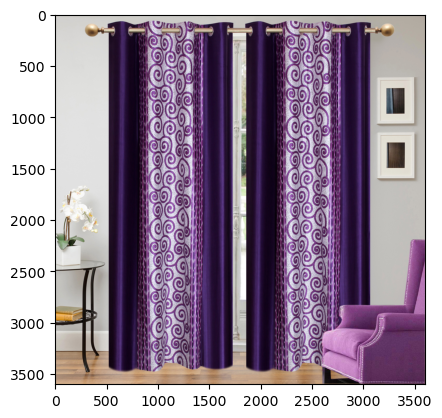

In [10]:
plt.style.use('default')
image = plt.imread("data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg")
plt.imshow(image)

### Récupération catégories de produits

Nous allons commencer par créer un dataset avec uniquement les features qui nous intéresse pour ce projet, et ensuite analyser l'arbre de chaque catégorie de produits de notre jeu de données pour en extraire les sous-catégories.

In [11]:
df_train = data.loc[:, ["description", "product_category_tree"]]

# On crée une liste de strings en supprimant les >>
df = df_train["product_category_tree"].str.split(">>")

# Et on ne récupère que la deuxième valeur de la liste
# Ce qui correspondra à notre catégorie de produits
df_train["sous_cat_1"] = df.apply(lambda x: x[0])
df_train["sous_cat_2"] = df.apply(lambda x: x[1])


In [12]:
print(df[0])

['["Home Furnishing ', ' Curtains & Accessories ', ' Curtains ', ' Elegance Polyester Multicolor Abstract Eyelet Do..."]']


In [13]:
print("Il y a {} produits dans la sous-catégorie 1.".format(len(df_train["sous_cat_1"].unique())))
print("Il y a {} produits dans la sous-catégorie 2.".format(len(df_train["sous_cat_2"].unique())))

Il y a 7 produits dans la sous-catégorie 1.
Il y a 63 produits dans la sous-catégorie 2.


### Nombre de produits dans chaque sous-catégories

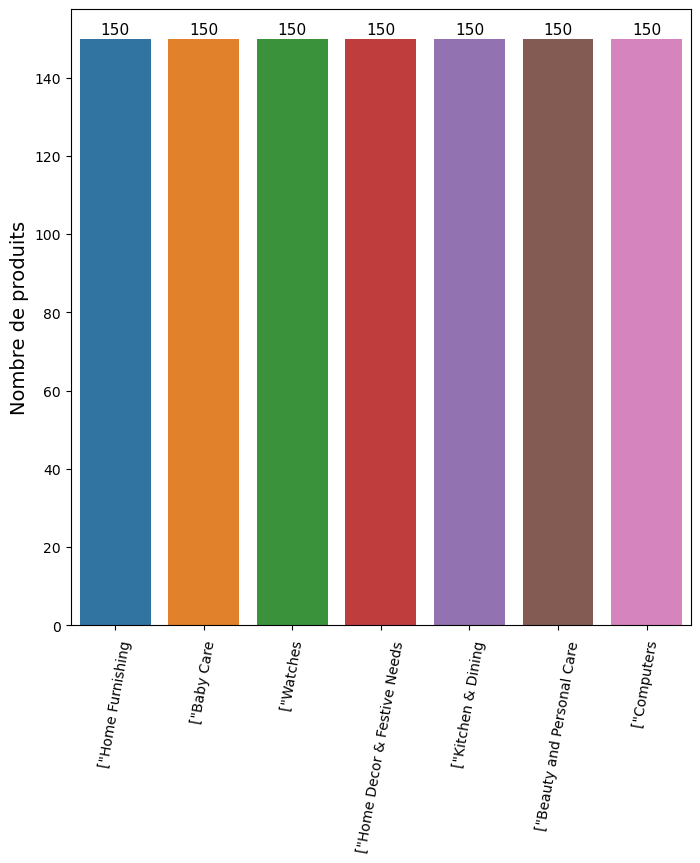

In [16]:
# On commence par faire le comptage de la sous catégorie 1
plt.figure(figsize=(8, 8))
    
plt.xticks(rotation=80)

val = df_train["sous_cat_1"].value_counts()
val = pd.DataFrame(val)

sns.barplot(x=val.index, y=val["sous_cat_1"])

plt.ylabel("Nombre de produits", size=14)

for i, v in enumerate(val["sous_cat_1"].values):
    plt.text(i, v+1, v, color='black', ha='center', size=11)


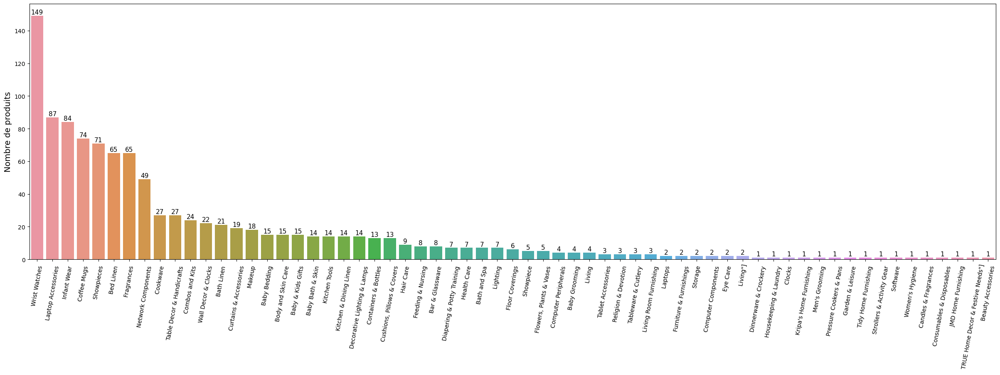

In [17]:
# On commence par faire le comptage de la sous catégorie 1
plt.figure(figsize=(30, 8))
    
plt.xticks(rotation=80)

val = df_train["sous_cat_2"].value_counts()
val = pd.DataFrame(val)

sns.barplot(x=val.index, y=val["sous_cat_2"])

plt.ylabel("Nombre de produits", size=14)

for i, v in enumerate(val["sous_cat_2"].values):
    plt.text(i, v+1, v, color='black', ha='center', size=11)


### Représentations des descriptions

Nous allons représenter les mots les plus fréquemment utilisés dans la totalité des descriptions de notre jeu de données. Sous la forme d'un nuage de mots.

In [42]:
import nltk

from nltk.tokenize import RegexpTokenizer

# Combine all training text into one large string
all_des = ' '.join([text for text in df_train["description"]])

# Ce tokenizer ne capture que les mots capitalisés
capword_tokenizer = RegexpTokenizer("[A-Z]\w+")
all_des_tokened = capword_tokenizer.tokenize(all_des)

display("Nombre de mots au total dans les descriptions:", len(all_des_tokened))

'Nombre de mots au total dans les descriptions:'

41803

(-0.5, 799.5, 499.5, -0.5)

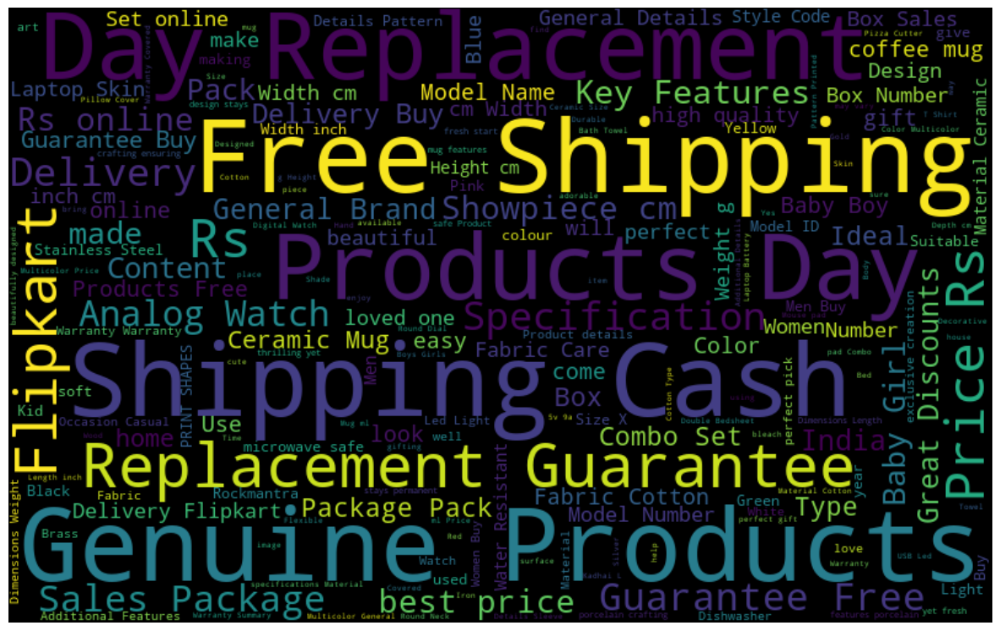

In [43]:
from wordcloud import WordCloud
# Word cloud for entire training dataset
# default width=400, height=200

wordcloud = WordCloud(width=800, height=500,
                      random_state=21, max_font_size=110).generate(all_des)
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')

Nous allons maintenant représenter sous la forme d'un histogramme les mots les plus fréquemment utilisés dans la catégorie la plus fournie en produits, "Wrist Watches". En repartant de notre tokenisation de mots capitalisés.

In [44]:
df_train["sous_cat_2"] = df_train["sous_cat_2"].str.strip()
des = df_train[df_train["sous_cat_2"] == "Wrist Watches"]

# On récupère toutes les descriptions de la catégorie
# On en forme une chaîne de caractères
des_text = ' '.join(text for text in des["description"])

# On fait une tokenisation de cete chaine
# avec le tokenizer construit précédemment
# On ne garde que les mots capitalisés
des_text_tokenized = capword_tokenizer.tokenize(des_text)

# On recrée une chaîne "propre"
des_text_tokenized = ' '.join(des_text_tokenized)

C:\Users\Zbook\AppData\Local\Temp\ipykernel_16196\862720838.py:8: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


Text(0.5, 1.0, 'Mots les plus communs dans la catégorie la plus fournie')

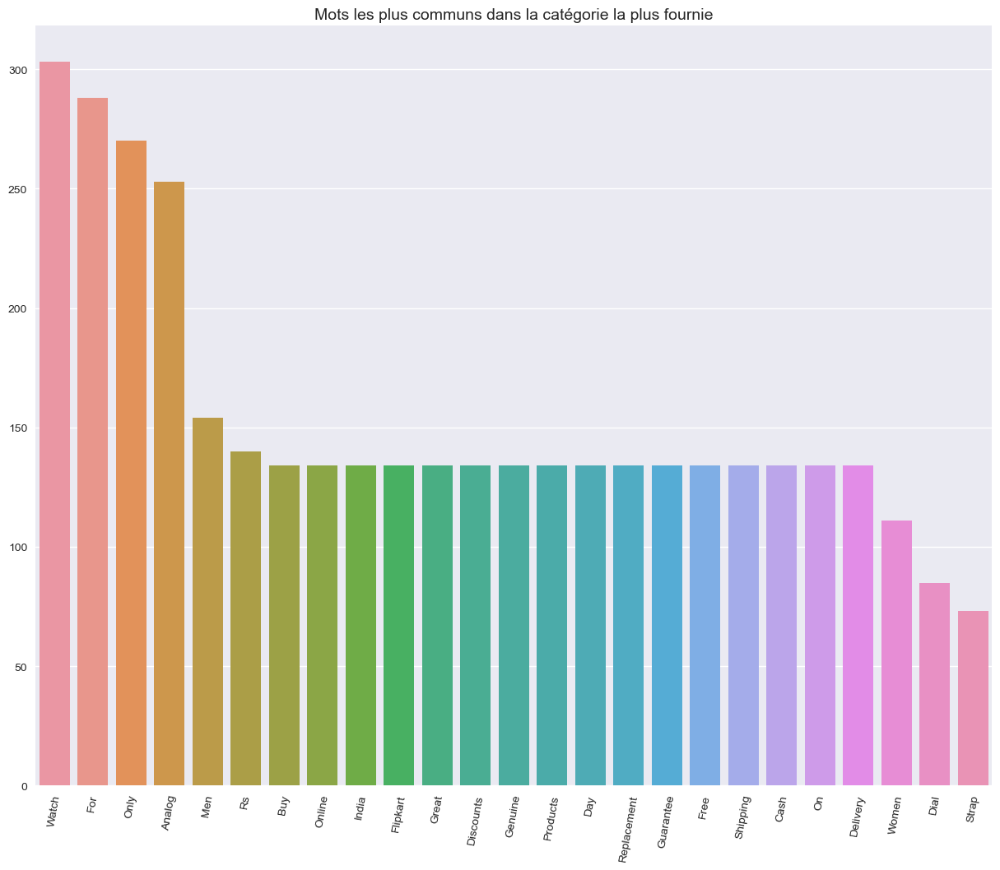

In [45]:
from collections import Counter

des_list = des_text_tokenized.split()
des_counts = Counter(des_list)
des_common_words = [word[0] for word in des_counts.most_common(25)]
des_common_counts = [word[1] for word in des_counts.most_common(25)]

plt.style.use('seaborn')
plt.figure(figsize=(15, 12))
plt.xticks(rotation=80)
sns.barplot(x=des_common_words, y=des_common_counts)
plt.title("Mots les plus communs dans la catégorie la plus fournie", size=14)

### Création de datasets d'apprentissages

des_train = serie comportant les descriptions

des_target = serie comportant les catégories de produits

In [46]:
def clean_sous_cat_1(text):
    text = text[2:]
    return text

In [47]:
des_train = df_train["description"]
des_target = df_train["sous_cat_1"]

#On nettoie le nom des catégories
des_target = des_target.apply(clean_sous_cat_1)

print(des_train[:5])
print("------------------------")
print(des_target[:5])

0    Key Features of Elegance Polyester Multicolor ...
1    Specifications of Sathiyas Cotton Bath Towel (...
2    Key Features of Eurospa Cotton Terry Face Towe...
3    Key Features of SANTOSH ROYAL FASHION Cotton P...
4    Key Features of Jaipur Print Cotton Floral Kin...
Name: description, dtype: object
------------------------
0    Home Furnishing 
1          Baby Care 
2          Baby Care 
3    Home Furnishing 
4    Home Furnishing 
Name: sous_cat_1, dtype: object


### Nettoyage de texte

Avant de commencer l'extraction des mots, nous allons nettoyer le texte de toute ponctuation et majuscules.

In [48]:
def clean_description(description):
    
    # Ce tokenizer ne capture que les mots capitalisés
    capword_tokenizer = RegexpTokenizer("[A-Z]\w+")
    des_tokenized = capword_tokenizer.tokenize(description)
    
    # On recrée une chaîne "propre"
    des_tokenized = ' '.join(des_tokenized)
    
    return des_tokenized.lower()

In [49]:
des_train = des_train.apply(clean_description)
des_train[:5]

0    key features elegance polyester multicolor abs...
1    specifications sathiyas cotton bath towel bath...
2    key features eurospa cotton terry face towel s...
3    key features santosh royal fashion cotton prin...
4    key features jaipur print cotton floral king d...
Name: description, dtype: object

## Bag of Words

Représentation des données textuelles sous forme de sacs de mots.

La représentation par sac de mots est placée dans une matrice creuse Scipy qui n'enregistre que les entrées non nulles. On utilise une matrice creuse, car la plupart des documents ne contiendront qu'un petit sous-ensemble des mots du vocabulaire, ce qui implique que l'essentiel des colonnes sera nul.
Stocker tous ces zéros serait prohibitif et un immense gaspillage de mémoire. Pour observer le contenu réel de la matrice creuse, nous pouvons le convertir en tableau Numpy "dense" (qui va donc aussi contenir toutes les entrées nulles) à l'aide de la méthode toarray.

La fonction CountVectorizer de scikit learn permet d'extraire les mots d'un texte. <b><u>Par défaut cette fonction supprime la ponctuation et passe le texte en minuscules.</u></b>

In [462]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

def preprocess_text(corpus, min_df=1, max_df=1.0, norm='l2', show_steps=True):
    """
    Prétraitement des données textuelles, comptage des mots et normalisation.

    Args:
    - corpus (list): Une liste de textes (documents ou phrases).
    - min_df (int, optional): Fréquence minimale d'un mot pour être inclus dans le vocabulaire. Par défaut, 1.
    - max_df (float, optional): Fréquence maximale d'un mot pour être inclus dans le vocabulaire (en pourcentage). Par défaut, 1.0.
    - norm (str, optional): Type de normalisation des vecteurs Tf-idf ('l1', 'l2', None). Par défaut, 'l2'.
    - show_steps (bool, optional): Afficher les étapes intermédiaires. Par défaut, True.

    Returns:
    - pd.DataFrame: Un DataFrame contenant les résultats de chaque étape.
    """

    # Étape 1 : Nettoyage du texte (vous pouvez ajouter vos étapes de nettoyage ici)
    cleaned_corpus = [text.lower() for text in corpus]

    # Étape 2 : Comptage des mots (utilisation de CountVectorizer)
    count_vectorizer = CountVectorizer(min_df=min_df, max_df=max_df)
    X_count = count_vectorizer.fit_transform(cleaned_corpus)

    if show_steps:
        print("Étape 1 : Texte nettoyé")
        for i, text in enumerate(cleaned_corpus[:3]):  # Afficher les trois premiers textes
            print(f"Exemple {i + 1}: {text}")
        print("\nÉtape 2 : Matrice de comptage des mots (Bag of Words)")
        print(pd.DataFrame(X_count.toarray(), columns=count_vectorizer.get_feature_names_out()))

    # Étape 3 : Normalisation des mots (utilisation de TfidfTransformer)
    tfidf_transformer = TfidfTransformer(norm=norm)
    X_tfidf = tfidf_transformer.fit_transform(X_count)

    # X_count et X_tfidf sont maintenant des matrices de caractéristiques bag-of-words
    print("X_count et X_tfidf sont maintenant des matrices de caractéristiques bag-of-words")
    # que vous pouvez utiliser pour l'apprentissage automatique ou l'analyse de texte.
    print("que vous pouvez utiliser pour l'apprentissage automatique ou l'analyse de texte.")
    if show_steps:
        print("\nÉtape 3 : Matrice de caractéristiques normalisée (Tf-idf)")
        print(pd.DataFrame(X_tfidf.toarray(), columns=count_vectorizer.get_feature_names_out()))

    return pd.DataFrame(X_tfidf.toarray(), columns=count_vectorizer.get_feature_names_out())

# Exemple d'utilisation
corpus = data_origine["description"]

result_df = preprocess_text(corpus, min_df=1, max_df=1.0, norm='l2', show_steps=True)


Étape 1 : Texte nettoyé
Exemple 1: key features of elegance polyester multicolor abstract eyelet door curtain floral curtain,elegance polyester multicolor abstract eyelet door curtain (213 cm in height, pack of 2) price: rs. 899 this curtain enhances the look of the interiors.this curtain is made from 100% high quality polyester fabric.it features an eyelet style stitch with metal ring.it makes the room environment romantic and loving.this curtain is ant- wrinkle and anti shrinkage and have elegant apparance.give your home a bright and modernistic appeal with these designs. the surreal attention is sure to steal hearts. these contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. bring home the elegant curtain that softly filt

iteration     object
silhouette    object
ari           object
dtype: object

In [50]:
def extract_mots(data, min_df, stopwords):
    
    vect = CountVectorizer(min_df=min_df, stop_words=stopwords).fit(data)
    X_train = vect.transform(data)
    
    return [vect, X_train]

In [56]:
def check_vocabulaire(vect):
    
    feature_names = vect.get_feature_names_out()
    print("Nombre de features :", len(feature_names))
    print("20 premières features :", feature_names[:20])
    print("20 dernières features :", feature_names[-20:])

In [57]:
def calcul_performance(X_train, des_target):
    
    param_dist = {'C': [0.001, 0.01, 0.1, 1, 10]}
    random_search = RandomizedSearchCV(LogisticRegression(),
                            param_distributions=param_dist,
                            cv=2,
                            iid=False)

    random_search.fit(X_train, des_target)
    
    return random_search

In [58]:
from sklearn.feature_extraction.text import CountVectorizer

# vect, X_train = extract_mots(des_train, 0, [])
vect, X_train = extract_mots(des_train, min_df=1, stopwords=[])

print("X_train:\n", format(repr(X_train)))

X_train:
 <1050x3777 sparse matrix of type '<class 'numpy.int64'>'
	with 27754 stored elements in Compressed Sparse Row format>


La taille de X_train, la représentation par sac de mots des données d'apprentissage, est de 1050x6053, ce qui indique que le vocabulaire contient 6053 entrées. A nouveau, les données sont enregistrées sous forme d'une matrice creuse SciPy. Regardons d'un peu plus près ce vocabulaire. Une autre manière d'y accéder consiste à utiliser la méthode get_feature_name du <i>vectorizer</i>, qui retourne une liste dans laquelle chaque entrée correspond à une caractéristique.

In [59]:
check_vocabulaire(vect)

Nombre de features : 3777
20 premières features : ['a200' 'a37' 'a5' 'a55' 'a6' 'aa' 'aaa' 'aapno' 'aari' 'aarika'
 'abkl_grn_grn_grn' 'abkl_pl_pl_pnk' 'abkl_pl_pnk_pnk' 'about' 'absorbent'
 'absorber' 'abstract' 'abstracts' 'abstrcts' 'ac']
20 dernières features : ['ym22' 'york' 'you' 'young' 'your' 'yourself' 'youth' 'youthful' 'yuva'
 'yves' 'zaicus' 'zero' 'zikrak' 'zingalalaa' 'zip' 'zipper' 'zone' 'zoom'
 'zora' 'zyxel']


On peut constater  que nous avons des formes au singulier et au pluriel ou des verbes conjugués par exemple. Or ces formes sont évidemment très proches sur le plan sémantique, et les compter en tant que termes différents dans le vocabulaire, et donc en tant que caractéristiques différentes, n'est certainement pas idéal.

Avant d'améliorer notre extraction de caractéristique, nous allons chercher une mesure quantitative des performances en constuisant un classifieur. Les étiquettes de données d'apprentissage sont enregistrées dans des_target et la représentation par sac de mots des données du jeu d'apprentissage se trouvent dans des_train. Nous sommes dans un schéma classique. Nous allons utiliser une LogisticRegression.

Commençons par évaluer <i>LogisticRegression</i> en utilisant une validation croisée.

#### Calcul performance extraction brute

In [70]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression

def calcul_performance(X_train, des_target):
    param_dist = {'C': [0.001, 0.01, 0.1, 1, 10]}
    random_search = RandomizedSearchCV(LogisticRegression(),
                            param_distributions=param_dist,
                            cv=2)
    random_search.fit(X_train, des_target)
    return random_search

random_search = calcul_performance(X_train, des_target)

print("Mean Random Search accuracy:", random_search.best_score_)


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning: The total space of parameters 5 is smaller than n_iter=10. Running 5 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean Random Search accuracy: 0.78


Nous obtenons un score de validation croisée de 79%. 

Voyons maintenant si nous pouvons améliorer l'extraction des mots. Une manière de réduire le nombre de mots (comme par exemple les fautes d'ortographes) consiste à n'utiliser que des "mots" (ou des <i>tokens</i>) qui apparaissent dans au moins deux documents (ou dans au moins cinq documents, et ainsi de suite). En effet, un mot qui ne figurerait que dans un document à une faible probabilité d'être utile. Nous pouvons définir le nombre minimum de documents requis avec le paramètre min_df.

#### Amélioration de l'extraction des mots

In [71]:
vect, X_train = extract_mots(des_train, 3, [])

print("X_train:\n", format(repr(X_train)))

X_train:
 <1050x1029 sparse matrix of type '<class 'numpy.int64'>'
	with 24503 stored elements in Compressed Sparse Row format>


In [72]:
check_vocabulaire(vect)

Nombre de features : 1029
20 premières features : ['aapno' 'abstract' 'ac' 'accessories' 'adapter' 'adaptor' 'add'
 'additional' 'adhesive' 'adidas' 'adjustable' 'aero' 'affordable' 'after'
 'age' 'air' 'akup' 'alarm' 'all' 'almond']
20 dernières features : ['wine' 'wireless' 'with' 'women' 'wood' 'wooden' 'working' 'world'
 'woven' 'wow' 'wrap' 'wrapper' 'yardley' 'year' 'yellow' 'yes' 'you'
 'your' 'yourself' 'zyxel']


En exigeant au moins 3 apparitions de chaque token dans des documents différents, nous diminuons nettement le nombre de caractéristiques (1807), soit environ 5 fois moins de la sortie obtenue précédemment.

Effectuons un nouveau calcul de performances.

#### Calcul performance extraction améliorée

In [73]:
random_search = calcul_performance(X_train, des_target)

print("Mean Random Search accuracy:", random_search.best_score_)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning: The total space of parameters 5 is smaller than n_iter=10. Running 5 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Mean Random Search accuracy: 0.78


Le résultat est resté à 79%, donc inchangé par rapport à ce que nous avons déjà vu. Nous n'avons amélioré que légèrement notre modèle, mais, en revanche,  nous avons moins de fonctionnalités susceptibles de ralentir le traitement, et nous avons aussi éliminé bon nombre de caractéristiques inutiles, ce qui pourrait rendre le modèle plus interprétable.

### Suppression des mots vides (StopWords)

Une autre manière d'éliminer des mots sans intérêt consiste à supprimer ceux qui sont tellement courants qu'ils napportent aucune information utile (par exemple les articles définis). On rencontre principalement deux approches :
 - Utiliser une liste de mots vides spécifiques à un langage
 - Eliminer des mots qui apparaissent trop féquemment
 
En fait, scikit-learn possède une liste de mots vides pour l'anglais dans son module feature_extraction_text. Il existe aussi cette possibilité avec la libririe nltk.

In [33]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

print("Nombre de stopwords :", len(ENGLISH_STOP_WORDS))
print("Tous les 10 stopwords :", list(ENGLISH_STOP_WORDS)[::10])

Nombre de stopwords : 318
Tous les 10 stopwords : ['go', 'five', 'seem', 'something', 'beside', 'and', 'moreover', 'herself', 'least', 'from', 'hereupon', 'could', 'hers', 'put', 'otherwise', 'sometime', 'then', 'seems', 'whether', 'am', 'interest', 'eight', 'upon', 'everywhere', 'less', 'ie', 'become', 'on', 'describe', 'perhaps', 'must', 'in']


Clairement, supprimer les mots vides du vocabulaire ne peut que réduire les caractéristiques de la longueur de la liste, soit ici 318. En revanche cette technique peut conduire à une amélioration des performances.

In [34]:
vect, X_train = extract_mots(des_train, 3, "english")

print("X_train:\n", format(repr(X_train)))

X_train:
 <1050x939 sparse matrix of type '<class 'numpy.int64'>'
	with 21352 stored elements in Compressed Sparse Row format>


Nous avons supprimé 1029-939 = 90 caractéristiques, ce qui signifie que la plupart des mots vides de la liste, mais pas tous, apparaissent dans nos documents.

#### Calcul performance avec suppression des StopWords

In [35]:
random_search = calcul_performance(X_train, des_target)

print("Mean Random Search accuracy:", random_search.best_score_)

C:\Users\julie\Anaconda\envs\Projet 6-2\lib\site-packages\sklearn\model_selection\_search.py:281: UserWarning: The total space of parameters 5 is smaller than n_iter=10. Running 5 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


Mean Random Search accuracy: 0.7933333333333333


C:\Users\julie\Anaconda\envs\Projet 6-2\lib\site-packages\sklearn\linear_model\_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\julie\Anaconda\envs\Projet 6-2\lib\site-packages\sklearn\model_selection\_search.py:825: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


Les performances n'ont que peu bougé. Cela est dû à la taille du jeu de données qui n'est pas très grande.

<b>Une autre approche aurait été d'éliminer les mots trop fréquemment utilisés, en utilisant l'option <i>max_df</i> de CountVectorizer.</b>

## Pondérer les données avec tf-idf

Au lieu de rejeter des caractéristiques qui sont considérées comme n'étant as importnates, une autre approche consiste à les pondérer en fonction du niveau d'informations que nous en attendons.

L'intuition formulée par cette méthode est de donner un poids élevé aux termes qui apparaissent souvent dans un document particulier, mais pas dans de nombreux documents du corpus. Si un mot apparaît souvent dans un certain document, donc s'il y a une fréquence élevée, mais très rarement ailleurs, il est probablement très représentatif du contenu de CE document.

scikit-learn implémente la méthode tf-idf dans deux classes :
 - TfidfTransformer, qui prend la matrice creuse produite par CountVectorizer et la transforme
 - TfidfVectorizer, qui prend les données textuelles et effectue l'extraction de la représentation tf-idf.

### Calcul performance avec Tf-idf

In [67]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline

pipe = make_pipeline(TfidfVectorizer(min_df=3,
                                     norm=None,
                                     stop_words="english"),
                     LogisticRegression())

param_dist = {"logisticregression__C": [0.01, 0.1, 1, 10, 100]}

random_search = RandomizedSearchCV(pipe,
                            param_distributions=param_dist,
                            cv=5)

random_search.fit(des_train, des_target)

print("Mean Random Search accuracy:", random_search.best_score_)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning: The total space of parameters 5 is smaller than n_iter=10. Running 5 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data a

Mean Random Search accuracy: 0.8676190476190475


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Le tf-idf a un impact positif car notre performance passe à 87%.

Nous pouvons aussi inspecter quels mots cette méthode a déterminé comme étant les plus importants. Tf-idf a pour but de trouver des mots qui permettent de distinguer des documents, mais il s'agit d'une technique purement non supervisée. Par conséquent, le terme "importants" n'a pas nécessairement de rapport avec les descriptions par produit, donc celles qui nous intéressent en fait.

### Analyses résultats Tf-idf

In [37]:
vectorizer = random_search.best_estimator_.named_steps["tfidfvectorizer"]
X_train = vectorizer.transform(des_train)

max_value = X_train.max(axis=0).toarray().ravel()
sorted_by_tfidf = max_value.argsort()
feature_names = np.array(vectorizer.get_feature_names())

print("Features avec basse valeur :\n", feature_names[sorted_by_tfidf[:20]])
print("Features avec haute valeur :\n", feature_names[sorted_by_tfidf[-20:]])

Features avec basse valeur :
 ['rs' 'genuine' 'guarantee' 'delivery' 'cash' 'shipping' 'discounts' 'buy'
 'additional' 'id' 'flipkart' 'summary' 'specifications' 'clasp' 'general'
 'buckle' 'comforters' 'bleach' 'wireless' 'lowest']
Features avec haute valeur :
 ['crystal' 'fragrance' 'keyboard' 'artificial' 'battery' 'hair' 'buddha'
 'sofa' 'tree' 'copper' 'bed' 'bonsai' 'ocean' 'pot' 'cutter' 'skin' 'tea'
 'plant' 'pizza' 'bowl']


Les mots avec basse valeur sont :
 - soit très courants dans l'ensemble des documents
 - soit utilisés seulement de manière modérée et uniquement dans de très longs documents
 
De manière intéressante, la plupart des résultats correspondant à une valeur tf-udf élevée identifient en fait des catégories, ou des produits précis. Ces mots fournissent certainement des tas d'informations spécifiques sur les descriptions des produits.

Nous pouvons également trouver les mots qui ont une faible fréquence inverse de document (idf), c'est à dire ceux qui apparaissent fréquemment et sont donc considérés comme étant moins importants. Les valeurs de fréquence inverse de document trouvées sur le jeu d'apprentissage sont mémorisées dans l'attribut idf_.

In [38]:
sorted_by_idf = np.argsort(vectorizer.idf_)

print("Features avec basse valeur idf :\n",
      feature_names[sorted_by_idf[:100]])

Features avec basse valeur idf :
 ['rs' 'free' 'products' 'buy' 'genuine' 'replacement' 'day' 'guarantee'
 'flipkart' 'delivery' 'cash' 'shipping' 'price' 'specifications'
 'general' 'features' 'box' 'type' 'package' 'sales' 'number' 'key' 'pack'
 'brand' 'color' 'material' 'india' 'watch' 'set' 'model' 'dimensions'
 'great' 'contents' 'online' 'ideal' 'discounts' 'analog' 'cotton'
 'showpiece' 'fabric' 'width' 'pattern' 'combo' 'baby' 'design' 'details'
 'height' 'men' 'multicolor' 'care' 'additional' 'weight' 'ceramic'
 'water' 'size' 'women' 'round' 'mug' 'yes' 'length' 'black' 'style'
 'dial' 'strap' 'resistant' 'wash' 'code' 'blue' 'warranty' 'occasion'
 'body' 'product' 'girl' 'id' 'boys' 'depth' 'printed' 'girls' 'usb'
 'laptop' 'single' 'casual' 'double' 'light' 'white' 'sleeve' 'green'
 'steel' 'cover' 'print' 'use' 'case' 'power' 'abstract' 'floral'
 'quality' 'gold' 'machine' 'boy' 'pink']


Certains mots relèvent du champs descriptif d'un produit comme <i>guarantee</i> ou <i>design</i>. On peut constater des mots comme <i>shipping</i> ou <i>prices</i> qui font partis des mots les plus fréquents, donc aussi des moins pertinents selon la mesure tf-idf, même si nous pouvons les considérer comme étant très importnats pour la tâche que nous nous sommes fixée.

In [29]:
# Importation des bibliothèques nécessaires
from nltk.stem import WordNetLemmatizer
from string import punctuation
from nltk.corpus import stopwords
# Définition des ensembles de stopwords en anglais
stopwords_en = set(["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again","against","ain't","all","allow","allows","almost","alone","along","already","also","although","always","am","among","amongst","an","and","another","any","anybody","anyhow","anyone","anything","anyway","anyways","anywhere","apart","appear","appreciate","appropriate","are","aren't","around","as","aside","ask","asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being","believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't","cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing","contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't","different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even","ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far","few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets","getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have","haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him","himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch","inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept","know","known","knows","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly","many","may","maybe","me","mean","meanwhile","merely","might","more","moreover","most","mostly","much","must","my","myself","n","name","namely","nd","near","nearly","necessary","need","needs","neither","never","nevertheless","new","next","nine","no","nobody","non","none","noone","nor","normally","not","nothing","novel","now","nowhere","o","obviously","of","off","often","oh","ok","okay","old","on","once","one","ones","only","onto","or","other","others","otherwise","ought","our","ours","ourselves","out","outside","over","overall","own","p","particular","particularly","per","perhaps","placed","please","plus","possible","presumably","probably","provides","q","que","quite","qv","r","rather","rd","re","really","reasonably","regarding","regardless","regards","relatively","respectively","right","s","said","same","saw","say","saying","says","second","secondly","see","seeing","seem","seemed","seeming","seems","seen","self","selves","sensible","sent","serious","seriously","seven","several","shall","she","should","shouldn't","since","six","so","some","somebody","somehow","someone","something","sometime","sometimes","somewhat","somewhere","soon","sorry","specified","specify","specifying","still","sub","such","sup","sure","t","t's","take","taken","tell","tends","th","than","thank","thanks","thanx","that","that's","thats","the","their","theirs","them","themselves","then","thence","there","there's","thereafter","thereby","therefore","therein","theres","thereupon","these","they","they'd","they'll","they're","they've","think","third","this","thorough","thoroughly","those","though","three","through","throughout","thru","thus","to","together","too","took","toward","towards","tried","tries","truly","try","trying","twice","two","u","un","under","unfortunately","unless","unlikely","until","unto","up","upon","us","use","used","useful","uses","using","usually","uucp","v","value","various","very","via","viz","vs","w","want","wants","was","wasn't","way","we","we'd","we'll","we're","we've","welcome","well","went","were","weren't","what","what's","whatever","when","whence","whenever","where","where's","whereafter","whereas","whereby","wherein","whereupon","wherever","whether","which","while","whither","who","who's","whoever","whole","whom","whose","why","will","willing","wish","with","within","without","won't","wonder","would","wouldn't","x","y","yes","yet","you","you'd","you'll","you're","you've","your","yours","yourself","yourselves","z","zero"])

# Importation des stopwords de NLTK en anglais
stopwords_nltk = set(stopwords.words('english'))

# Création d'un ensemble de stopwords combinant ceux en anglais, de NLTK et de ponctuation
stopwords_punct = set(punctuation)
stopwords_combined = set.union(stopwords_en, stopwords_nltk, stopwords_punct)


In [30]:
from sklearn.model_selection import train_test_split

In [31]:
train_af, test_af = train_test_split(data, test_size = 0.25, random_state=42)

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Adaptation du TfidfVectorizer aux données d'entraînement et transformation du texte en vecteurs TF-IDF
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(train_af['description'])

In [39]:
matrix_cat = tfidf.transform(train_af['description'])

In [40]:
# Importer la fonction de tokenisation de NLTK
from nltk import word_tokenize

# Définition d'une fonction pour afficher une liste
def affiche_liste(liste):
    return liste

# Exemple de description depuis le DataFrame train
description_example = train_af['description'].iloc[4]

# Affichage de la description d'origine
print('======== PRE TRAITEMENT ========')
print(affiche_liste(description_example),'\n')

# Conversion en lettres minuscules (lowercase)
description_example = description_example.lower()
print('======== LOWERCASE ========')
print(affiche_liste(description_example),'\n')

# Tokenisation du texte
description_example = word_tokenize(description_example)
print('======== TOKENIZER ========')
print(affiche_liste(description_example),'\n')

# Suppression des mots vides (stopwords)
description_example = [w for w in description_example if not w in stopwords_combined] 
print('======== STOPWORDS ========')
print(affiche_liste(description_example),'\n')

# Lemmatisation des mots
lemm = WordNetLemmatizer()
description_example = [lemm.lemmatize(el) for el in description_example]
print('======== LEMMATISATION ========')
print(affiche_liste(description_example),'\n')

# Extraction des mots et de leurs scores TF-IDF pour un exemple spécifique
transformation = []
for i, el  in enumerate(matrix_cat.todense()[4,:].tolist()[0]):
    if el !=0:
        transformation.append((tfidf.get_feature_names_out()[i], el))

# Création d'un DataFrame pour afficher les mots les plus importants avec leurs scores TF-IDF
pd.DataFrame(transformation, columns=['mot', 'tfidf']).sort_values(by='tfidf', ascending=False).head(10)

======== PRE TRAITEMENT ========
Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219 online. Epresent Mfan 1 Fan USB USB Fan at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee. 

======== LOWERCASE ========
buy epresent mfan 1 fan usb usb fan for rs.219 online. epresent mfan 1 fan usb usb fan at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee. 

======== TOKENIZER ========
['buy', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'for', 'rs.219', 'online', '.', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'at', 'best', 'prices', 'with', 'free', 'shipping', '&', 'cash', 'on', 'delivery', '.', 'only', 'genuine', 'products', '.', '30', 'day', 'replacement', 'guarantee', '.'] 

======== STOPWORDS ========
['buy', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'rs.219', 'online', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'prices', 'free', 'shipping', 'cash', '

,mot,tfidf
9,fan,0.637175
23,usb,0.454869
8,epresent,0.388319
14,mfan,0.388319
0,219,0.194159
18,prices,0.071857
3,best,0.071346
16,online,0.054523
24,with,0.053976
2,at,0.050738


## Des sacs avec plusieurs mots (n-grammes)


L'un des principaux désavantages de l'utilisation d'une représentation par sac de mots, c'est que l'ordre de ceux-ci est totalement laissé de de côté. Prenons un petit exemple, cette fois en français, en comparant deux chaînes : "c'est mal, c'est pas bien du tout" et "c'est bien, c'est pas mal du tout". La représentation par sac de mots sera exactement la même, alors que le sens des deux phrases est totalement opposé. Placer "pas" devant un autre mot, même s'il s'agit d'un exemple un peu extrême, montre la façon dont le contexte intervient. Heureusement, il existe une manière de capturer ce contexte dans une représentation par sac de mots qui consiste à prendre en compte non seulement la fréquence d'une certain <i>token</i>, mais aussi celle de paires ou de triplets de <i>tokens</i> qui apparaissent les uns à côté des autres. Les paires de <i>tokens</i> sont parfois appelées des <i>bigrammes</i>, les triplets des <i>trigrammes</i>, et plus largement les séquences de <i>n-tokens</i> sont appelées des <i>n-grammes</i>. Nous pouvons personnaliser le nombre de <i>tokens</i> qui sont considérés comme étant proches en changeant le paramètre ngram_range de CountVectorizer ou de TfidfVectorizer. Le paramètre ngram_range est un tuple qui détermine la longueur minimale et la longueur maximale des séquances de <i>tokens</i> qui sont prises en compte.

Essayons TfidfVectorizer sur notre jeu de données, et trouvons la meilleur valeur possible pour la plage des n-grammes en utilisant une recherche sur grille.

In [80]:
from sklearn.model_selection import GridSearchCV

pipe = make_pipeline(TfidfVectorizer(min_df=3,
                                     norm=None,
                                     stop_words="english"),
                     LogisticRegression())

param_grid = {"logisticregression__C": [0.001, 0.01, 0.1, 1, 10],
             "tfidfvectorizer__ngram_range": [(1, 1), (1, 2), (1, 3)]}

grid = GridSearchCV(pipe,
                    param_grid,
                    cv=5)

grid.fit(des_train, des_target)

print("Best Cross-validation score:", grid.best_score_)
print("Best parameters:\n", grid.best_params_)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Best Cross-validation score: 0.8752380952380951
Best parameters:
 {'logisticregression__C': 10, 'tfidfvectorizer__ngram_range': (1, 2)}


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Comme on peut le constater, les performances sont équivalentes en ajoutant les bigrammes et trigrammes. Nous pouvons visualiser une carte de chaleur de l'exactitude de la validation croisée sous la forme d'une fonction des paramètres nbgram_range et C.

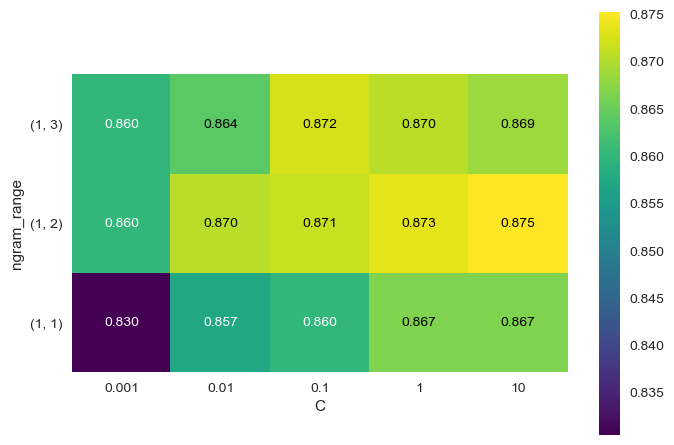

In [81]:
import mglearn

scores = grid.cv_results_["mean_test_score"].reshape(-1, 3).T

heatmap = mglearn.tools.heatmap(scores,
                               xlabel="C",
                               ylabel="ngram_range",
                               cmap="viridis",
                               fmt="%.3f",
                               xticklabels=param_grid["logisticregression__C"],
                               yticklabels=param_grid["tfidfvectorizer__ngram_range"])

plt.colorbar(heatmap)

La carte de chaleur révèle que l'utilisation de bigrammes ou trigrammes n'apporte que peu de différence en termes d'exactitude.

## Tokenisation avancée, racinisation et lemmatisation

L'extraction des caractéristiques par CountVectorizer et TfidfVectorizer est relativement simple, et des méthodes bien plus élaborées sont possibles. Une étape en particulier qui est souvent améliorée dans des applications de fouille de texte plus sophistiquées est la première du modèle de représentation par sac de mots, celle précisément du découpage en "mots", ou <i>tokenisation</i>. Cette étape définit ce qui constitue un mot en vue d'une extraction future.

Nous avons déjà vu que le vocabulaire contient souvent des mots aussi bien au singulier qu'au pluriel. Du point de vue du modèle de représentation par sac de mots, des formes comme par exemple <i>drawing</i> (dessin) et <i>drawings</i> (dessins) sont si proches que les distinguer ne ferait qu'accroître le surapprentissage et ne permettrait pas au modèle d'exploiter pleinement les données d'apprentissage. De même nous avons remarqué des mots qui sont différentes formes verbales et des noms liés aux verbes. Traiter ces variations comme des mots distincts est évidemment désavantageux pour construire un modèle qui se généralise bien.

Ce problème peut être surmonté en représentant chaque mot à partir de sa <i>racine</i> afin de repérer les éléments d'une même "famille". Si cela est réalisé en utilisant une méthode heuristique, éliminant par exemple les préfixes et suffixes courants, on parle de <i>stemming</i> ou <i>racinisation</i>. Si on se sert d'un dictionnaire de formes connues et que le rôle du mot dans la phrase est pris en compte, le processus est appelé <i>lemmatisation</i>, et la forme standardisée, <i>canonique</i>, du mot un <i>lemme</i>. Les deux types de traitement, lemmatisation et racinisation, sont des formes de <i>normalisation</i> qui essaient d'extraire une certaine forme normale à partir d'un mot. Un autre cas intéressant de normalisation du langage est la correction ortographique, domaine fort utile en pratique.

Pour commencer, nous allons comparer une méthode très courante de racinisation (l'algorithme, ou <i>stemmer</i>, de Porter, conçu pour la langue anglaise), avec la lemmatisation.

Nous allons repartir des résultats précédents, c'est-à-dire une optimisation des ngrammes avec un Tf-idf. qui nous donne une performance de 88%.

In [110]:
def lemma_tokenizer(document):
    
    doc = tokenizer(document)
    
    return [token.lemma_ for token in doc_spacy]

In [111]:
def stemm_tokenizer(document):
    
    doc = tokenizer(document)
    
    return [stemmer.stem(token.norm_.lower()) for token in doc_spacy]

In [112]:
import nltk
from nltk.tokenize import word_tokenize

# Téléchargez les données nécessaires pour NLTK si ce n'est pas déjà fait
nltk.download('punkt')

# Créez un tokenizer simple en utilisant NLTK
tokenizer = word_tokenize

lemmer = nltk.stem.WordNetLemmatizer()
stemmer = nltk.stem.PorterStemmer()

des_train = df_train["description"]
des_train = des_train.apply(clean_description)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Zbook\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [113]:
import re
import nltk
from nltk.tokenize import word_tokenize

# Téléchargez les données nécessaires pour NLTK si ce n'est pas déjà fait
nltk.download('punkt')

# Créez un tokenizer personnalisé en utilisant une expression régulière pour la tokenisation
regexp = re.compile(r"(?u)\b\w\w+\b")
custom_tokenizer = lambda string: regexp.findall(string)

lemma_vect = TfidfVectorizer(min_df=3,
                       stop_words="english",
                       decode_error="ignore",
                       ngram_range=(1, 2),
                       tokenizer=lemma_tokenizer)

stemm_vect = TfidfVectorizer(min_df=3,
                       stop_words="english",
                       decode_error="ignore",
                       ngram_range=(1, 2),
                       tokenizer=stemm_tokenizer)




[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Zbook\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [114]:
X_train_lemma = lemma_vect.fit_transform(des_train)
print("Taille vocabulaire après lemmatisation :", X_train_lemma.shape)

X_train_stemm = stemm_vect.fit_transform(des_train)
print("Taille vocabulaire après stemming :", X_train_stemm.shape)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens [''] not in stop_words.
  warnings.warn(


Taille vocabulaire après lemmatisation : (1050, 2)


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\feature_extraction\text.py:408: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['buy', 'day', 'free', 'genuin', 'guarante', 'larg', 'onli', 'product', 'replac', 'rs', 'sticker', 'uberlyf', 'vinyl'] not in stop_words.
  warnings.warn(


Taille vocabulaire après stemming : (1050, 26)


In [119]:
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer

# Téléchargez les données nécessaires pour NLTK si ce n'est pas déjà fait
nltk.download('punkt')

# Importez le lemmatiseur de NLTK
from nltk.stem import WordNetLemmatizer

# Créez un lemmatiseur
lemmatizer = WordNetLemmatizer()

# Définissez une fonction pour la tokenisation et la lemmatisation avec NLTK
def lemmatize(document):
    tokens = nltk.word_tokenize(document)
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return lemmatized_tokens

# Exemple d'utilisation avec TfidfVectorizer
lemma_vect = TfidfVectorizer(min_df=3,
                             stop_words="english",
                             decode_error="ignore",
                             ngram_range=(1, 2),
                             tokenizer=lemmatize)

X_train_lemma = lemma_vect.fit_transform(des_train)
print("Taille vocabulaire après lemmatisation :", X_train_lemma.shape)

X_train_stemm = stemm_vect.fit_transform(des_train)
print("Taille vocabulaire après stemming :", X_train_stemm.shape)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Zbook\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Taille vocabulaire après lemmatisation : (1050, 2330)
Taille vocabulaire après stemming : (1050, 26)


Ces différentes analyses nous montre que la lemmatisation "simplifie" moins le texte que la racinisation puisqu'elle nous ressort plus de mots. Cependant, afin de nous assurer que celle-ci est moins performante que le stemming, nous allons comparer les performances d'une extraction sans tokenisation avancée, puis avec une lemmatisation, et enfin avec du stemming. Cela nous permettra de choisir quelle extraction nous utiliserons pour la suite du projet.

In [121]:
import nltk

# Téléchargez les données nécessaires pour NLTK si ce n'est pas déjà fait
nltk.download('punkt')

from nltk.stem import PorterStemmer

stemmer = PorterStemmer()

def tokenize_and_stem(text):
    tokens = nltk.word_tokenize(text)
    stems = [stemmer.stem(token) for token in tokens]
    return stems


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Zbook\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [122]:
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

# -----------------------SANS LEMMATISATION NI STEMMING---------------------------

pipe = make_pipeline(TfidfVectorizer(min_df=3,
                                     norm=None,
                                     stop_words="english"),
                     LogisticRegression())

param_grid = {"logisticregression__C": [0.001, 0.01, 0.1, 1, 10],
             "tfidfvectorizer__ngram_range": [(1, 1), (1, 2), (1, 3)]}

grid = GridSearchCV(pipe,
                    param_grid,
                    cv=5)

grid.fit(des_train, des_target)

print("Best Cross-validation score (TfidfVectorizer sans lemmatisation ni stemming):", grid.best_score_)
print(des_train[:5])

# -----------------------LEMMATISATION---------------------------

lemma_vect = TfidfVectorizer(min_df=3,
                             stop_words="english",
                             decode_error="ignore",
                             ngram_range=(1, 2))

pipe = make_pipeline(lemma_vect,
                     LogisticRegression())

param_grid = {"logisticregression__C": [0.001, 0.01, 0.1, 1, 10],
             "tfidfvectorizer__ngram_range": [(1, 1), (1, 2), (1, 3)]}

grid = GridSearchCV(pipe,
                    param_grid,
                    cv=5)

# On crée une liste avec les descriptions lemmatisées
des_train_lemm = []

for doc in des_train:
    tokens = tokenize_and_lemmatize(doc)
    des_lemm = ' '.join(tokens)
    des_train_lemm.append(des_lemm)

grid.fit(des_train_lemm, des_target)

print("Best Cross-validation score (Lemmatisation):", grid.best_score_)
print(des_train_lemm[:5])

# -----------------------STEMMING---------------------------

stemm_vect = TfidfVectorizer(min_df=3,
                             stop_words="english",
                             decode_error="ignore",
                             ngram_range=(1, 2))

pipe = make_pipeline(stemm_vect,
                     LogisticRegression())

param_grid = {"logisticregression__C": [0.001, 0.01, 0.1, 1, 10],
             "tfidfvectorizer__ngram_range": [(1, 1), (1, 2), (1, 3)]}

grid = GridSearchCV(pipe,
                    param_grid,
                    cv=5)

# On crée une liste avec les descriptions stemmatisées
des_train_stemm = []

for doc in des_train:
    tokens = tokenize_and_stem(doc)
    des_stemm = ' '.join(tokens)
    des_train_stemm.append(des_stemm)

grid.fit(des_train_stemm, des_target)

print("Best Cross-validation score (Stemming):", grid.best_score_)
print(des_train_stemm[:5])


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Best Cross-validation score (TfidfVectorizer sans lemmatisation ni stemming): 0.8752380952380951
0    key features elegance polyester multicolor abs...
1    specifications sathiyas cotton bath towel bath...
2    key features eurospa cotton terry face towel s...
3    key features santosh royal fashion cotton prin...
4    key features jaipur print cotton floral king d...
Name: description, dtype: object
Best Cross-validation score (Lemmatisation): 0.8771428571428572
['key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price r this this it metal ring it this give the these bring specification elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed for door type eyelet model name abstract polyester door curtain set of model id duster25 color multicolor dimension length in box number content sale package pack sale package curtain body desig

Nous pouvons constater, dans notre cas, que les performances sont assez similaires suivant les trois types de traitements. Cependant, le meilleur score est celui du traitement sans lemmatisation ni stemming. Nous allons choisir comme extraction de texte, la définition suivante :

 - On ne garde que les mots capitalisés
 - On ne garde que les mots apparaissants au moins 3 fois
 - On supprime les stopwords
 - On fait un Tf-idf
 - On utilise des bigrammes

## L'Allocation de Dirichlet latente (LDA)

Intuitivement, le modèle LDAessaie de trouver des groupes de mots (les sujets, ou topics) qui apparaissent fréquemment ensemble. Ce modèle nécessite aussi que chaque document puisse être compris comme un "mélange" d'un sous-ensemble du sujet. Il est indispensable avant tout de bien comprendre que, du point de vue du modèle d'apprentissage automatique, un sujet peut parfaitement être pris pour quelque chose de différent de ce que nous, humains, pourrions appelér ainsi dans la vie quotidienne. En l'occurence, cela ressemble davantage aux composants extraits par les méthodes PCA ou NMF et qui peuvent ou non avoir une signification sémantique. De plus, même s'il existe une telle signification pour un "sujet" LDA, il pourrait ne pas s'agir pour autant de quelque chose que nous appelerions généralement un <i>sujet</i>.

Prenons l'exemple d'articles d'informations quotidiens. Supposons que nous disposons d'une série d'articles concernant le sport, la politique, la finance, mais écrits par deux journalistes différents. Dans un article politique, on peut s'attendre à trouver des mots comm <i>président, vote, parti, etc.</i> De même, dans un article de sport, on peut s'attendre à trouver des mots comme <i>équipe, score, saison, etc.</i> Des mots de chacun de ces groupes devraient probablement apparaître à proximité les uns des autres, tandis que ce genre de rencontre pour les mots <i>président</i> et <i>saison</i> est nettement moins vraisemblable. Cependant, nos deux journalistes peuvent aussi avoir leurs préférences dans la manière de tourner les phrases ou de choisir les mots. Ainsi, l'un d'entre eux pourrait aimer placer dans ses articles le verbe "démarquer", et l'autre le verbe "polariser". Dans ce cas, des sujets <i>autres</i> pourraient être "mots souvent employés par le journaliste A" et "mots souvent employés par le journaliste B", qui ne sont bien sûr pas pour nous des sujets au sens usuel du terme.

Essayons d'appliquer le modèle LDA à notre jeu de données de descriptions de produits afin de voir en pratique coment il fonctionne. Pour ce type de modèle d'apprentissage non supervisé appliqué à des documents textuels, il est souvent bon d'éliminer les mots très courants du fait qu'ils pourraient avoir un poids trop élevé lors de l'analyse. Nous allons reconfigurer nots données avec l'itération expliquée ci-dessus.

In [123]:
vect = TfidfVectorizer(min_df=3,
                norm=None,
                stop_words="english",
                ngram_range=(1,2))

X = vect.fit_transform(des_train)

Nous allons enregistrer les vecteurs que nous a calculé le tf-idf dans notre dataframe.

In [141]:
tfidf_vect = X.toarray().astype("float32")

df_train["tf_idf"] = ""

for i in range(df_train.shape[0]):
    df_train["tf_idf"][i] = tfidf_vect[i]

df_train.head()

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...","[""Home Furnishing",Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...","[""Baby Care",Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...","[""Baby Care",Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...","[""Home Furnishing",Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,Key Features of Jaipur Print Cotton Floral Kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...","[""Home Furnishing",Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


Nous allons entraîner un modèle avec 10 sujets, ce qui est suffisamment restreint pour que nous puissions les observer simultanément. De manière semblablel aux composants dans NMF, les sujets n'ont pas d'ordre inhérent, et modifier leur nombre change tous les sujets (en fait, NMF et LDA résolvent des problèmes assez similaires, et nous pourrions aussi nous servir de NMF pour extraire des sujets). Nous utiliserons ici la méthode d'apprentissage "batch", qui est un peu plus lente que la méthode ("online"), mais qui fournit généralement de meilleurs résultats, et nous augmenterons également "max_iter", ce qui peut améliorer les modèles.

In [142]:
from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_components=7,
                                learning_method="batch",
                                max_iter=25,
                                random_state=0)

document_topics = lda.fit_transform(X)

LatentDirichletAllocation possède un attribut components_ qui mémorise l'importance de chaque mot pour chaque sujet. La taille de components_ est de (n_topics, n_words).

In [143]:
print("lda_components.shape :", lda.components_.shape)

lda_components.shape : (7, 2371)


Pour mieux regarder la signification des différents sujets, nous allons regarder quels sont les mots les plus importants pour chacun d'entre eux. La fonction print_topics permet de présenter clairement ces caractéritiques.

In [145]:
sorting = np.argsort(lda.components_, axis=1)[:,::-1]
feature_names = np.array(vect.get_feature_names_out())

mglearn.tools.print_topics(topics=range(7),
                          feature_names=feature_names,
                          sorting=sorting,
                          topics_per_chunk=7,
                          n_words=10)

topic 0       topic 1       topic 2       topic 3       topic 4       topic 5       topic 6       
--------      --------      --------      --------      --------      --------      --------      
usb           warranty      flipkart      usb           pack          steel         baby          
dress         ceramic       watch         mugs          features      pizza         details       
light         mug           genuine productssticker       model         maxima        baby girl     
led           rockmantra    genuine       printland     number        strap         girl          
hair          vgn           buy           smart         material      dial          fabric        
gathered      vaio          products      wall          package       stainless     boy           
brass         adapter       free          mug           cover         laptop        baby boy      
led light     product       delivery      happy         width         stainless steelcotton        
power  

On peut constater que les définitions de topics ne sont pas aisées. Puisque nous n'utilisons que 10 sujets, chacun doit représenter un champ très large, de manière à ce qu'ils puissent tous ensembles couvrir la totalité des descriptions de produits de notre jeu de données.

Pour avoir une analyse plus précise, nous devons augmenter le nombre de topics. Essayons donc de couvrir les sous catégories 2 vues précédemment et qui sont au nombre de 63.

In [147]:
import random

n_topics = 63

lda50 = LatentDirichletAllocation(n_components=n_topics,
                                learning_method="batch",
                                max_iter=25,
                                random_state=0)

document_topics50 = lda50.fit_transform(X)

sorting = np.argsort(lda50.components_, axis=1)[:,::-1]
feature_names = np.array(vect.get_feature_names_out())

# On n'affiche que 10 sujets pris au hasard parmis les 50
mglearn.tools.print_topics(topics=random.sample(range(0, n_topics), 10),
                          feature_names=feature_names,
                          sorting=sorting,
                          topics_per_chunk=5,
                          n_words=10)

topic 60      topic 35      topic 0       topic 44      topic 59      
--------      --------      --------      --------      --------      
hair          cream         wall          bulb          skin          
conditioner   oxyglow       painting      led bulb      anti          
traits        massage       bazaar        brush         indian        
quantity      massage cream intellect bazaarled           usb           
general traitsfruit         intellect     krishna       power         
hair type     fruit massage small         photo         light         
ideal         cream vitamin blanket       makeup        laptops       
applied       vitamin       handicrafts showpiecephoto frame   led           
wall clock    glow          room          extender      cap           
hair hair     rs oxyglow    mdf           frame         purple        


topic 25      topic 50      topic 38      topic 4       topic 34      
--------      --------      --------      --------      --------  

Les sujets extraits semblent cette fois être plus spécifiques, quoique nombre d'entres eux soient difficiles à interpréter. Si nous voulons obtenir des inférences supplémentaires en utilisant les sujets que nous venons de découvrir, nous devrions confirmer nos premières intuitions en regardant les mots qui ont obtenu le classement le plus élevé pour chaque sujet, et ce en observant les documents associés à ces sujets. Prenons par exemple le sujet 17. La première intuition est évidemment qu'il concerne le materiel informatique et téléphonie mobile. Regardons alors quelles types de descriptions sont assignées à ce sujet.

In [148]:
informatique = np.argsort(document_topics50[:, 17])[::-1]
print("Nombre de descriptions assignées au sujet :", 17)
for i in informatique[:10]:
    print(df_train.loc[i, "description"])
    print(df_train.loc[i, "description"] + ".\n")


Nombre de descriptions assignées au sujet : 17
Key Features of PRINT SHAPES Graphic Dancer Laptop Skin with Mouse pad Combo Set Glue Free Removal 15.6 inches Laptop skin Easy to Apply & Scratch Resistant Lamination,PRINT SHAPES Graphic Dancer Laptop Skin with Mouse pad Combo Set (Multicolor) Price: Rs. 329 Print Shapes Laptop skin made on High Quality vinyl sheet is compatible with laptops screen sizes ranging from 14.1 inches to 15.6 inches. Trimning of the skin would be required as per your laptop size. The skins are easy to install & remove without leaving any gum or residue,Specifications of PRINT SHAPES Graphic Dancer Laptop Skin with Mouse pad Combo Set (Multicolor) General Brand PRINT SHAPES Model Name Graphic Dancer Laptop Skin with Mouse pad Suitable_for All types of Laptop Color Multicolor Warranty Warranty Summary No Warranty In the Box Number of Contents in Sales Package Pack of 2
Key Features of PRINT SHAPES Graphic Dancer Laptop Skin with Mouse pad Combo Set Glue Free Rem

Comme nous pouvons le voir, ce thème couvre une large variété de produitsconcernant l'informatique, allant de PC portable jusqu'aux petits accessoire. Une autre manière intéressante d'inspecter les sujets consiste à observer leurs poids en sommant l'attribut document_topics sur toutes les descriptions. Dans ce qui suit nous nommerons chaque sujet à partir des deux mots les plus courants.

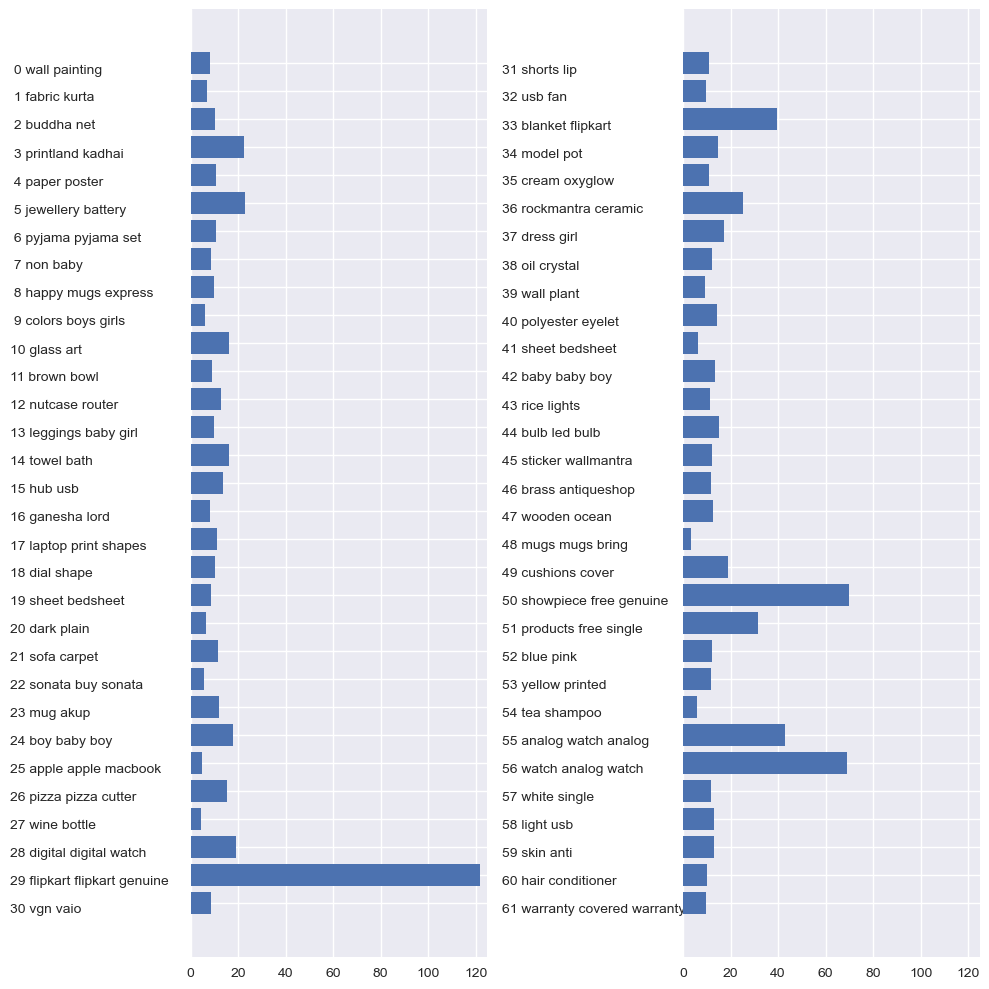

In [149]:
fig, ax = plt.subplots(1, 2, figsize=(10,10))

topic_names = ["{:>2} ".format(i) + " ".join(words) for i, words in enumerate(feature_names[sorting[:, :2]])]

for col in [0, 1]:
    start = col * 31
    end = (col+1) * 31
    ax[col].barh(np.arange(31), np.sum(document_topics50, axis=0)[start:end])
    ax[col].set_yticks(np.arange(31))
    ax[col].set_yticklabels(topic_names[start:end], fontdict={"horizontalalignment":"left", "verticalalignment":"top"})
    ax[col].invert_yaxis()
    ax[col].set_xlim(0,125)
    yax = ax[col].get_yaxis()
    yax.set_tick_params(pad=130)

plt.tight_layout()

### Recherche des topics dominants

Pour classifier l'appartenance d'un document à un topic particulier, une approche logique est de voir quel topic à la contribution la plus grande pour ce document et l'assigner.

Nous allons créer une table où tous les topics majeurs dans un documents ont été passés en vert dans sa propre colonne.

In [150]:
#### Create Document - Topic Matrix
lda_output = lda50.transform(X)

# column names
topicnames = ["Topic" + str(i) for i in range(n_topics)]

# index names
docnames = ["Description" + str(i) for i in range(len(df_train["description"]))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,Topic11,Topic12,Topic13,Topic14,Topic15,Topic16,Topic17,Topic18,Topic19,Topic20,Topic21,Topic22,Topic23,Topic24,Topic25,Topic26,Topic27,Topic28,Topic29,Topic30,Topic31,Topic32,Topic33,Topic34,Topic35,Topic36,Topic37,Topic38,Topic39,Topic40,Topic41,Topic42,Topic43,Topic44,Topic45,Topic46,Topic47,Topic48,Topic49,Topic50,Topic51,Topic52,Topic53,Topic54,Topic55,Topic56,Topic57,Topic58,Topic59,Topic60,Topic61,Topic62,dominant_topic
Description0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.280000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.610000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.110000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,40
Description1,0.000000,0.000000,0.000000,0.000000,0.160000,0.000000,0.000000,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.180000,0.000000,0.000000,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.280000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53
Description2,0.000000,0.000000,0.000000,0.000000,0.140000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.120000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.360000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060000,0.000000,0.000000,0.140000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.140000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29
Description3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19
Description4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19
Description5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.890000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

Regardons la distribution des topics sur l'ensemble de nos descriptions.

In [151]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,29,153
1,56,76
2,50,71
3,55,48
4,33,41
...,...,...
57,7,5
58,9,4
59,25,4
60,48,3


In [152]:
print("Mots caractérisant le topic 40:")
mglearn.tools.print_topics(topics=[40],
                          feature_names=feature_names,
                          sorting=sorting,
                          topics_per_chunk=5,
                          n_words=10)
print("Description0 :")
print(df_train["description"][0])

Mots caractérisant le topic 40:
topic 40      
--------      
polyester     
eyelet        
door          
curtain       
aroma comfort 
comfort       
aroma         
door curtain  
curtain height
comfort polyester


Description0 :
Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morni

In [153]:
print("Mots caractérisant le topic 53:")
mglearn.tools.print_topics(topics=[53],
                          feature_names=feature_names,
                          sorting=sorting,
                          topics_per_chunk=5,
                          n_words=10)
print("Description1 :")
print(df_train["description"][1])

Mots caractérisant le topic 53:
topic 53      
--------      
yellow        
printed       
multicolor    
length width  
table         
model         
cover         
seater        
length        
width         


Description1 :
Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel


## Mise en forme des données

Afin de parvenir à notre clustering, nous devons tout d'abord mettre en forme nos données. Nous allons repartir de nos données originales pour les nettoyées avec une autre méthode. Et pour l'encodage vectoriel, nous allons utiliser <b>Word2Vect</b> afin de <i>parser</i> tous les documents (descriptions). Nous allons donc tranformer les descriptions en vecteurs. Chauque descriptions deviendra un array de float32 de taille 300.

In [154]:
# try:
#     import spacy
#     nlp = spacy.load('en_core_web_sm')
# except Exception as e:
#     # Un message d'erreur peut apparaître.
#     # cymem.cymem.Pool has the wrong size, try recompiling. Expected 64, got 48
#     # Sous Windows:
#     # pip install http://www.xavierdupre.fr/enseignement/setup/cymem-1.31.2-cp37-cp37m-win_amd64.whl
#     # pip install http://www.xavierdupre.fr/enseignement/setup/thinc-6.10.2-cp37-cp37m-win_amd64.whl
#     # pip install http://www.xavierdupre.fr/enseignement/setup/spacy-2.0.12-cp37-cp37m-win_amd64.whl
#     print(e)

[E050] Can't find model 'en_core_web_sm'. It doesn't seem to be a Python package or a valid path to a data directory.


In [155]:
# import string

# punctuations = string.punctuation

# # Define function to cleanup text by removing personal pronouns, stopwords, and puncuation
# def cleanup_text(docs, logging=False):
#     texts = []
#     counter = 1
#     for doc in docs:
#         if counter % 100 == 0 and logging:
#             print("Processed %d out of %d documents." % (counter, len(docs)))
#         counter += 1
#         doc = nlp(doc, disable=['parser', 'ner'])
#         tokens = [tok.lemma_.lower().strip() for tok in doc if tok.lemma_ != '-PRON-']
#         tokens = [tok for tok in tokens if tok not in stopwords and tok not in punctuations]
#         tokens = ' '.join(tokens)
#         texts.append(tokens)
        
#     return pd.Series(texts)

In [157]:
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk

nltk.download('stopwords')
nltk.download('wordnet')

# Chargement des stopwords et initialisation du lemmatiseur
stopwords = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# Fonction pour nettoyer le texte
def cleanup_text(docs, logging=False):
    texts = []
    counter = 1
    for doc in docs:
        if counter % 100 == 0 and logging:
            print("Processed %d out of %d documents." % (counter, len(docs)))
        counter += 1
        
        # Tokenisation
        tokens = nltk.word_tokenize(doc.lower())
        
        # Lemmatisation et suppression des stopwords et de la ponctuation
        tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stopwords and token not in string.punctuation]
        
        # Reconstitution du texte
        cleaned_text = ' '.join(tokens)
        texts.append(cleaned_text)
        
    return pd.Series(texts)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Zbook\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Zbook\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [158]:
# Cleanup text and make sure it retains original shape
print('Original training data shape: ', df_train["description"].shape)
train_cleaned = cleanup_text(df_train["description"], logging=True)
print('Cleaned up training data shape: ', train_cleaned.shape)

Original training data shape:  (1050,)
Processed 100 out of 1050 documents.
Processed 200 out of 1050 documents.
Processed 300 out of 1050 documents.
Processed 400 out of 1050 documents.
Processed 500 out of 1050 documents.
Processed 600 out of 1050 documents.
Processed 700 out of 1050 documents.
Processed 800 out of 1050 documents.
Processed 900 out of 1050 documents.
Processed 1000 out of 1050 documents.
Cleaned up training data shape:  (1050,)


In [159]:
train_cleaned.head()

0    key feature elegance polyester multicolor abst...
1    specification sathiyas cotton bath towel 3 bat...
2    key feature eurospa cotton terry face towel se...
3    key feature santosh royal fashion cotton print...
4    key feature jaipur print cotton floral king si...
dtype: object

Une fois le texte nettoyé, nous allons faire ce que l'on appelle du <i>parsing</i>, c'est à dire que l'on va parcourir tous les documents pour les mettre en forme avant de les passer dans le modèle de clustering.

In [171]:
# from time import time

# # Parse documents and print some info
# print('Parsing documents...')

# start = time()

# train_vec = []
# for doc in nlp.pipe(train_cleaned, batch_size=500):
#     if doc.has_vector:
#         train_vec.append(doc.vector)
#     # If doc doesn't have a vector, then fill it with zeros.
#     else:
#         train_vec.append(np.zeros((128,), dtype="float32"))
        
# train_vec = np.array(train_vec)

# end = time() 


In [ ]:

from time import time
import numpy as np
import nltk
from gensim.models import Word2Vec

gensim.models.download('gensim.models.Word2Ve')
# Téléchargez un modèle Word2Vec pré-entraîné (par exemple, Google News Word2Vec)
# Assurez-vous d'importer le modèle approprié et de charger les données nécessaires

# Parsez les documents et imprimez quelques informations
print('Parsing documents...')

start = time()

# Créez une instance du modèle Word2Vec pré-entraîné (remplacez 'path_to_word2vec_model' par le chemin de votre modèle)
word2vec_model = Word2Vec.load('path_to_word2vec_model')

train_vec = []
for doc in train_cleaned:
    # Pour chaque document, obtenez sa représentation vectorielle en utilisant le modèle Word2Vec
    doc_tokens = nltk.word_tokenize(doc.lower())
    doc_vector = np.mean([word2vec_model[word] for word in doc_tokens if word in word2vec_model], axis=0)
    
    # Si le document n'a pas de représentation vectorielle valide, remplissez-le de zéros
    if doc_vector is None:
        doc_vector = np.zeros((word2vec_model.vector_size,), dtype="float32")
    
    train_vec.append(doc_vector)

train_vec = np.array(train_vec)

end = time()


In [64]:
print('Total time passed parsing documents: {} seconds'.format(end - start))
print('Total number of documents parsed: {}'.format(len(train_vec)))
print('Number of words in first document: ', len(df_train["description"][0]))
print('Number of words in second document: ', len(df_train["description"][1]))
print('Size of vector embeddings: ', train_vec.shape)
print('Shape of vectors embeddings matrix: ', train_vec.shape)

Total time passed parsing documents: 5.234421730041504 seconds
Total number of documents parsed: 1050
Number of words in first document:  1420
Number of words in second document:  444
Size of vector embeddings:  (1050, 96)
Shape of vectors embeddings matrix:  (1050, 96)


In [176]:
all_text = pd.DataFrame(df_train, columns=["description"])

print('Number of total text documents:', len(all_text))

Number of total text documents: 1050


In [172]:
from transformers import BertTokenizer, BertModel
import torch

def encode_with_bert(texts, model_name='bert-base-uncased'):
    """
    Encode une liste de phrases avec BERT.

    Args:
    texts (list): Liste de phrases.
    model_name (str): Nom du modèle BERT pré-entraîné.

    Returns:
    torch.Tensor: Les embeddings des phrases.
    """
    tokenizer = BertTokenizer.from_pretrained(model_name)
    model = BertModel.from_pretrained(model_name)

    input_ids = tokenizer(texts, return_tensors="pt", padding=True, truncation=True).input_ids
    outputs = model(input_ids)
    sentence_embeddings = torch.mean(outputs.last_hidden_state, dim=1)
    
    return sentence_embeddings

# Exemple d'utilisation
# texts = ["Hello, how are you?", "This is another sentence"]
# Exemple de description depuis le DataFrame train
description_example = df_train['description'].iloc[4]

bert_embeddings = encode_with_bert(description_example)
bert_embeddings

tensor([[-9.4021e-02, -2.9146e-02,  4.6952e-01, -3.0623e-02,  3.9867e-01,
         -1.7665e-01, -1.6236e-05,  3.5967e-01,  7.3603e-02, -9.3743e-02,
          9.8127e-03, -5.2392e-01, -3.0431e-02,  4.3858e-01, -2.9220e-01,
          4.3036e-01,  2.7268e-01,  6.3349e-02, -2.2681e-01,  2.5400e-01,
          5.7116e-01, -2.0690e-01,  3.4550e-02,  4.5737e-01,  2.3544e-01,
         -6.7621e-02,  1.1306e-01,  2.2832e-02,  1.4110e-01,  5.9371e-02,
          5.0839e-01,  8.1406e-02, -5.0256e-02, -1.2258e-01,  4.2087e-01,
         -1.3788e-01, -2.0721e-01,  4.4601e-03, -1.8902e-01,  1.5709e-01,
         -3.7609e-01, -2.8341e-01, -2.2375e-02, -3.2211e-02, -2.5398e-01,
         -1.7931e-01,  1.9198e-02,  1.2296e-01, -1.6139e-01,  2.1508e-01,
         -1.4844e-01,  2.0538e-01, -1.1922e-01, -2.6250e-01,  3.1684e-01,
          6.4786e-01,  3.5757e-02, -1.3180e-01, -3.2027e-01, -1.6303e-01,
          1.6238e-01, -2.2374e-01,  9.4102e-02, -9.6309e-02,  1.7991e-01,
          2.1243e-01, -1.9782e-02,  1.

In [138]:
# import tensorflow_hub as hub
# import numpy as np

# def get_sentence_embeddings(sentences):
#     module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"
#     embed = hub.load(module_url)
    
#     embeddings = embed(sentences)
    
#     return embeddings

# sentences = ["Hello world", "The quick brown fox"]

# embeddings = get_sentence_embeddings(sentences)

# # Maintenant, vous pouvez imprimer la forme des embeddings
# print(embeddings)

In [177]:
# # Define function to preprocess text for a word2vec model
# def cleanup_text_word2vec(docs, logging=False):
    
#     sentences = []
#     counter = 1
    
#     for doc in docs:
        
#         if counter % 100 == 0 and logging:
#             print("Processed %d out of %d documents" % (counter, len(docs)))
            
#         # Disable tagger so that lemma_ of personal pronouns (I, me, etc) don't getted marked as "-PRON-"
#         doc = nlp(doc, disable=['tagger'])
#         # Grab lemmatized form of words and make lowercase
#         doc = " ".join([tok.lemma_.lower() for tok in doc])
#         # Split into sentences based on punctuation
#         doc = re.split("[\.?!;] ", doc)
#         # Remove commas, periods, and other punctuation (mostly commas)
#         doc = [re.sub("[\.,;:!?]", "", sent) for sent in doc]
#         # Split into words
#         doc = [sent.split() for sent in doc]
#         sentences += doc
#         counter += 1
        
#     return sentences

In [179]:
import re

# Define function to preprocess text for a word2vec model
def cleanup_text_word2vec(docs, logging=False):
    
    sentences = []
    counter = 1
    
    for doc in docs:
        
        if counter % 100 == 0 and logging:
            print("Processed %d out of %d documents" % (counter, len(docs)))
            
        # Split into sentences based on punctuation
        doc = re.split("[\.?!;] ", doc)
        # Remove commas, periods, and other punctuation (mostly commas)
        doc = [re.sub("[\.,;:!?]", "", sent) for sent in doc]
        # Split into words
        doc = [sent.split() for sent in doc]
        sentences += doc
        counter += 1
        
    return sentences


In [180]:
%%time

train_cleaned_word2vec = cleanup_text_word2vec(all_text["description"], logging=True)
print('Cleaned up training data size (i.e. number of sentences): ', len(train_cleaned_word2vec))

Processed 100 out of 1050 documents
Processed 200 out of 1050 documents
Processed 300 out of 1050 documents
Processed 400 out of 1050 documents
Processed 500 out of 1050 documents
Processed 600 out of 1050 documents
Processed 700 out of 1050 documents
Processed 800 out of 1050 documents
Processed 900 out of 1050 documents
Processed 1000 out of 1050 documents
Cleaned up training data size (i.e. number of sentences):  5022
CPU times: total: 31.2 ms
Wall time: 30 ms


Nous devons ensuite indiquer au modèle <b>Word2Vec</b> par combien de vecteurs il faut représenter l'ensemble des mots.

In [185]:
# Importer la classe Word2Vec du module gensim.models.word2vec
from gensim.models import Word2Vec

# Définir la dimension de l'espace vectoriel des mots
text_dim = 1000

# Afficher un message pour indiquer le début de l'entraînement du modèle Word2Vec
print("Entraînement du modèle Word2Vec en cours...")

# Créer une instance de modèle Word2Vec en utilisant les données d'entraînement
wordvec_model = Word2Vec(train_cleaned_word2vec, window=5, min_count=3, workers=4, sg=1)

# Afficher un message pour indiquer la création réussie du modèle Word2Vec
print("Modèle Word2Vec créé.")
# Afficher le nombre de mots uniques représentés par des vecteurs de dimension text_dim
print("%d mots uniques représentés par des vecteurs de %d dimensions" % (len(wordvec_model.wv.index_to_key), text_dim))


Entraînement du modèle Word2Vec en cours...
Modèle Word2Vec créé.
3416 mots uniques représentés par des vecteurs de 1000 dimensions


On peut ainsi demander au modèle quels sont les mots les plus similaires à d'autres d'après ces données : par exemple

In [186]:
print(wordvec_model.wv.most_similar(positive=["watch"]))
print(wordvec_model.wv.most_similar(positive=["price"]))

[('spreading', 0.9815682172775269), ('taste', 0.9801879525184631), ('bag', 0.9800444841384888), ('drink', 0.9786615371704102), ('purchase', 0.9785183072090149), ('time', 0.9783584475517273), ('silver', 0.9780101776123047), ('offers', 0.97784823179245), ('amazing', 0.9770587682723999), ('known', 0.9753052592277527)]
[('done', 0.9856410622596741), ('stickerswall', 0.9824137687683105), ('provided', 0.9819170832633972), ('pin', 0.9817690253257751), ('promise', 0.9816362857818604), ('same', 0.9814287424087524), ('decoration', 0.9801368713378906), ('items', 0.9799048900604248), ('customers', 0.979134202003479), ('circuit', 0.9789474606513977)]


In [199]:
# Define function to create word vectors given a cleaned piece of text.
def create_average_vec(doc):
    
    average = np.zeros((text_dim,), dtype='float32')
    num_words = 0.
    
    for word in doc.split():
        if word in wordvec_model.wv:
            average = np.add(average, wordvec_model[word])
            num_words += 1.
            
    if num_words != 0.:
        average = np.divide(average, num_words)
        
    return average

In [200]:
# Counting the number of empty strings are in train_cleaned
count = 0
for i in range(len(train_cleaned)):
    if train_cleaned[i] == "":
        print("index:", i)
        count += 1
print(count)

0


In [201]:
# Create word vectors
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore", DeprecationWarning)

    train_cleaned_vec = np.zeros((df_train.shape[0], text_dim), dtype="float32")  # 1050 x 300
    
    for i in range(len(train_cleaned)):
        train_cleaned_vec[i] = create_average_vec(train_cleaned[i])

print("Train word vector shape:", train_cleaned_vec.shape)

TypeError: 'Word2Vec' object is not subscriptable

In [208]:
import numpy as np

def create_average_vec(doc):
    average = np.zeros((100,), dtype="float32")
    num_words = 0.
    
    for word in doc.split():
        if word in wordvec_model.wv.key_to_index:  # Utilisez .key_to_index au lieu de .vocab ou .index_to_key
            vector = wordvec_model.wv[word]
            average = np.add(average, vector)
            num_words += 1.
    
    if num_words > 0:
        average = np.divide(average, num_words)
    
    return average

train_cleaned_vec = np.zeros((df_train.shape[0], 100), dtype="float32")  # 1050 x 300

for i in range(len(train_cleaned)):
    train_cleaned_vec[i] = create_average_vec(train_cleaned[i])

print("Train word vector shape:", train_cleaned_vec.shape)


Train word vector shape: (1050, 100)


In [209]:
import numpy as np

# Définir la dimension des vecteurs de mots (adapter selon vos besoins)
text_dim = 100

# Fonction pour créer un vecteur moyen à partir des mots d'un document
def create_average_vec(doc):
    average = np.zeros((text_dim,), dtype="float32")  # Initialisation du vecteur moyen
    num_words = 0.  # Compteur du nombre de mots dans le document

    # Parcourir les mots du document
    for word in doc.split():
        # Vérifier si le mot est présent dans le modèle Word2Vec
        if word in wordvec_model.wv.key_to_index:
            vector = wordvec_model.wv[word]  # Obtenir le vecteur du mot
            average = np.add(average, vector)  # Ajouter le vecteur du mot au vecteur moyen
            num_words += 1.  # Incrémenter le compteur de mots

    # Calculer le vecteur moyen en divisant la somme par le nombre de mots
    if num_words > 0:
        average = np.divide(average, num_words)

    return average

# Initialiser une matrice de zéros pour stocker les vecteurs de mots des documents d'entraînement
train_cleaned_vec = np.zeros((df_train.shape[0], text_dim), dtype="float32")  # 1050 x 1000

# Parcourir les documents d'entraînement et créer leurs vecteurs de mots
for i in range(len(train_cleaned)):
    train_cleaned_vec[i] = create_average_vec(train_cleaned[i])

# Afficher la forme (shape) des vecteurs de mots d'entraînement
print("Forme des vecteurs de mots d'entraînement:", train_cleaned_vec.shape)


Forme des vecteurs de mots d'entraînement: (1050, 100)


<b><u>On stocke les descriptions encodées dans une variable que l'on réutilisera par la suite pour la clusterisation.</u></b>

In [210]:
des_vectorized = train_cleaned_vec.copy()

In [211]:
df_train["word2vec"] = ""

for i in range(df_train.shape[0]):
    df_train["word2vec"][i] = des_vectorized[i]

In [212]:
df_train.head()

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...","[""Home Furnishing",Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,...","[-0.09962364, 0.16940546, -0.0069218054, 0.115..."
1,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...","[""Baby Care",Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.07267947, 0.13034503, 0.010188335, 0.04963..."
2,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...","[""Baby Care",Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.090120465, 0.13058983, 0.011022881, 0.0905..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...","[""Home Furnishing",Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.006354898, 0.03705764, -0.039967217, 0.032..."
4,Key Features of Jaipur Print Cotton Floral Kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...","[""Home Furnishing",Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.022359513, 0.05267728, -0.02708053, 0.0446..."


In [213]:
print("Taille vecteur tfidf :", len(df_train["tf_idf"][0]))
print("Taille vecteur word2vec :", len(df_train["word2vec"][0]))

Taille vecteur tfidf : 2371
Taille vecteur word2vec : 100


# Image processing

### Exploration des images

Dans un premier temps, nous allons analyser le type d'images dont nous disposons (taille - qualité - etc...). Si besoin, nous effectuerons des modifications sur ces images.

Pour la mise en place du CNN, nous avons besoin d'images de dimensions 224x224 en entrée. Nous allons donc redimensionner toutes les images à ce format, afin que cela soit compatible. Et, de ce fait nous pourrons comparer les résultats avec ces nouvelles dimensions d'images de notre segmentation faite avec l'algorithme ORB.

In [224]:
def chemin_complet(image):
    
    # Cette fonction permet de reformater le champs image
    # afin d'avoir le chemin complet dans le but de les
    # charger plus facilement
    
    image = "data/Images/" + image
    
    return image

In [230]:
import os
# Chemin complet pour le répertoire des images
base_path = "data/Images/"
def chemin_complet(image_relative_path):
    """
    Crée un chemin complet à partir d'un chemin relatif et vérifie que les répertoires existent.

    Args:
        image_relative_path (str): Le chemin relatif de l'image.

    Returns:
        str: Le chemin complet.
    """

    
    # Chemin complet de l'image
    image_full_path = os.path.join(base_path, image_relative_path)
    
    # Vérifier si le répertoire existe, sinon le créer
    os.makedirs(os.path.dirname(image_full_path), exist_ok=True)
    
    return image_full_path


In [233]:
image_relative_path = "Images_grayscale/55b85ea15a1536d46b7190ad6fff8ce7.jpg"
image_full_path = chemin_complet(image_relative_path)
print("Chemin complet de l'image :", image_full_path)


Chemin complet de l'image : data/Images/Images_grayscale/55b85ea15a1536d46b7190ad6fff8ce7.jpg


In [225]:
# On repart de notre dataframe df_train auquel nous 
# rajoutons les données images
df_train["image"] = data["image"].copy()

# On reformate la colonne image de manière à avoir 
# le chemin complet des fichiers
df_train["image"] = df_train["image"].apply(chemin_complet)

# On reformate la colonne sous_cat_1 pour supprimer
# les deux premiers caractères
df_train["sous_cat_1"] = df_train["sous_cat_1"].apply(clean_sous_cat_1)

df_train.head()

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec,image
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",Furnishing,Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,...","[-0.09962364, 0.16940546, -0.0069218054, 0.115...",data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.07267947, 0.13034503, 0.010188335, 0.04963...",data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg
2,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.090120465, 0.13058983, 0.011022881, 0.0905...",data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.006354898, 0.03705764, -0.039967217, 0.032...",data/Images/d4684dcdc759dd9cdf41504698d737d8.jpg
4,Key Features of Jaipur Print Cotton Floral Kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.022359513, 0.05267728, -0.02708053, 0.0446...",data/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg


#### Création d'images en niveaux de gris

L'algorithme ORB ne fonctionne qu'avec des images en niveaux de gris. Nous allons donc passer notre jeu d'images en gris ainsi que faire des retouches d'amélioration du bruit et de contraste en normalisant l'histogramme de chaque image.

In [234]:
# def transform_grayscale(image):
    
#     file_dir=os.path.split(image)
#     print("/nfile_dir : " , file_dir )
#     # Conversion en niveau de gris de l'image
#     img = Image.open(image).convert("L")
    
#     # Egalisation de l'histogramme
#     img = ImageOps.equalize(img)
    
#     # Suppression du bruit avec un kernel (nombre de pixels) = 3
#     img = img.filter(ImageFilter.MedianFilter(size=3))

#     img.save("data/Images_grayscale/"+file_dir[1])
    
#     return "data/Images_grayscale/"+file_dir[1]

import os
from PIL import Image, ImageOps, ImageFilter

def transform_grayscale(image):
    # Séparation du chemin du fichier de l'image
    file_dir = os.path.split(image)
    print("/nfile_dir : ", file_dir)

    # Conversion de l'image en niveau de gris
    img = Image.open(image).convert("L")

    # Égalisation de l'histogramme pour améliorer la qualité de l'image
    img = ImageOps.equalize(img)

    # Suppression du bruit en appliquant un filtre médian avec une taille de noyau de 3 pixels
    img = img.filter(ImageFilter.MedianFilter(size=3))
    print("/n img : ", img)
    print("\nimg : ", img)
    print("\nfile_dir[1] : ", file_dir[1])
    print("\nImages_grayscale/file_dir[1] : data/Images_grayscale/" + file_dir[1])

    image_relative_path = "Images_grayscale/"
    image_full_path = chemin_complet(image_relative_path)
    # Sauvegarde de l'image en niveau de gris dans un répertoire spécifique
    # Le nom de fichier est conservé en utilisant file_dir[1]
    img.save(image_full_path + file_dir[1])

    # Renvoie le chemin de l'image en niveau de gris nouvellement créée
    return image_full_path + file_dir[1]


In [235]:
from PIL import Image, ImageOps, ImageFilter
import os

# On convertit les images en niveaux de gris
df_train["image_grayscale"] = df_train["image"].apply(transform_grayscale)

/nfile_dir :  ('data/Images', '55b85ea15a1536d46b7190ad6fff8ce7.jpg')
/n img :  <PIL.Image.Image image mode=L size=3600x3600 at 0x179E59BB010>

img :  <PIL.Image.Image image mode=L size=3600x3600 at 0x179E59BB010>

file_dir[1] :  55b85ea15a1536d46b7190ad6fff8ce7.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/55b85ea15a1536d46b7190ad6fff8ce7.jpg
/nfile_dir :  ('data/Images', '7b72c92c2f6c40268628ec5f14c6d590.jpg')
/n img :  <PIL.Image.Image image mode=L size=2388x1293 at 0x179E59D7B50>

img :  <PIL.Image.Image image mode=L size=2388x1293 at 0x179E59D7B50>

file_dir[1] :  7b72c92c2f6c40268628ec5f14c6d590.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/7b72c92c2f6c40268628ec5f14c6d590.jpg
/nfile_dir :  ('data/Images', '64d5d4a258243731dc7bbb1eef49ad74.jpg')
/n img :  <PIL.Image.Image image mode=L size=982x729 at 0x179E59BB010>

img :  <PIL.Image.Image image mode=L size=982x729 at 0x179E59BB010>

file_dir[1] :  64d5d4a258243731dc7bbb1eef49ad74.jpg

Images_grayscale/fil

/n img :  <PIL.Image.Image image mode=L size=1095x1458 at 0x179E524D590>

img :  <PIL.Image.Image image mode=L size=1095x1458 at 0x179E524D590>

file_dir[1] :  4788f5466992da09024b8ffcc8a5cba4.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/4788f5466992da09024b8ffcc8a5cba4.jpg
/nfile_dir :  ('data/Images', '653826cd53f1d9e2c086c0ac7846ef70.jpg')
/n img :  <PIL.Image.Image image mode=L size=328x508 at 0x179E59BB010>

img :  <PIL.Image.Image image mode=L size=328x508 at 0x179E59BB010>

file_dir[1] :  653826cd53f1d9e2c086c0ac7846ef70.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/653826cd53f1d9e2c086c0ac7846ef70.jpg
/nfile_dir :  ('data/Images', '3c74db45cbfc14a78b8466dca494b3bb.jpg')
/n img :  <PIL.Image.Image image mode=L size=317x511 at 0x179E524D590>

img :  <PIL.Image.Image image mode=L size=317x511 at 0x179E524D590>

file_dir[1] :  3c74db45cbfc14a78b8466dca494b3bb.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/3c74db45cbfc14a78b8466dca494b3bb.jpg
/nfi

/n img :  <PIL.Image.Image image mode=L size=1088x1100 at 0x179E59BB010>

img :  <PIL.Image.Image image mode=L size=1088x1100 at 0x179E59BB010>

file_dir[1] :  e7cab08a267e815c72a26513222783e0.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/e7cab08a267e815c72a26513222783e0.jpg
/nfile_dir :  ('data/Images', '02a53d335775b652f22f41b529b9d646.jpg')
/n img :  <PIL.Image.Image image mode=L size=344x1100 at 0x179BDDECA10>

img :  <PIL.Image.Image image mode=L size=344x1100 at 0x179BDDECA10>

file_dir[1] :  02a53d335775b652f22f41b529b9d646.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/02a53d335775b652f22f41b529b9d646.jpg
/nfile_dir :  ('data/Images', '69446af66066146718cd569f87e99fff.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1095 at 0x179E59BB010>

img :  <PIL.Image.Image image mode=L size=1100x1095 at 0x179E59BB010>

file_dir[1] :  69446af66066146718cd569f87e99fff.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/69446af66066146718cd569f87e99fff.jp

/n img :  <PIL.Image.Image image mode=L size=1460x1326 at 0x179E5855B50>

img :  <PIL.Image.Image image mode=L size=1460x1326 at 0x179E5855B50>

file_dir[1] :  f2658bad8c2b7d5b08984c6ac34267f7.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/f2658bad8c2b7d5b08984c6ac34267f7.jpg
/nfile_dir :  ('data/Images', 'afc3ebd18df498dd87abb7ad7536b5c7.jpg')
/n img :  <PIL.Image.Image image mode=L size=1000x647 at 0x179E59BB010>

img :  <PIL.Image.Image image mode=L size=1000x647 at 0x179E59BB010>

file_dir[1] :  afc3ebd18df498dd87abb7ad7536b5c7.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/afc3ebd18df498dd87abb7ad7536b5c7.jpg
/nfile_dir :  ('data/Images', '141d2b743c477043041faddf9233c8ad.jpg')
/n img :  <PIL.Image.Image image mode=L size=1396x1231 at 0x179E5855B50>

img :  <PIL.Image.Image image mode=L size=1396x1231 at 0x179E5855B50>

file_dir[1] :  141d2b743c477043041faddf9233c8ad.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/141d2b743c477043041faddf9233c8ad.jp

/n img :  <PIL.Image.Image image mode=L size=1644x1974 at 0x179E5857A10>

img :  <PIL.Image.Image image mode=L size=1644x1974 at 0x179E5857A10>

file_dir[1] :  f4d4c2eec77732f56e47722d7a355f2b.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/f4d4c2eec77732f56e47722d7a355f2b.jpg
/nfile_dir :  ('data/Images', 'f12a06b7dbfc55638afafcf8bb03d836.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x810 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1100x810 at 0x179E524CA90>

file_dir[1] :  f12a06b7dbfc55638afafcf8bb03d836.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/f12a06b7dbfc55638afafcf8bb03d836.jpg
/nfile_dir :  ('data/Images', '18bd9b88e23b82fd19f8ab0c9cad6a1a.jpg')
/n img :  <PIL.Image.Image image mode=L size=899x1100 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=899x1100 at 0x179E524CA90>

file_dir[1] :  18bd9b88e23b82fd19f8ab0c9cad6a1a.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/18bd9b88e23b82fd19f8ab0c9cad6a1a.jpg


/n img :  <PIL.Image.Image image mode=L size=1712x1984 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=1712x1984 at 0x17993912D10>

file_dir[1] :  d202ea988ab11f2327279093ac71975d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/d202ea988ab11f2327279093ac71975d.jpg
/nfile_dir :  ('data/Images', 'db6c79a1d852944a89e157793f392d67.jpg')
/n img :  <PIL.Image.Image image mode=L size=1097x1100 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1097x1100 at 0x179E524CA90>

file_dir[1] :  db6c79a1d852944a89e157793f392d67.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/db6c79a1d852944a89e157793f392d67.jpg
/nfile_dir :  ('data/Images', '16c18ce0affca13159e362227c83683c.jpg')
/n img :  <PIL.Image.Image image mode=L size=1104x1114 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=1104x1114 at 0x17993912D10>

file_dir[1] :  16c18ce0affca13159e362227c83683c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/16c18ce0affca13159e362227c83683c.

/n img :  <PIL.Image.Image image mode=L size=1100x1006 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1100x1006 at 0x179E524CA90>

file_dir[1] :  a1fd886094826c3f25c6ffb380073974.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a1fd886094826c3f25c6ffb380073974.jpg
/nfile_dir :  ('data/Images', '3847353a4b8de1efc504d589aea74ffe.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x844 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=1100x844 at 0x17993912D10>

file_dir[1] :  3847353a4b8de1efc504d589aea74ffe.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/3847353a4b8de1efc504d589aea74ffe.jpg
/nfile_dir :  ('data/Images', '60efd61370e70267dc60b11ff2bf974c.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1048 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1100x1048 at 0x179E524CA90>

file_dir[1] :  60efd61370e70267dc60b11ff2bf974c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/60efd61370e70267dc60b11ff2bf974c.jp

/nfile_dir :  ('data/Images', 'aadbc3b9c32c4535b1bfee7321c4c0e7.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1033 at 0x179E59ECA90>

img :  <PIL.Image.Image image mode=L size=1100x1033 at 0x179E59ECA90>

file_dir[1] :  aadbc3b9c32c4535b1bfee7321c4c0e7.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/aadbc3b9c32c4535b1bfee7321c4c0e7.jpg
/nfile_dir :  ('data/Images', 'ea16e13a7cf16d8665d1bc44738dfa88.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1031 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=1100x1031 at 0x17993912D10>

file_dir[1] :  ea16e13a7cf16d8665d1bc44738dfa88.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/ea16e13a7cf16d8665d1bc44738dfa88.jpg
/nfile_dir :  ('data/Images', 'a341f915962ee99754e962520f279708.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1009 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=1100x1009 at 0x17993912D10>

file_dir[1] :  a341f915962ee99754e962520f279708.jpg

Images_grayscale

/nfile_dir :  ('data/Images', 'b46d7b8e6826ad4c8b40a991da0f54d7.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x844 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=1100x844 at 0x17993912D10>

file_dir[1] :  b46d7b8e6826ad4c8b40a991da0f54d7.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/b46d7b8e6826ad4c8b40a991da0f54d7.jpg
/nfile_dir :  ('data/Images', 'ce2f67c3365846170cb709784d87e45b.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1048 at 0x179E596A590>

img :  <PIL.Image.Image image mode=L size=1100x1048 at 0x179E596A590>

file_dir[1] :  ce2f67c3365846170cb709784d87e45b.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/ce2f67c3365846170cb709784d87e45b.jpg
/nfile_dir :  ('data/Images', 'b4ccd4c315d99edd7c00d015b714485a.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1095 at 0x179E59ECA90>

img :  <PIL.Image.Image image mode=L size=1100x1095 at 0x179E59ECA90>

file_dir[1] :  b4ccd4c315d99edd7c00d015b714485a.jpg

Images_grayscale/f

/n img :  <PIL.Image.Image image mode=L size=776x1400 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=776x1400 at 0x179E49AB2D0>

file_dir[1] :  e3e7c584f317d1b5d6ac0088c411565e.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/e3e7c584f317d1b5d6ac0088c411565e.jpg
/nfile_dir :  ('data/Images', '9d279c825ba12804c337f883b366a6e2.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x490 at 0x179E59ECA90>

img :  <PIL.Image.Image image mode=L size=1100x490 at 0x179E59ECA90>

file_dir[1] :  9d279c825ba12804c337f883b366a6e2.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9d279c825ba12804c337f883b366a6e2.jpg
/nfile_dir :  ('data/Images', '91a5328e7235424885d271dfa0959eeb.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x439 at 0x179BDAEAB50>

img :  <PIL.Image.Image image mode=L size=1100x439 at 0x179BDAEAB50>

file_dir[1] :  91a5328e7235424885d271dfa0959eeb.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/91a5328e7235424885d271dfa0959eeb.jpg
/n

/nfile_dir :  ('data/Images', 'be0e65c6d8c2cc8cb913b36aa4168cf0.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x697 at 0x179BDAEAB50>

img :  <PIL.Image.Image image mode=L size=1100x697 at 0x179BDAEAB50>

file_dir[1] :  be0e65c6d8c2cc8cb913b36aa4168cf0.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/be0e65c6d8c2cc8cb913b36aa4168cf0.jpg
/nfile_dir :  ('data/Images', '2e8df36b35d22cf219cf8bae6c2af752.jpg')
/n img :  <PIL.Image.Image image mode=L size=5760x3840 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=5760x3840 at 0x179E524CA90>

file_dir[1] :  2e8df36b35d22cf219cf8bae6c2af752.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/2e8df36b35d22cf219cf8bae6c2af752.jpg
/nfile_dir :  ('data/Images', '8f41774c16a931d71fcf01f8fee171e0.jpg')
/n img :  <PIL.Image.Image image mode=L size=1044x1100 at 0x179BDAEAB50>

img :  <PIL.Image.Image image mode=L size=1044x1100 at 0x179BDAEAB50>

file_dir[1] :  8f41774c16a931d71fcf01f8fee171e0.jpg

Images_grayscale/f

/n img :  <PIL.Image.Image image mode=L size=1100x987 at 0x179BDAEAB50>

img :  <PIL.Image.Image image mode=L size=1100x987 at 0x179BDAEAB50>

file_dir[1] :  9a3cdc88ebbba7612e88eac1b82c5f82.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9a3cdc88ebbba7612e88eac1b82c5f82.jpg
/nfile_dir :  ('data/Images', 'a4951eb41979fe482879f777c8f21d2b.jpg')
/n img :  <PIL.Image.Image image mode=L size=2592x1912 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=2592x1912 at 0x179E524CA90>

file_dir[1] :  a4951eb41979fe482879f777c8f21d2b.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a4951eb41979fe482879f777c8f21d2b.jpg
/nfile_dir :  ('data/Images', '412d0425bb7076610aace6549ded265c.jpg')
/n img :  <PIL.Image.Image image mode=L size=1020x1360 at 0x179BDAEAB50>

img :  <PIL.Image.Image image mode=L size=1020x1360 at 0x179BDAEAB50>

file_dir[1] :  412d0425bb7076610aace6549ded265c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/412d0425bb7076610aace6549ded265c.jp

/n img :  <PIL.Image.Image image mode=L size=1152x1816 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1152x1816 at 0x179E524CA90>

file_dir[1] :  08613e8b27838b997069b1fedb6e88d2.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/08613e8b27838b997069b1fedb6e88d2.jpg
/nfile_dir :  ('data/Images', 'a66a68fbed935f90b62d5d29003267fc.jpg')
/n img :  <PIL.Image.Image image mode=L size=5701x2395 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=5701x2395 at 0x179E49AB2D0>

file_dir[1] :  a66a68fbed935f90b62d5d29003267fc.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a66a68fbed935f90b62d5d29003267fc.jpg
/nfile_dir :  ('data/Images', '7f7c64d439d64656d6baa40f5798cdf5.jpg')
/n img :  <PIL.Image.Image image mode=L size=2257x2990 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=2257x2990 at 0x179E524CA90>

file_dir[1] :  7f7c64d439d64656d6baa40f5798cdf5.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/7f7c64d439d64656d6baa40f5798cdf5.

/nfile_dir :  ('data/Images', 'c20bf28cd809790c04e78fdaf47c038f.jpg')
/n img :  <PIL.Image.Image image mode=L size=887x1100 at 0x179E59F9490>

img :  <PIL.Image.Image image mode=L size=887x1100 at 0x179E59F9490>

file_dir[1] :  c20bf28cd809790c04e78fdaf47c038f.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/c20bf28cd809790c04e78fdaf47c038f.jpg
/nfile_dir :  ('data/Images', '6c8f99e979d4de9ab5d1ad20455622c7.jpg')
/n img :  <PIL.Image.Image image mode=L size=794x1100 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=794x1100 at 0x179E49AB2D0>

file_dir[1] :  6c8f99e979d4de9ab5d1ad20455622c7.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/6c8f99e979d4de9ab5d1ad20455622c7.jpg
/nfile_dir :  ('data/Images', '3adb36e4275733d0d113d9039e6814ea.jpg')
/n img :  <PIL.Image.Image image mode=L size=431x496 at 0x179E59F9490>

img :  <PIL.Image.Image image mode=L size=431x496 at 0x179E59F9490>

file_dir[1] :  3adb36e4275733d0d113d9039e6814ea.jpg

Images_grayscale/file_di

/n img :  <PIL.Image.Image image mode=L size=624x680 at 0x179E496D350>

img :  <PIL.Image.Image image mode=L size=624x680 at 0x179E496D350>

file_dir[1] :  353ddb2c8ab6920d8ad1055abee87dda.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/353ddb2c8ab6920d8ad1055abee87dda.jpg
/nfile_dir :  ('data/Images', '6634de7b39a5b0658c74ab098450096d.jpg')
/n img :  <PIL.Image.Image image mode=L size=482x446 at 0x179E596A590>

img :  <PIL.Image.Image image mode=L size=482x446 at 0x179E596A590>

file_dir[1] :  6634de7b39a5b0658c74ab098450096d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/6634de7b39a5b0658c74ab098450096d.jpg
/nfile_dir :  ('data/Images', '7680c6bf930669dc0646e3315187dc8c.jpg')
/n img :  <PIL.Image.Image image mode=L size=534x787 at 0x179E496D350>

img :  <PIL.Image.Image image mode=L size=534x787 at 0x179E496D350>

file_dir[1] :  7680c6bf930669dc0646e3315187dc8c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/7680c6bf930669dc0646e3315187dc8c.jpg
/nfile_d

/nfile_dir :  ('data/Images', 'cc9412969fab14faba65c70e00fef4a8.jpg')
/n img :  <PIL.Image.Image image mode=L size=1698x2461 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1698x2461 at 0x179E49AB2D0>

file_dir[1] :  cc9412969fab14faba65c70e00fef4a8.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/cc9412969fab14faba65c70e00fef4a8.jpg
/nfile_dir :  ('data/Images', 'dd0b73d97cea6cc71d263a77fa7982be.jpg')
/n img :  <PIL.Image.Image image mode=L size=667x1100 at 0x179E496D350>

img :  <PIL.Image.Image image mode=L size=667x1100 at 0x179E496D350>

file_dir[1] :  dd0b73d97cea6cc71d263a77fa7982be.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/dd0b73d97cea6cc71d263a77fa7982be.jpg
/nfile_dir :  ('data/Images', '42c5c528ad7ac8ad7a4e7c31f958e25f.jpg')
/n img :  <PIL.Image.Image image mode=L size=611x1100 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=611x1100 at 0x179E49AB2D0>

file_dir[1] :  42c5c528ad7ac8ad7a4e7c31f958e25f.jpg

Images_grayscale/fil

/n img :  <PIL.Image.Image image mode=L size=814x1100 at 0x179E496D350>

img :  <PIL.Image.Image image mode=L size=814x1100 at 0x179E496D350>

file_dir[1] :  67119571e4b46deb266236d8e7fad65d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/67119571e4b46deb266236d8e7fad65d.jpg
/nfile_dir :  ('data/Images', 'f2fa99bfaa4aa65a2bd53337e140f949.jpg')
/n img :  <PIL.Image.Image image mode=L size=904x1100 at 0x179E493A550>

img :  <PIL.Image.Image image mode=L size=904x1100 at 0x179E493A550>

file_dir[1] :  f2fa99bfaa4aa65a2bd53337e140f949.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/f2fa99bfaa4aa65a2bd53337e140f949.jpg
/nfile_dir :  ('data/Images', '59d964c38c787f829c6cfa5629e4df90.jpg')
/n img :  <PIL.Image.Image image mode=L size=792x1353 at 0x179E59E59D0>

img :  <PIL.Image.Image image mode=L size=792x1353 at 0x179E59E59D0>

file_dir[1] :  59d964c38c787f829c6cfa5629e4df90.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/59d964c38c787f829c6cfa5629e4df90.jpg
/n

/n img :  <PIL.Image.Image image mode=L size=779x1100 at 0x179E59D7B50>

img :  <PIL.Image.Image image mode=L size=779x1100 at 0x179E59D7B50>

file_dir[1] :  a7a294ddbcd9bbbc46c034079529c17c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a7a294ddbcd9bbbc46c034079529c17c.jpg
/nfile_dir :  ('data/Images', 'c6cd71c28144224b080cdec222bc4833.jpg')
/n img :  <PIL.Image.Image image mode=L size=368x485 at 0x179E496D350>

img :  <PIL.Image.Image image mode=L size=368x485 at 0x179E496D350>

file_dir[1] :  c6cd71c28144224b080cdec222bc4833.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/c6cd71c28144224b080cdec222bc4833.jpg
/nfile_dir :  ('data/Images', 'e39177ad1acf95e44ddd430bf969a86b.jpg')
/n img :  <PIL.Image.Image image mode=L size=272x400 at 0x179E59D7B50>

img :  <PIL.Image.Image image mode=L size=272x400 at 0x179E59D7B50>

file_dir[1] :  e39177ad1acf95e44ddd430bf969a86b.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/e39177ad1acf95e44ddd430bf969a86b.jpg
/nfile

/n img :  <PIL.Image.Image image mode=L size=1100x807 at 0x179E59FAB10>

img :  <PIL.Image.Image image mode=L size=1100x807 at 0x179E59FAB10>

file_dir[1] :  32f24a4303050f500dec7cb3608fe089.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/32f24a4303050f500dec7cb3608fe089.jpg
/nfile_dir :  ('data/Images', 'ea199e645da893f2ab0c45cf07face13.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x807 at 0x179E59D7B50>

img :  <PIL.Image.Image image mode=L size=1100x807 at 0x179E59D7B50>

file_dir[1] :  ea199e645da893f2ab0c45cf07face13.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/ea199e645da893f2ab0c45cf07face13.jpg
/nfile_dir :  ('data/Images', '3ccceaae844f34180708cb6cba3441bf.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x807 at 0x179E59FAB10>

img :  <PIL.Image.Image image mode=L size=1100x807 at 0x179E59FAB10>

file_dir[1] :  3ccceaae844f34180708cb6cba3441bf.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/3ccceaae844f34180708cb6cba3441bf.jpg
/n

/nfile_dir :  ('data/Images', '050ea3acb555bf641e7ae9b4f3ba684a.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x737 at 0x179E59D7B50>

img :  <PIL.Image.Image image mode=L size=1100x737 at 0x179E59D7B50>

file_dir[1] :  050ea3acb555bf641e7ae9b4f3ba684a.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/050ea3acb555bf641e7ae9b4f3ba684a.jpg
/nfile_dir :  ('data/Images', '650e27dff8f645649353743f64e03f77.jpg')
/n img :  <PIL.Image.Image image mode=L size=423x1175 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=423x1175 at 0x179E49AB2D0>

file_dir[1] :  650e27dff8f645649353743f64e03f77.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/650e27dff8f645649353743f64e03f77.jpg
/nfile_dir :  ('data/Images', '4e09d5a71d46d61de3d4c9c5aedb73f2.jpg')
/n img :  <PIL.Image.Image image mode=L size=329x1100 at 0x179E59D7B50>

img :  <PIL.Image.Image image mode=L size=329x1100 at 0x179E59D7B50>

file_dir[1] :  4e09d5a71d46d61de3d4c9c5aedb73f2.jpg

Images_grayscale/file_

/nfile_dir :  ('data/Images', '9f9bb0ef3bb8af571bcfbfa1a22150bd.jpg')
/n img :  <PIL.Image.Image image mode=L size=400x349 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=400x349 at 0x179E49AB2D0>

file_dir[1] :  9f9bb0ef3bb8af571bcfbfa1a22150bd.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9f9bb0ef3bb8af571bcfbfa1a22150bd.jpg
/nfile_dir :  ('data/Images', 'a76bf8400b3dbcdbe5a5678f4a8ea0f6.jpg')
/n img :  <PIL.Image.Image image mode=L size=1366x2019 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=1366x2019 at 0x17993912D10>

file_dir[1] :  a76bf8400b3dbcdbe5a5678f4a8ea0f6.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a76bf8400b3dbcdbe5a5678f4a8ea0f6.jpg
/nfile_dir :  ('data/Images', 'a863d956964ed41b7c90f5138dc69db5.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x509 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1100x509 at 0x179E49AB2D0>

file_dir[1] :  a863d956964ed41b7c90f5138dc69db5.jpg

Images_grayscale/file_

/n img :  <PIL.Image.Image image mode=L size=696x1360 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=696x1360 at 0x179E49AB2D0>

file_dir[1] :  8284c10b2890ed53e17de5cfc33cdb96.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/8284c10b2890ed53e17de5cfc33cdb96.jpg
/nfile_dir :  ('data/Images', '8ccc970bf4c55e9b2710d5319161c357.jpg')
/n img :  <PIL.Image.Image image mode=L size=480x247 at 0x17993912D10>

img :  <PIL.Image.Image image mode=L size=480x247 at 0x17993912D10>

file_dir[1] :  8ccc970bf4c55e9b2710d5319161c357.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/8ccc970bf4c55e9b2710d5319161c357.jpg
/nfile_dir :  ('data/Images', '2580f7559802e4e5e3695fda6cbfc317.jpg')
/n img :  <PIL.Image.Image image mode=L size=496x265 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=496x265 at 0x179E49AB2D0>

file_dir[1] :  2580f7559802e4e5e3695fda6cbfc317.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/2580f7559802e4e5e3695fda6cbfc317.jpg
/nfile

/nfile_dir :  ('data/Images', '64247967cbf6cd8bb2e243ac53aa5928.jpg')
/n img :  <PIL.Image.Image image mode=L size=413x881 at 0x179E59700D0>

img :  <PIL.Image.Image image mode=L size=413x881 at 0x179E59700D0>

file_dir[1] :  64247967cbf6cd8bb2e243ac53aa5928.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/64247967cbf6cd8bb2e243ac53aa5928.jpg
/nfile_dir :  ('data/Images', '5db6bd89da44841c1a5b686e67137704.jpg')
/n img :  <PIL.Image.Image image mode=L size=232x504 at 0x179E59D7B50>

img :  <PIL.Image.Image image mode=L size=232x504 at 0x179E59D7B50>

file_dir[1] :  5db6bd89da44841c1a5b686e67137704.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/5db6bd89da44841c1a5b686e67137704.jpg
/nfile_dir :  ('data/Images', '4019ad332ca3ce22449ff54fdd49a273.jpg')
/n img :  <PIL.Image.Image image mode=L size=624x960 at 0x179E59700D0>

img :  <PIL.Image.Image image mode=L size=624x960 at 0x179E59700D0>

file_dir[1] :  4019ad332ca3ce22449ff54fdd49a273.jpg

Images_grayscale/file_dir[1]

/n img :  <PIL.Image.Image image mode=L size=540x1360 at 0x179E59E4550>

img :  <PIL.Image.Image image mode=L size=540x1360 at 0x179E59E4550>

file_dir[1] :  51c9062e6538c787b14a75a6a7cb7fb3.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/51c9062e6538c787b14a75a6a7cb7fb3.jpg
/nfile_dir :  ('data/Images', '9d2d833bf63095902417c2a35f72432a.jpg')
/n img :  <PIL.Image.Image image mode=L size=475x888 at 0x179E59700D0>

img :  <PIL.Image.Image image mode=L size=475x888 at 0x179E59700D0>

file_dir[1] :  9d2d833bf63095902417c2a35f72432a.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9d2d833bf63095902417c2a35f72432a.jpg
/nfile_dir :  ('data/Images', '1fcff864d6e397e1424d5366e6c6b8fa.jpg')
/n img :  <PIL.Image.Image image mode=L size=450x924 at 0x179E59E4550>

img :  <PIL.Image.Image image mode=L size=450x924 at 0x179E59E4550>

file_dir[1] :  1fcff864d6e397e1424d5366e6c6b8fa.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/1fcff864d6e397e1424d5366e6c6b8fa.jpg
/nfile

/nfile_dir :  ('data/Images', 'a7bd63ef1d3b345d7f9a162865bb7c0d.jpg')
/n img :  <PIL.Image.Image image mode=L size=1068x1440 at 0x179E58A7A10>

img :  <PIL.Image.Image image mode=L size=1068x1440 at 0x179E58A7A10>

file_dir[1] :  a7bd63ef1d3b345d7f9a162865bb7c0d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a7bd63ef1d3b345d7f9a162865bb7c0d.jpg
/nfile_dir :  ('data/Images', '35a68b44bef47a809314493d28535b9d.jpg')
/n img :  <PIL.Image.Image image mode=L size=522x1360 at 0x179E59700D0>

img :  <PIL.Image.Image image mode=L size=522x1360 at 0x179E59700D0>

file_dir[1] :  35a68b44bef47a809314493d28535b9d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/35a68b44bef47a809314493d28535b9d.jpg
/nfile_dir :  ('data/Images', '8748b6cd9f03afc539f246c55e230502.jpg')
/n img :  <PIL.Image.Image image mode=L size=930x1360 at 0x179E58A7A10>

img :  <PIL.Image.Image image mode=L size=930x1360 at 0x179E58A7A10>

file_dir[1] :  8748b6cd9f03afc539f246c55e230502.jpg

Images_grayscale/fil

/n img :  <PIL.Image.Image image mode=L size=1100x707 at 0x179E493A550>

img :  <PIL.Image.Image image mode=L size=1100x707 at 0x179E493A550>

file_dir[1] :  bcb8e456728013a90ba66ab3b1b783ad.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/bcb8e456728013a90ba66ab3b1b783ad.jpg
/nfile_dir :  ('data/Images', 'afc829d45be38102afaa20f4bce2f627.jpg')
/n img :  <PIL.Image.Image image mode=L size=3139x1853 at 0x179E4F280D0>

img :  <PIL.Image.Image image mode=L size=3139x1853 at 0x179E4F280D0>

file_dir[1] :  afc829d45be38102afaa20f4bce2f627.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/afc829d45be38102afaa20f4bce2f627.jpg
/nfile_dir :  ('data/Images', '1fb0fc88acf0dc6ab9528c26252447e6.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x873 at 0x179E493A550>

img :  <PIL.Image.Image image mode=L size=1100x873 at 0x179E493A550>

file_dir[1] :  1fb0fc88acf0dc6ab9528c26252447e6.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/1fb0fc88acf0dc6ab9528c26252447e6.jpg


/n img :  <PIL.Image.Image image mode=L size=880x1000 at 0x179E59E4A90>

img :  <PIL.Image.Image image mode=L size=880x1000 at 0x179E59E4A90>

file_dir[1] :  9d3ca83f7017d6e9e129964e88503ff0.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9d3ca83f7017d6e9e129964e88503ff0.jpg
/nfile_dir :  ('data/Images', 'd774c05556d3de1f991d1a46e204a0ad.jpg')
/n img :  <PIL.Image.Image image mode=L size=1433x1387 at 0x179E5957710>

img :  <PIL.Image.Image image mode=L size=1433x1387 at 0x179E5957710>

file_dir[1] :  d774c05556d3de1f991d1a46e204a0ad.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/d774c05556d3de1f991d1a46e204a0ad.jpg
/nfile_dir :  ('data/Images', 'e40e9b4ae48e452dc407d299b467d0c3.jpg')
/n img :  <PIL.Image.Image image mode=L size=1066x1064 at 0x179E59E4A90>

img :  <PIL.Image.Image image mode=L size=1066x1064 at 0x179E59E4A90>

file_dir[1] :  e40e9b4ae48e452dc407d299b467d0c3.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/e40e9b4ae48e452dc407d299b467d0c3.jp

/n img :  <PIL.Image.Image image mode=L size=1002x1129 at 0x179BDC253D0>

img :  <PIL.Image.Image image mode=L size=1002x1129 at 0x179BDC253D0>

file_dir[1] :  0dc4d2767fe8424a3263ab141884f83d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/0dc4d2767fe8424a3263ab141884f83d.jpg
/nfile_dir :  ('data/Images', 'f89ebd1d0889fbafa7c9453dbb0dfffd.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x809 at 0x179E59E4A90>

img :  <PIL.Image.Image image mode=L size=1100x809 at 0x179E59E4A90>

file_dir[1] :  f89ebd1d0889fbafa7c9453dbb0dfffd.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/f89ebd1d0889fbafa7c9453dbb0dfffd.jpg
/nfile_dir :  ('data/Images', 'e1d8c5b60f9157f8e21c77cf795952f2.jpg')
/n img :  <PIL.Image.Image image mode=L size=498x1100 at 0x179BDC253D0>

img :  <PIL.Image.Image image mode=L size=498x1100 at 0x179BDC253D0>

file_dir[1] :  e1d8c5b60f9157f8e21c77cf795952f2.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/e1d8c5b60f9157f8e21c77cf795952f2.jpg


/n img :  <PIL.Image.Image image mode=L size=1711x1823 at 0x179E4EDBF90>

img :  <PIL.Image.Image image mode=L size=1711x1823 at 0x179E4EDBF90>

file_dir[1] :  ce9cb60201f1cdc33e4b58d3583c7a5c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/ce9cb60201f1cdc33e4b58d3583c7a5c.jpg
/nfile_dir :  ('data/Images', '5518124b75d6c6dfee4c2e4c0cfa716a.jpg')


C:\ProgramData\anaconda3\Lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


/n img :  <PIL.Image.Image image mode=L size=8484x11042 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=8484x11042 at 0x179E524CA90>

file_dir[1] :  5518124b75d6c6dfee4c2e4c0cfa716a.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/5518124b75d6c6dfee4c2e4c0cfa716a.jpg
/nfile_dir :  ('data/Images', '22ac36ba254a68d7dd6173f099771147.jpg')
/n img :  <PIL.Image.Image image mode=L size=3663x3546 at 0x179E4992E50>

img :  <PIL.Image.Image image mode=L size=3663x3546 at 0x179E4992E50>

file_dir[1] :  22ac36ba254a68d7dd6173f099771147.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/22ac36ba254a68d7dd6173f099771147.jpg
/nfile_dir :  ('data/Images', '6c441a6ca8eb4e5ca882c9c0df03ff0c.jpg')
/n img :  <PIL.Image.Image image mode=L size=1008x1277 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1008x1277 at 0x179E524CA90>

file_dir[1] :  6c441a6ca8eb4e5ca882c9c0df03ff0c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/6c441a6ca8eb4e5ca882c9c0df03ff0

/nfile_dir :  ('data/Images', '14bc693d9b86c58696e5917045e9d4de.jpg')
/n img :  <PIL.Image.Image image mode=L size=4131x3286 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=4131x3286 at 0x179E524CA90>

file_dir[1] :  14bc693d9b86c58696e5917045e9d4de.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/14bc693d9b86c58696e5917045e9d4de.jpg
/nfile_dir :  ('data/Images', '1218fd9be42d45a81846db9f65a983bd.jpg')
/n img :  <PIL.Image.Image image mode=L size=1000x1000 at 0x179E4992E50>

img :  <PIL.Image.Image image mode=L size=1000x1000 at 0x179E4992E50>

file_dir[1] :  1218fd9be42d45a81846db9f65a983bd.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/1218fd9be42d45a81846db9f65a983bd.jpg
/nfile_dir :  ('data/Images', '3f9f12fa8fc6d7ebef136040f179a201.jpg')
/n img :  <PIL.Image.Image image mode=L size=4120x3291 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=4120x3291 at 0x179E524CA90>

file_dir[1] :  3f9f12fa8fc6d7ebef136040f179a201.jpg

Images_grayscale

/n img :  <PIL.Image.Image image mode=L size=1100x1081 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1100x1081 at 0x179E524CA90>

file_dir[1] :  282102897daa1c2513cf76837a8d5a4c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/282102897daa1c2513cf76837a8d5a4c.jpg
/nfile_dir :  ('data/Images', 'eda00df2c5e1d006a8608e881bfcf300.jpg')
/n img :  <PIL.Image.Image image mode=L size=781x1100 at 0x179E4992E50>

img :  <PIL.Image.Image image mode=L size=781x1100 at 0x179E4992E50>

file_dir[1] :  eda00df2c5e1d006a8608e881bfcf300.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/eda00df2c5e1d006a8608e881bfcf300.jpg
/nfile_dir :  ('data/Images', 'fd75569f00649bda69d490d54e01378c.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1100 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1100x1100 at 0x179E524CA90>

file_dir[1] :  fd75569f00649bda69d490d54e01378c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/fd75569f00649bda69d490d54e01378c.jp

/n img :  <PIL.Image.Image image mode=L size=2400x1976 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=2400x1976 at 0x179E49AB2D0>

file_dir[1] :  b2e4a7feb6bbca9cca2c0c1e18acbcfc.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/b2e4a7feb6bbca9cca2c0c1e18acbcfc.jpg
/nfile_dir :  ('data/Images', 'a18d4ddb1a1c3463d6719e526573c4ba.jpg')
/n img :  <PIL.Image.Image image mode=L size=2416x2272 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=2416x2272 at 0x179E524CA90>

file_dir[1] :  a18d4ddb1a1c3463d6719e526573c4ba.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a18d4ddb1a1c3463d6719e526573c4ba.jpg
/nfile_dir :  ('data/Images', 'a5e1b49a1ddf038888e6de3523b475fb.jpg')
/n img :  <PIL.Image.Image image mode=L size=2360x2128 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=2360x2128 at 0x179E49AB2D0>

file_dir[1] :  a5e1b49a1ddf038888e6de3523b475fb.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/a5e1b49a1ddf038888e6de3523b475fb.

/n img :  <PIL.Image.Image image mode=L size=1370x1152 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1370x1152 at 0x179E49AB2D0>

file_dir[1] :  109e235d4838002246599f987d935c21.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/109e235d4838002246599f987d935c21.jpg
/nfile_dir :  ('data/Images', '093bcad64d11c0aed903a8dd787ef069.jpg')
/n img :  <PIL.Image.Image image mode=L size=1011x1100 at 0x179E59E5350>

img :  <PIL.Image.Image image mode=L size=1011x1100 at 0x179E59E5350>

file_dir[1] :  093bcad64d11c0aed903a8dd787ef069.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/093bcad64d11c0aed903a8dd787ef069.jpg
/nfile_dir :  ('data/Images', '93618b8a998782d4d847ee5cba5c7de2.jpg')
/n img :  <PIL.Image.Image image mode=L size=2208x2224 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=2208x2224 at 0x179E49AB2D0>

file_dir[1] :  93618b8a998782d4d847ee5cba5c7de2.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/93618b8a998782d4d847ee5cba5c7de2.

/nfile_dir :  ('data/Images', '9d20743a61f62fe6f9cdc5ff24d46d23.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x533 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1100x533 at 0x179E49AB2D0>

file_dir[1] :  9d20743a61f62fe6f9cdc5ff24d46d23.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9d20743a61f62fe6f9cdc5ff24d46d23.jpg
/nfile_dir :  ('data/Images', '9993de7e2bcced43dc9edb3b2c81f23d.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x554 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1100x554 at 0x179E524CA90>

file_dir[1] :  9993de7e2bcced43dc9edb3b2c81f23d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9993de7e2bcced43dc9edb3b2c81f23d.jpg
/nfile_dir :  ('data/Images', '5188dd28a627807407d93549580afb74.jpg')
/n img :  <PIL.Image.Image image mode=L size=1010x1100 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1010x1100 at 0x179E49AB2D0>

file_dir[1] :  5188dd28a627807407d93549580afb74.jpg

Images_grayscale/fil

/nfile_dir :  ('data/Images', 'ca82e1f23bb6cac66a32fce1c22534a3.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x893 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1100x893 at 0x179E49AB2D0>

file_dir[1] :  ca82e1f23bb6cac66a32fce1c22534a3.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/ca82e1f23bb6cac66a32fce1c22534a3.jpg
/nfile_dir :  ('data/Images', '3fd4d7ea04624ada39fde3957c7b9b7c.jpg')
/n img :  <PIL.Image.Image image mode=L size=788x1100 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=788x1100 at 0x179E524CA90>

file_dir[1] :  3fd4d7ea04624ada39fde3957c7b9b7c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/3fd4d7ea04624ada39fde3957c7b9b7c.jpg
/nfile_dir :  ('data/Images', '697ad1d2e45c1af54cab7847cbe324d8.jpg')
/n img :  <PIL.Image.Image image mode=L size=1672x1380 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1672x1380 at 0x179E49AB2D0>

file_dir[1] :  697ad1d2e45c1af54cab7847cbe324d8.jpg

Images_grayscale/fil

/n img :  <PIL.Image.Image image mode=L size=1068x1100 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=1068x1100 at 0x179E524CA90>

file_dir[1] :  2c475daafe597ed93c1e27fcaa38d8cc.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/2c475daafe597ed93c1e27fcaa38d8cc.jpg
/nfile_dir :  ('data/Images', '9e90fb6c7870637b6f794e4b4c26bd7e.jpg')
/n img :  <PIL.Image.Image image mode=L size=1000x1400 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=1000x1400 at 0x179E49AB2D0>

file_dir[1] :  9e90fb6c7870637b6f794e4b4c26bd7e.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9e90fb6c7870637b6f794e4b4c26bd7e.jpg
/nfile_dir :  ('data/Images', '82466269245f199d7f850509307a497b.jpg')
/n img :  <PIL.Image.Image image mode=L size=767x1100 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=767x1100 at 0x179E524CA90>

file_dir[1] :  82466269245f199d7f850509307a497b.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/82466269245f199d7f850509307a497b.jp

/nfile_dir :  ('data/Images', '4f6006b716c6546033fbaf9ff32de577.jpg')
/n img :  <PIL.Image.Image image mode=L size=3362x2054 at 0x179E59E4A90>

img :  <PIL.Image.Image image mode=L size=3362x2054 at 0x179E59E4A90>

file_dir[1] :  4f6006b716c6546033fbaf9ff32de577.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/4f6006b716c6546033fbaf9ff32de577.jpg
/nfile_dir :  ('data/Images', 'd218c32df572e82db50faecd62179db2.jpg')
/n img :  <PIL.Image.Image image mode=L size=1031x1100 at 0x179E5285190>

img :  <PIL.Image.Image image mode=L size=1031x1100 at 0x179E5285190>

file_dir[1] :  d218c32df572e82db50faecd62179db2.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/d218c32df572e82db50faecd62179db2.jpg
/nfile_dir :  ('data/Images', '9e81a24714e06b0ca9b4fed8cae42611.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x1500 at 0x179E59E4A90>

img :  <PIL.Image.Image image mode=L size=1100x1500 at 0x179E59E4A90>

file_dir[1] :  9e81a24714e06b0ca9b4fed8cae42611.jpg

Images_grayscale

/n img :  <PIL.Image.Image image mode=L size=2814x1712 at 0x179E59D7710>

img :  <PIL.Image.Image image mode=L size=2814x1712 at 0x179E59D7710>

file_dir[1] :  463492671c5c19316a0fb9fe1c53da48.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/463492671c5c19316a0fb9fe1c53da48.jpg
/nfile_dir :  ('data/Images', '6858fd9265d348803b18667fe43cd054.jpg')
/n img :  <PIL.Image.Image image mode=L size=668x376 at 0x179E49AB2D0>

img :  <PIL.Image.Image image mode=L size=668x376 at 0x179E49AB2D0>

file_dir[1] :  6858fd9265d348803b18667fe43cd054.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/6858fd9265d348803b18667fe43cd054.jpg
/nfile_dir :  ('data/Images', '526cb1e7675adb39a1ea68f1f2a3fd59.jpg')
/n img :  <PIL.Image.Image image mode=L size=648x1100 at 0x179E59D7710>

img :  <PIL.Image.Image image mode=L size=648x1100 at 0x179E59D7710>

file_dir[1] :  526cb1e7675adb39a1ea68f1f2a3fd59.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/526cb1e7675adb39a1ea68f1f2a3fd59.jpg
/n

/n img :  <PIL.Image.Image image mode=L size=2655x2606 at 0x179E59E4A90>

img :  <PIL.Image.Image image mode=L size=2655x2606 at 0x179E59E4A90>

file_dir[1] :  f7514f6068377bcaed80043a5e321131.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/f7514f6068377bcaed80043a5e321131.jpg
/nfile_dir :  ('data/Images', 'c5c559012b742d9966df82182b90c6da.jpg')
/n img :  <PIL.Image.Image image mode=L size=1201x800 at 0x179E49B1B90>

img :  <PIL.Image.Image image mode=L size=1201x800 at 0x179E49B1B90>

file_dir[1] :  c5c559012b742d9966df82182b90c6da.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/c5c559012b742d9966df82182b90c6da.jpg
/nfile_dir :  ('data/Images', '27175ea71cc5f2879882c77b9931cf8b.jpg')
/n img :  <PIL.Image.Image image mode=L size=608x568 at 0x179E59E4A90>

img :  <PIL.Image.Image image mode=L size=608x568 at 0x179E59E4A90>

file_dir[1] :  27175ea71cc5f2879882c77b9931cf8b.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/27175ea71cc5f2879882c77b9931cf8b.jpg
/n

/n img :  <PIL.Image.Image image mode=L size=1200x1200 at 0x179E49B5B10>

img :  <PIL.Image.Image image mode=L size=1200x1200 at 0x179E49B5B10>

file_dir[1] :  9e07a3eeee6aa9e656106281cdd30d67.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9e07a3eeee6aa9e656106281cdd30d67.jpg
/nfile_dir :  ('data/Images', 'b7e42b52534c5e49eb03817d754c2153.jpg')
/n img :  <PIL.Image.Image image mode=L size=2465x1807 at 0x179E496D350>

img :  <PIL.Image.Image image mode=L size=2465x1807 at 0x179E496D350>

file_dir[1] :  b7e42b52534c5e49eb03817d754c2153.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/b7e42b52534c5e49eb03817d754c2153.jpg
/nfile_dir :  ('data/Images', '9c9385abdb73ec1f1f93acaf81c6e1d7.jpg')
/n img :  <PIL.Image.Image image mode=L size=1024x682 at 0x179E49B5B10>

img :  <PIL.Image.Image image mode=L size=1024x682 at 0x179E49B5B10>

file_dir[1] :  9c9385abdb73ec1f1f93acaf81c6e1d7.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9c9385abdb73ec1f1f93acaf81c6e1d7.jp

/n img :  <PIL.Image.Image image mode=L size=4128x1896 at 0x179E596A590>

img :  <PIL.Image.Image image mode=L size=4128x1896 at 0x179E596A590>

file_dir[1] :  cf6a4daf0e795838061b0eb832bbc99d.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/cf6a4daf0e795838061b0eb832bbc99d.jpg
/nfile_dir :  ('data/Images', '8ff973688c976a08fc7242da37101417.jpg')
/n img :  <PIL.Image.Image image mode=L size=3800x2168 at 0x179E496D350>

img :  <PIL.Image.Image image mode=L size=3800x2168 at 0x179E496D350>

file_dir[1] :  8ff973688c976a08fc7242da37101417.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/8ff973688c976a08fc7242da37101417.jpg
/nfile_dir :  ('data/Images', 'bcb51cec3d290e6a661586d0df30e091.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x626 at 0x179E596A590>

img :  <PIL.Image.Image image mode=L size=1100x626 at 0x179E596A590>

file_dir[1] :  bcb51cec3d290e6a661586d0df30e091.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/bcb51cec3d290e6a661586d0df30e091.jp

/n img :  <PIL.Image.Image image mode=L size=1792x962 at 0x179E4925310>

img :  <PIL.Image.Image image mode=L size=1792x962 at 0x179E4925310>

file_dir[1] :  edb97bd2433fd9de301c8a44344777bb.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/edb97bd2433fd9de301c8a44344777bb.jpg
/nfile_dir :  ('data/Images', 'c3c23b5aa5e388e5f71883f61d1a0561.jpg')
/n img :  <PIL.Image.Image image mode=L size=1553x3432 at 0x179E59FB2D0>

img :  <PIL.Image.Image image mode=L size=1553x3432 at 0x179E59FB2D0>

file_dir[1] :  c3c23b5aa5e388e5f71883f61d1a0561.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/c3c23b5aa5e388e5f71883f61d1a0561.jpg
/nfile_dir :  ('data/Images', '42770faa04bfcf2b62e7ef335e1b1965.jpg')
/n img :  <PIL.Image.Image image mode=L size=1500x2100 at 0x179E4925310>

img :  <PIL.Image.Image image mode=L size=1500x2100 at 0x179E4925310>

file_dir[1] :  42770faa04bfcf2b62e7ef335e1b1965.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/42770faa04bfcf2b62e7ef335e1b1965.jp

/n img :  <PIL.Image.Image image mode=L size=2424x2115 at 0x179E59F3F90>

img :  <PIL.Image.Image image mode=L size=2424x2115 at 0x179E59F3F90>

file_dir[1] :  9bd8526e99697998cdf7dcbdfa044847.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9bd8526e99697998cdf7dcbdfa044847.jpg
/nfile_dir :  ('data/Images', '9ff54c12cc7ffd7c1a6724477b8fea2f.jpg')
/n img :  <PIL.Image.Image image mode=L size=487x1000 at 0x179E5854BD0>

img :  <PIL.Image.Image image mode=L size=487x1000 at 0x179E5854BD0>

file_dir[1] :  9ff54c12cc7ffd7c1a6724477b8fea2f.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/9ff54c12cc7ffd7c1a6724477b8fea2f.jpg
/nfile_dir :  ('data/Images', '11f06dffebf7edf9e15351834a190c2c.jpg')
/n img :  <PIL.Image.Image image mode=L size=1100x776 at 0x179E59F3F90>

img :  <PIL.Image.Image image mode=L size=1100x776 at 0x179E59F3F90>

file_dir[1] :  11f06dffebf7edf9e15351834a190c2c.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/11f06dffebf7edf9e15351834a190c2c.jpg


/n img :  <PIL.Image.Image image mode=L size=1994x2033 at 0x179E596A590>

img :  <PIL.Image.Image image mode=L size=1994x2033 at 0x179E596A590>

file_dir[1] :  b5834f1e97c74d2833dbcb09a3f27926.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/b5834f1e97c74d2833dbcb09a3f27926.jpg
/nfile_dir :  ('data/Images', 'ace154420a51fad090b3543995630051.jpg')
/n img :  <PIL.Image.Image image mode=L size=3812x3812 at 0x179E524CA90>

img :  <PIL.Image.Image image mode=L size=3812x3812 at 0x179E524CA90>

file_dir[1] :  ace154420a51fad090b3543995630051.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/ace154420a51fad090b3543995630051.jpg
/nfile_dir :  ('data/Images', '7815fb39feb773db944c9f03bbdcbf64.jpg')
/n img :  <PIL.Image.Image image mode=L size=1589x1501 at 0x179E49AD350>

img :  <PIL.Image.Image image mode=L size=1589x1501 at 0x179E49AD350>

file_dir[1] :  7815fb39feb773db944c9f03bbdcbf64.jpg

Images_grayscale/file_dir[1] : data/Images_grayscale/7815fb39feb773db944c9f03bbdcbf64.

#### Redimensionnement d'images

Les réseaux neruronaux que nous allons utiliser par la suite acceptent (par défaut) en entrée des images de 224x224. Nous allons donc redimensionner toutes les imagges dans cette dimensions en respectant le ration Hauteur/Largeur. 

In [285]:
from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL  # Importez Image depuis PIL
def preprocess(image, path=False):
    '''prétraitement des images:
    * filtre gaussian
    * égalisation de l'histogramme
    * redimensionnement
    prend un entrée le chemin vers l'image et en sortie la matrice np.array de l'image traitée
    '''
    #ouverture du fichier
    if path == False: #si on a fourni un array en entree :
        im = image
    else: #si on a fourni un chemin vers le fichier en entree:
        im = np.array(Image_PIL.open(image))
    
    #greyscale
    im = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
    
    #flou gaussien
    im = gaussian_filter(im, sigma=2)
    
    #égalisation
    im = cv2.equalizeHist(im)

    # Redimensionner l'image à 128x128 pixels
    im = cv2.resize(im, (128, 128))
    
    return im

# import numpy as np
# import cv2

# def preprocess(image, path=False):
#     if path:
#         im = cv2.imread(image)
#     else:
#         im = image

#     # Convertir en niveaux de gris
#     im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

#     # Appliquer l'égalisation de l'histogramme
#     im = cv2.equalizeHist(im)

#     # Redimensionner l'image à 128x128 pixels
#     im = cv2.resize(im, (128, 128))

#     # Appliquer le filtre SIFT (remarquez que cv2.SIFT_create(200) a été utilisé dans la réponse précédente)
#     sift = cv2.SIFT_create(200)
#     kp, des = sift.detectAndCompute(im, None)

#     return kp, des

# # Utilisation
# i = np.random.randint(df_train.shape[0]-1)
# img_sift = preprocess(df_train.iloc[12]['image'], path=True)


In [280]:
def redim_image(image):
    
    # Cette fonction permet de redimensionner une
    # image en tenant compte de ses proportions
    # initiales
    
    # On charge l'image d'origine
    img = Image.open(image)
    file_dir=os.path.split(image)
    
    width, height = img.size
    image_relative_path = "Images_redim/"
    image_full_path = chemin_complet(image_relative_path)    
    # On test si c'est une image au format
    # paysage ou portrait, ou même carrée
    
    # On récupère le côté le plus grand et on le
    # redimensionne à la taille souhaitée, ici 224.
    # Tout en gardant le ratio hauteur/largeur pour
    # l'autre côté.
    if height > width:
    
        aspect = height / 224
        new_size = (int(width/aspect), 224)
    elif width > height:
        
        aspect = width / 224
        new_size = (224, int(height/aspect))
    else:
        
        new_size = (224, 224)
    
    # On enregistre dans un nouveau dossier l'image redimensionnée.
    img.resize(new_size).save(image_full_path+file_dir[1])

    # Nous avons une image de taille 224xXXX ou XXXx224, or
    # notre CNN n'accepte que des images de la taille 224x224,
    # il nous faut donc retravailler la taille de l'image.
    
    # Pour cela, nous allons créer une image de taille 224x224
    # entièrement blanche, puis coller notre image redimensionnée
    # précédemment de manière centrée sur cette image blanche.
    
    img = Image.open(image_full_path+file_dir[1])
    
    width, height = img.size
    
    if height > width:
        new_img = Image.new('RGB', (224, 224),(255,255,255)) # white
        
        pos_lrg = int((height - width) / 2)
        new_img.paste(img, box=(pos_lrg,0))
        
        new_img.save(image_full_path+file_dir[1])
        
    elif width > height:
        new_img = Image.new('RGB', (224, 224),(255,255,255)) # white
        
        pos_ht = int((width - height) / 2)
        new_img.paste(img, box=(0, pos_ht))

        new_img.save(image_full_path + file_dir[1])
    
    
    return image_full_path+file_dir[1]

In [281]:
def redim_test(image):
    
    # Cette fonction sert juste à montrer ce que donne une image
    # redimensionnée sans prendre en compte les proportions.
    # Cele sert juste à illustrer le support de présentation du
    # projet.
    
    img = Image.open(image)
    file_dir=os.path.split(image)
    
    width, height = img.size
    
    new_size = (224, 224)
    image_relative_path = "Images_redim_test/"
    image_full_path = chemin_complet(image_relative_path)        
    img.resize(new_size).save(image_full_path+file_dir[1])
    
    return image_full_path+file_dir[1]

In [282]:
def autocontraste(image):
    
    # Cette fonction permet d'ajuster automatiquement le
    # contraste d'une image. 
    
    img = Image.open(image)
        
    dimg = ImageOps.autocontrast(img, cutoff=0.5)
    
    file_dir=os.path.split(image)
    image_relative_path = "Images_redim_contrast/"
    image_full_path = chemin_complet(image_relative_path)     
    dimg.save(image_full_path + file_dir[1])
    
    return image_full_path + file_dir[1]

In [283]:
def affich_image(df_images):
    
    fig = plt.figure(figsize=(15, 5))
    
    columns = 5
    rows = 2
    i = 1
    
    for img in df_images["image_redim"]:
        
        plt.style.use('default')
        image = plt.imread(img)
        fig.add_subplot(rows, columns, i)
        plt.imshow(image)
        plt.axis('off')
        i += 1

In [284]:
%%time

# On redimensionne les images en 224x224 brutalement
# Sert uniquement pour le support de présentation
for i in range(0,20):
    redim_test(df_train["image"][i])

# On redimensionne les images en conservant les proportions d'origine
df_train["image_redim"] = df_train["image"].apply(redim_image)

# On redimensionne les images en conservant les proportions d'origine
df_train["image_redim_contrast"] = df_train["image_redim"].apply(autocontraste)

df_train.head()

C:\ProgramData\anaconda3\Lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


CPU times: total: 49.1 s
Wall time: 58.8 s


,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec,image,image_grayscale,image_redim,image_redim_contrast,bovw
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",Furnishing,Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,...","[-0.09962364, 0.16940546, -0.0069218054, 0.115...",data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images/Images_grayscale/55b85ea15a1536d46...,data/Images/Images_redim/55b85ea15a1536d46b719...,data/Images/Images_redim_contrast/55b85ea15a15...,"[3.0, 3.0, 2.0, 0.0, 0.0, 1.0, 2.0, 0.0, 2.0, ..."
1,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.07267947, 0.13034503, 0.010188335, 0.04963...",data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,data/Images/Images_grayscale/7b72c92c2f6c40268...,data/Images/Images_redim/7b72c92c2f6c40268628e...,data/Images/Images_redim_contrast/7b72c92c2f6c...,"[5.0, 1.0, 1.0, 4.0, 0.0, 0.0, 2.0, 3.0, 3.0, ..."
2,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.090120465, 0.13058983, 0.011022881, 0.0905...",data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,data/Images/Images_grayscale/64d5d4a258243731d...,data/Images/Images_redim/64d5d4a258243731dc7bb...,data/Images/Images_redim_contrast/64d5d4a25824...,"[1.0, 0.0, 0.0, 0.0, 4.0, 2.0, 4.0, 0.0, 0.0, ..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.006354898, 0.03705764, -0.039967217, 0.032...",data/Images/d4684dcdc759dd9cdf41504698d737d8.jpg,data/Images/Images_grayscale/d4684dcdc759dd9cd...,data/Images/Images_redim/d4684dcdc759dd9cdf415...,data/Images/Images_redim_contrast/d4684dcdc759...,"[3.0, 0.0, 7.0, 1.0, 2.0, 0.0, 1.0, 1.0, 2.0, ..."
4,Key Features of Jaipur Print Cotton Floral Kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.022359513, 0.05267728, -0.02708053, 0.0446...",data/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,data/Images/Images_grayscale/6325b6870c54cd47b...,data/Images/Images_redim/6325b6870c54cd47be6eb...,data/Images/Images_redim_contrast/6325b6870c54...,"[8.0, 1.0, 0.0, 0.0, 3.0, 0.0, 1.0, 1.0, 5.0, ..."


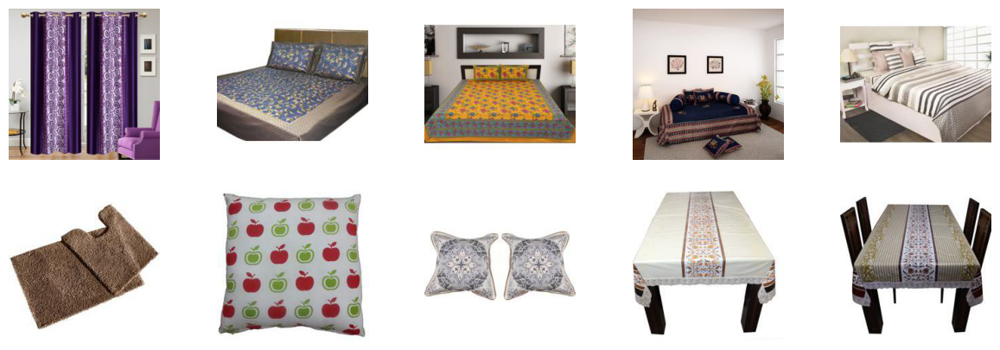

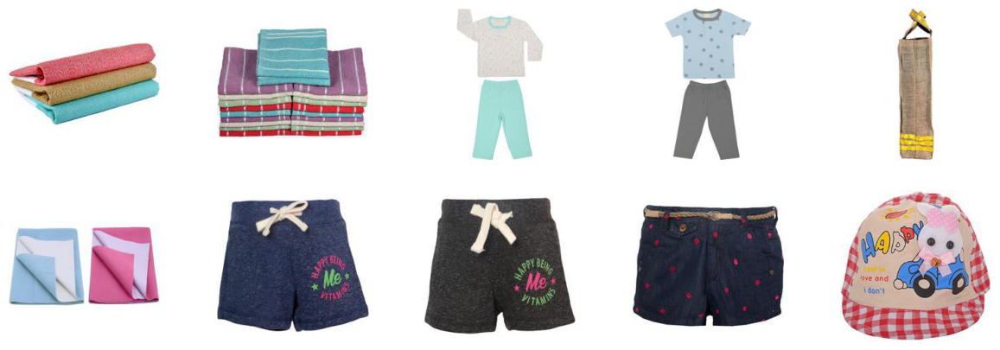

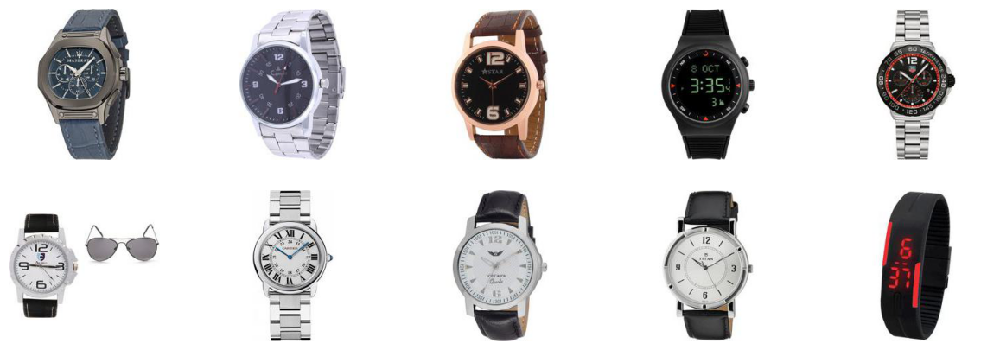

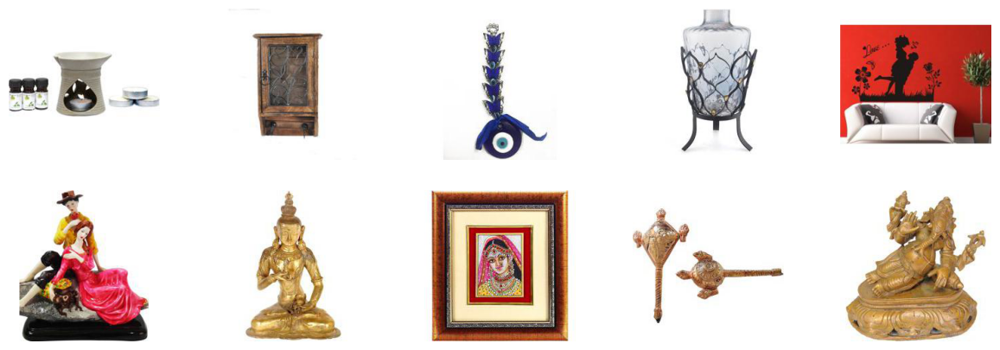

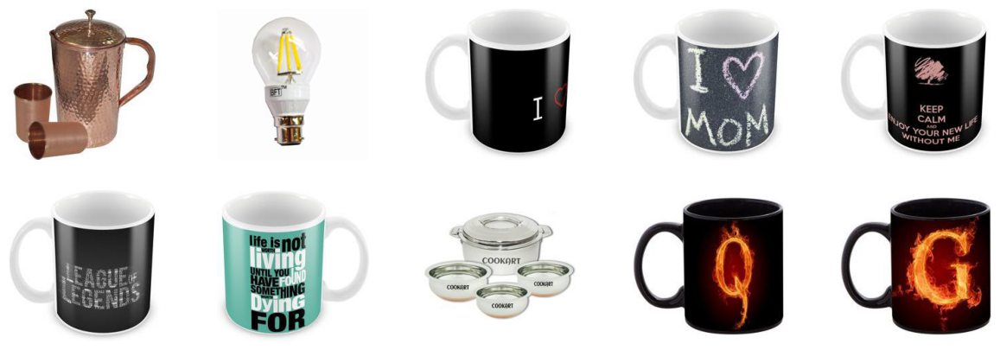

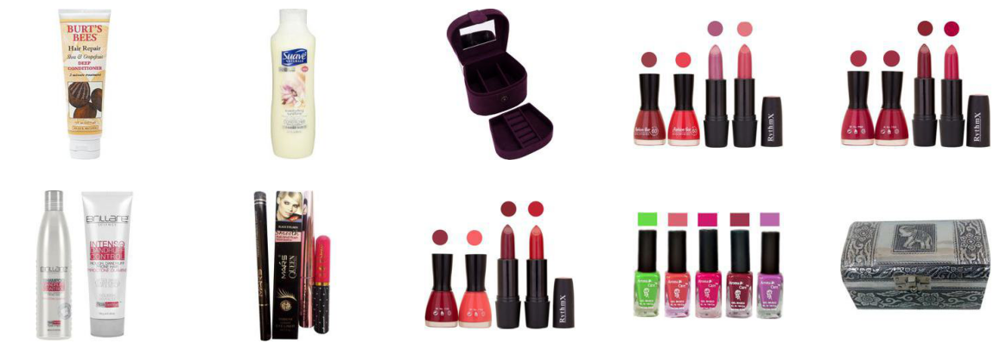

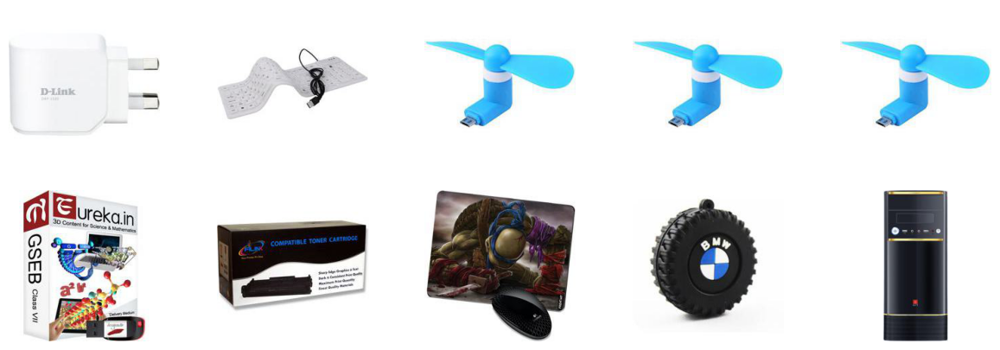

In [255]:
for cat in df_train["sous_cat_1"].unique():
    
    df = df_train.loc[df_train["sous_cat_1"] == cat]
    df = df[:10]
    affich_image(df)

In [259]:
%%time

df = df_train.loc[:, ["sous_cat_1", "image_redim_contrast"]]
df.head()

CPU times: total: 0 ns
Wall time: 2 ms


,sous_cat_1,image_redim_contrast
0,Furnishing,data/Images/Images_redim_contrast/55b85ea15a15...
1,Care,data/Images/Images_redim_contrast/7b72c92c2f6c...
2,Care,data/Images/Images_redim_contrast/64d5d4a25824...
3,Furnishing,data/Images/Images_redim_contrast/d4684dcdc759...
4,Furnishing,data/Images/Images_redim_contrast/6325b6870c54...


### L'algorithme ORB

Afin de trouver des features qui nous permettrons de comparer des images entre elles, nous allons essayer l'algorithme ORB. C'est une alternative aux algorithmes SIFT et SURF qui à l'avantage d'être gratuit contrairement aux deux autres.

La chose la plus importante à noter est que ces algorithmes de détection de caractéristiques dans opencv nécessitent une image en niveaux de gris à canal unique (typiquement 8 bits).

In [260]:
dictionary_size = 1000
# Loading images
imgs_data = []
# imreads returns a list of all images in that directory
imgs = df_train["image_grayscale"]
for i in range(len(imgs)):
    # create a numpy to hold the histogram for each image
    imgs_data.insert(i, np.zeros((dictionary_size, 1)))

In [481]:
import cv2
import numpy as np

def rotate_image(image, angle = 45):
    """
    Fait tourner une image d'un angle donné.
    """
    rows, cols, _ = image.shape
    rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (cols, rows))
    return rotated_image

def scale_image(image, scale_factor = 1 ):
    """
    Change l'échelle d'une image d'un facteur donné.
    """
    scaled_image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor)
    return scaled_image

def add_noise(image, mean=0, std=25):
    """
    Ajoute du bruit gaussien à une image.
    """
    noisy_image = np.copy(image)
    rows, cols, _ = noisy_image.shape
    noise = np.random.normal(mean, std, (rows, cols, 3))
    noisy_image += noise.astype(np.uint8)
    return noisy_image

def data_augmentation_pipeline(image):
    """
    Applique une série de transformations d'augmentation de données à une image.
    """
    # Rotation aléatoire entre -15 et 15 degrés
    angle = np.random.randint(-15, 16)
    rotated_image = rotate_image(image, angle)
    
    # Changement d'échelle aléatoire entre 0.8 et 1.2
    scale_factor = np.random.uniform(0.8, 1.2)
    scaled_image = scale_image(rotated_image, scale_factor)
    
    # Ajout de bruit gaussien
    noisy_image = add_noise(scaled_image)
    
    return noisy_image


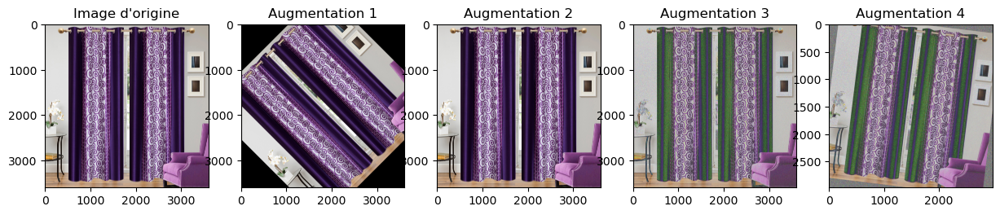

In [483]:
import matplotlib.pyplot as plt

def visualize_augmentations(image_path, augmentations):
    """
    Charge une image depuis le chemin spécifié, applique une liste d'augmentations de données
    et affiche les images résultantes côte à côte.
    
    Args:
    image_path (str): Le chemin vers l'image d'origine.
    augmentations (list): Une liste de fonctions d'augmentation de données à appliquer.
    """
    # Charger l'image d'origine
    original_image = cv2.imread(image_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    
    # Créer une figure pour afficher les images
    num_augmentations = len(augmentations) + 1
    plt.figure(figsize=(15, 5))
    
    # Afficher l'image d'origine
    plt.subplot(1, num_augmentations, 1)
    plt.imshow(original_image)
    plt.title("Image d'origine")
    
    # Appliquer chaque augmentation et afficher l'image résultante
    for i, augmentation in enumerate(augmentations):
        augmented_image = augmentation(original_image)
        plt.subplot(1, num_augmentations, i + 2)
        plt.imshow(augmented_image)
        plt.title(f"Augmentation {i + 1}")
    
    plt.show()

# Liste des fonctions d'augmentation à appliquer
augmentation_functions = [rotate_image, scale_image, add_noise,data_augmentation_pipeline]

# Exemple d'utilisation de la fonction
path = "data/Images/"
filename = path + data_origine.image.head()[0]
# Exemple d'utilisation de la fonction
image_path = filename
visualize_augmentations(image_path, augmentation_functions)

# visualize_augmentation(image_path)

In [487]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def apply_augmentation(image, augmentation):
    """
    Applique une augmentation de données à une image donnée.
    
    Args:
    image (numpy.ndarray): L'image d'entrée.
    augmentation (function): La fonction d'augmentation à appliquer.
    
    Returns:
    numpy.ndarray: L'image résultante après l'augmentation.
    """
    return augmentation(image)

def evaluate_model_performance(X_train, y_train, X_test, y_test):
    """
    Évalue les performances d'un modèle de classification (Random Forest) sur un jeu de données donné.
    
    Args:
    X_train (numpy.ndarray): Les données d'entraînement.
    y_train (numpy.ndarray): Les étiquettes d'entraînement.
    X_test (numpy.ndarray): Les données de test.
    y_test (numpy.ndarray): Les étiquettes de test.
    
    Returns:
    float: Le score d'exactitude du modèle.
    """
    model = RandomForestClassifier()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)

def visualize_augmentations(image_path, augmentations):
    """
    Charge une image depuis le chemin spécifié, applique une liste d'augmentations de données
    et affiche les images résultantes côte à côte. Évalue les performances du modèle avant et après chaque augmentation.
    
    Args:
    image_path (str): Le chemin vers l'image d'origine.
    augmentations (list): Une liste de fonctions d'augmentation de données à appliquer.
    """
    # Charger l'image d'origine
    print(image_path)
    original_image = cv2.imread(image_path)
    print(original_image)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    
    # Créer une figure pour afficher les images
    num_augmentations = len(augmentations)
    plt.figure(figsize=(15, 5))
    
    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split([original_image], [0], test_size=0.2, random_state=42)
    
    # Stocker les scores d'exactitude avant et après chaque augmentation
    accuracy_scores = []
    
    # Appliquer chaque augmentation et évaluer les performances du modèle
    for i, augmentation in enumerate(augmentations):
        augmented_image = apply_augmentation(original_image, augmentation)
        
        # Évaluer les performances du modèle avant l'augmentation
        if i == 0:
            accuracy_before = evaluate_model_performance(X_train, y_train, X_test, y_test)
            accuracy_scores.append(accuracy_before)
        
        # Évaluer les performances du modèle après l'augmentation
        X_train_aug, _, y_train_aug, _ = train_test_split([augmented_image], [0], test_size=0.2, random_state=42)
        accuracy_after = evaluate_model_performance(X_train_aug, y_train_aug, X_test, y_test)
        accuracy_scores.append(accuracy_after)
        
        # Afficher l'image résultante
        plt.subplot(2, num_augmentations, i + 1)
        plt.imshow(augmented_image)
        plt.title(f"Augmentation {i + 1}")
    
    # Afficher les performances du modèle avant et après chaque augmentation
    plt.subplot(2, num_augmentations, num_augmentations + 1)
    plt.bar(range(len(accuracy_scores)), accuracy_scores)
    plt.xticks(range(len(accuracy_scores)), ["Original"] + [f"Augmentation {i + 1}" for i in range(num_augmentations - 1)])
    plt.ylabel("Exactitude du modèle")
    plt.title("Performances du modèle")
    
    plt.show()

# Liste des fonctions d'augmentation à appliquer
augmentation_functions = [rotate_image, scale_image, add_noise,data_augmentation_pipeline]

# Exemple d'utilisation de la fonction
# image_path = "chemin_vers_votre_image.jpg"
# visualize_augmentations(image_path, augmentation_functions)
# Exemple d'utilisation de la fonction
path = "data/Images/"
filename = path + data_origine.image.head()[0]
# Exemple d'utilisation de la fonction
image_path = filename
visualize_augmentations(image_path, augmentation_functions)


data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg
[[[173 184 192]
  [173 184 192]
  [174 185 193]
  ...
  [156 165 174]
  [156 165 174]
  [156 165 174]]

 [[173 184 192]
  [174 185 193]
  [174 185 193]
  ...
  [156 165 174]
  [156 165 174]
  [156 165 174]]

 [[174 186 192]
  [175 187 193]
  [175 187 193]
  ...
  [157 166 175]
  [156 165 174]
  [156 165 174]]

 ...

 [[136 174 209]
  [136 174 209]
  [136 174 209]
  ...
  [ 96  94 130]
  [ 97  99 134]
  [100 104 139]]

 [[137 175 210]
  [137 175 210]
  [137 175 210]
  ...
  [103 105 140]
  [102 108 143]
  [104 113 147]]

 [[137 175 210]
  [137 175 210]
  [137 175 210]
  ...
  [110 114 149]
  [108 117 151]
  [110 120 154]]]


ValueError: With n_samples=1, test_size=0.2 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

<Figure size 1500x500 with 0 Axes>

In [261]:
import cv2

def get_descriptors(image, detector):
    
    img = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    kp, des = detector.detectAndCompute(img, None)
    
    # returns descriptors of an image
    return des

# Extracting descriptors
detector = cv2.ORB_create(nfeatures=1500)

desc = np.array([])

# desc_src_img is a list which says which image a descriptor belongs to
desc_src_img = []
for i in range(len(imgs)):
    
    img = imgs[i]
    descriptors = get_descriptors(img, detector)
    
    if len(desc) == 0:
        desc = np.array(descriptors)
    else:
        desc = np.vstack((desc, descriptors))
        
    # Keep track of which image a descriptor belongs to
    for j in range(len(descriptors)):
        desc_src_img.append(i)
        
# important, cv2.kmeans only accepts type32 descriptors
desc = np.float32(desc)

In [262]:
desc.shape

(1518318, 32)

In [263]:
# Clustering
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 0.01)

flags = cv2.KMEANS_PP_CENTERS

# desc is a type32 numpy array of vstacked descriptors
compactness, labels, dictionary = cv2.kmeans(desc, dictionary_size, None, criteria, 1, flags)

CPU times: total: 5min 19s
Wall time: 5min 20s


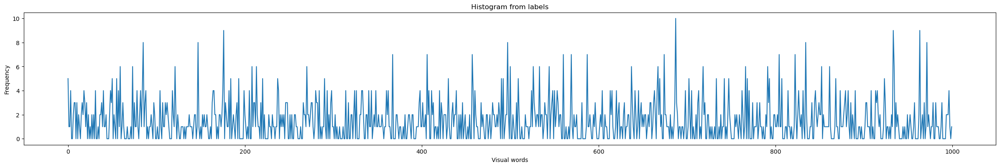

In [264]:
%%time 

# Getting histograms from labels
size = labels.shape[0] * labels.shape[1]

df_train["bovw"] = ""
for i in range(size):
    label = labels[i]
    # Get this descriptors image id
    img_id = desc_src_img[i]
    # imgs_data is a list of the same size as the number of images
    data_img = imgs_data[img_id]
    # data is a numpy array of size (dictionary_size, 1) filled with zeros
    data_img[label] += 1
    df_train["bovw"][img_id] = data_img.flatten()

plt.figure(figsize=(30,14))
ax = plt.subplot(311)
ax.set_title("Histogram from labels")
ax.set_xlabel("Visual words")
ax.set_ylabel("Frequency")
ax.plot(imgs_data[1].ravel())

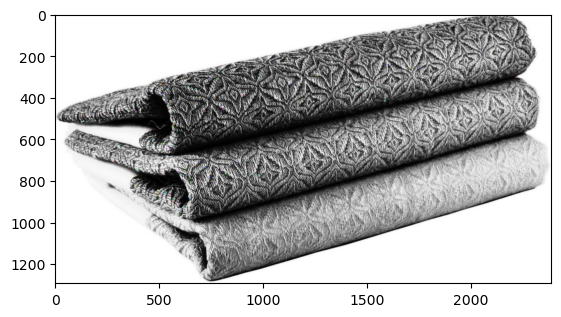

In [265]:
img = df_train["image_grayscale"][1]

orb = cv2.ORB_create()

img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)

keypoints, descriptors = orb.detectAndCompute(img, None)

img = cv2.drawKeypoints(img, keypoints, None)

plt.imshow(img)

## SIFT

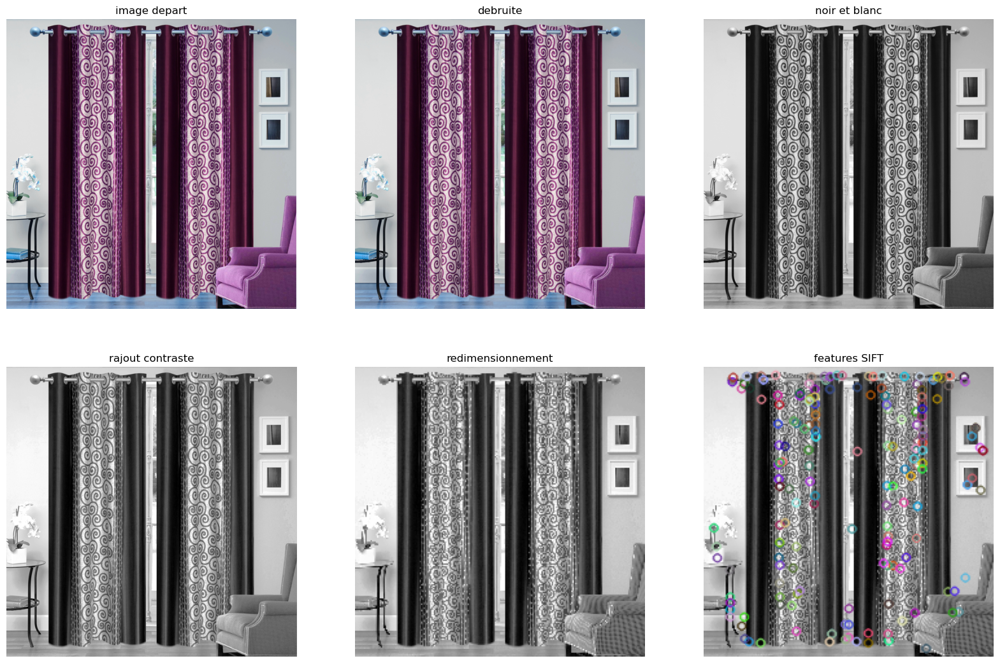

In [268]:

path = "data/Images/"
filename = path + data.image.head()[0]

sift = cv2.SIFT_create(200)
image = cv2.imread(filename)

plt.figure(figsize=(20, 13))

plt.subplot(2,3,1)
plt.axis('off')
plt.title('image depart')
plt.imshow(image)

plt.subplot(2,3,2)
#on enleve le bruit
image = cv2.GaussianBlur(image, (5, 5), 0)
plt.axis('off')
plt.title('debruite')
plt.imshow(image)

#on passe en noir et blanc
plt.subplot(2,3,3)
gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.axis('off')
plt.title('noir et blanc')
plt.imshow(gray_img,cmap='gray')

#augmentation du contraste par égalisation du contraste
plt.subplot(2,3,4)
image = cv2.equalizeHist(gray_img)   # equalize image histogram
plt.axis('off')
plt.title('rajout contraste')
plt.imshow(image, cmap='gray')

#on redimensionne pour normaliser entrée
plt.subplot(2,3,5)
dsize = (224, 224)
image = cv2.resize(image, dsize)
plt.axis('off')
plt.title('redimensionnement')
plt.imshow(image, cmap='gray')

#detecion feature SIFT
plt.subplot(2,3,6)
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,gray_img)
plt.axis('off')
plt.title('features SIFT')
plt.imshow(img)

plt.savefig('data_saved\Images\P01_07_traitementImages.jpg')
plt.show()

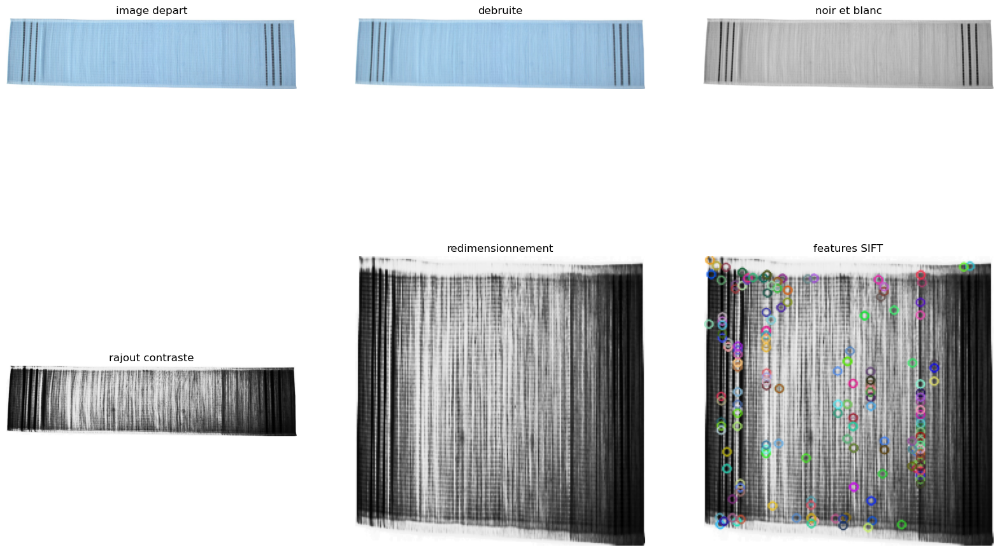

In [269]:
path = "data/Images/"
filename = path + '00cbbc837d340fa163d11e169fbdb952.jpg'
image = cv2.imread(filename)

sift = cv2.SIFT_create(200)
image = cv2.imread(filename)

plt.figure(figsize=(20, 13))

plt.subplot(2,3,1)
plt.axis('off')
plt.title('image depart')
plt.imshow(image)

plt.subplot(2,3,2)
#on enleve le bruit
image = cv2.GaussianBlur(image, (5, 5), 0)
plt.axis('off')
plt.title('debruite')
plt.imshow(image)

#on passe en noir et blanc
plt.subplot(2,3,3)
gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.axis('off')
plt.title('noir et blanc')
plt.imshow(gray_img,cmap='gray')

#augmentation du contraste par égalisation du contraste
plt.subplot(2,3,4)
image = cv2.equalizeHist(gray_img)   # equalize image histogram
plt.axis('off')
plt.title('rajout contraste')
plt.imshow(image, cmap='gray')

#on redimensionne pour normaliser entrée
plt.subplot(2,3,5)
dsize = (224, 224)
image = cv2.resize(image, dsize)
plt.axis('off')
plt.title('redimensionnement')
plt.imshow(image, cmap='gray')

#detecion feature SIFT
plt.subplot(2,3,6)
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,gray_img)
plt.axis('off')
plt.title('features SIFT')
plt.imshow(img)

plt.savefig('data_saved\Images\P01_08_traitementImages.jpg')
plt.show()


In [286]:
from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL  # Importez Image depuis PIL
i = np.random.randint(df_train.shape[0]-1)
img_sift = preprocess(df_train.iloc[12]['image'], path=True)

In [287]:
df_train.head()

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec,image,image_grayscale,image_redim,image_redim_contrast,bovw
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",Furnishing,Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,...","[-0.09962364, 0.16940546, -0.0069218054, 0.115...",data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images/Images_grayscale/55b85ea15a1536d46...,data/Images/Images_redim/55b85ea15a1536d46b719...,data/Images/Images_redim_contrast/55b85ea15a15...,"[3.0, 3.0, 2.0, 0.0, 0.0, 1.0, 2.0, 0.0, 2.0, ..."
1,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.07267947, 0.13034503, 0.010188335, 0.04963...",data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,data/Images/Images_grayscale/7b72c92c2f6c40268...,data/Images/Images_redim/7b72c92c2f6c40268628e...,data/Images/Images_redim_contrast/7b72c92c2f6c...,"[5.0, 1.0, 1.0, 4.0, 0.0, 0.0, 2.0, 3.0, 3.0, ..."
2,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.090120465, 0.13058983, 0.011022881, 0.0905...",data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,data/Images/Images_grayscale/64d5d4a258243731d...,data/Images/Images_redim/64d5d4a258243731dc7bb...,data/Images/Images_redim_contrast/64d5d4a25824...,"[1.0, 0.0, 0.0, 0.0, 4.0, 2.0, 4.0, 0.0, 0.0, ..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.006354898, 0.03705764, -0.039967217, 0.032...",data/Images/d4684dcdc759dd9cdf41504698d737d8.jpg,data/Images/Images_grayscale/d4684dcdc759dd9cd...,data/Images/Images_redim/d4684dcdc759dd9cdf415...,data/Images/Images_redim_contrast/d4684dcdc759...,"[3.0, 0.0, 7.0, 1.0, 2.0, 0.0, 1.0, 1.0, 2.0, ..."
4,Key Features of Jaipur Print Cotton Floral Kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.022359513, 0.05267728, -0.02708053, 0.0446...",data/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,data/Images/Images_grayscale/6325b6870c54cd47b...,data/Images/Images_redim/6325b6870c54cd47be6eb...,data/Images/Images_redim_contrast/6325b6870c54...,"[8.0, 1.0, 0.0, 0.0, 3.0, 0.0, 1.0, 1.0, 5.0, ..."


### CNN Convolutionnal Neural Network

Dans cette partie, nous allons utiliser ce que l'on appelle, le <i>transfer learning</i>. Il s'agit d'utiliser un réseau de neurones déjà entraîné sur de grands jeux de données disponibles sur internet. Dasn ce cas présent, il s'agit donc d'images.

Cela présente un gros avantage ici, car notre jeu de données n'est pas très grand (1050 images). Nous pourrons donc nous servir d'un modèle qui est "déjà bien mature" en terme de connaissance d'images.

#### VVG-16

Nous allons utiliser Keras, une bibliothèse de Python. Plus précisemment le modèle VGG-16 qui est une version du réseau de neurones convolutif très connu appelé VGG-Net.

In [289]:
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
import numpy as np

model = VGG16(weights='imagenet', include_top=False)
model.summary()

img_path = "data/Images/Images_redim_contrast/55b85ea15a1536d46b7190ad6fff8ce7.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_data = image.img_to_array(img)
img_data = np.expand_dims(img_data, axis=0)
img_data = preprocess_input(img_data)

vgg16_feature = model.predict(img_data)

print(vgg16_feature.shape)

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [290]:
vgg16_feature_list = []

for img_path in df_train["image_redim_contrast"]:
    
    img = image.load_img(img_path, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)

    vgg16_feature = model.predict(img_data)
    vgg16_feature_np = np.array(vgg16_feature)
    vgg16_feature_list.append(vgg16_feature_np.flatten())
        
vgg16_feature_list_np = np.array(vgg16_feature_list)


1/1 [==============================] - 0s 165ms/step


1/1 [==============================] - 0s 167ms/step


1/1 [==============================] - 0s 160ms/step


1/1 [==============================] - 0s 156ms/step


1/1 [==============================] - 0s 161ms/step


1/1 [==============================] - 0s 163ms/step


1/1 [==============================] - 0s 151ms/step


In [291]:
print("Dimension vecteur par image :", len(vgg16_feature_list_np[0]))
print("Nombre total de vecteurs :", len(vgg16_feature_list_np))

Dimension vecteur par image : 25088
Nombre total de vecteurs : 1050


In [292]:
df_train["VGG16"] =  ""

for i in range(df_train.shape[0]):
    df_train["VGG16"][i] = vgg16_feature_list_np[i]

df_train.head()

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec,image,image_grayscale,image_redim,image_redim_contrast,bovw,VGG16
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",Furnishing,Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,...","[-0.09962364, 0.16940546, -0.0069218054, 0.115...",data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images/Images_grayscale/55b85ea15a1536d46...,data/Images/Images_redim/55b85ea15a1536d46b719...,data/Images/Images_redim_contrast/55b85ea15a15...,"[3.0, 3.0, 2.0, 0.0, 0.0, 1.0, 2.0, 0.0, 2.0, ...","[0.0, 0.0, 0.0, 0.0, 9.618563, 0.0, 0.0, 0.0, ..."
1,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.07267947, 0.13034503, 0.010188335, 0.04963...",data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,data/Images/Images_grayscale/7b72c92c2f6c40268...,data/Images/Images_redim/7b72c92c2f6c40268628e...,data/Images/Images_redim_contrast/7b72c92c2f6c...,"[5.0, 1.0, 1.0, 4.0, 0.0, 0.0, 2.0, 3.0, 3.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.090120465, 0.13058983, 0.011022881, 0.0905...",data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,data/Images/Images_grayscale/64d5d4a258243731d...,data/Images/Images_redim/64d5d4a258243731dc7bb...,data/Images/Images_redim_contrast/64d5d4a25824...,"[1.0, 0.0, 0.0, 0.0, 4.0, 2.0, 4.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.006354898, 0.03705764, -0.039967217, 0.032...",data/Images/d4684dcdc759dd9cdf41504698d737d8.jpg,data/Images/Images_grayscale/d4684dcdc759dd9cd...,data/Images/Images_redim/d4684dcdc759dd9cdf415...,data/Images/Images_redim_contrast/d4684dcdc759...,"[3.0, 0.0, 7.0, 1.0, 2.0, 0.0, 1.0, 1.0, 2.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,Key Features of Jaipur Print Cotton Floral Kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.022359513, 0.05267728, -0.02708053, 0.0446...",data/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,data/Images/Images_grayscale/6325b6870c54cd47b...,data/Images/Images_redim/6325b6870c54cd47be6eb...,data/Images/Images_redim_contrast/6325b6870c54...,"[8.0, 1.0, 0.0, 0.0, 3.0, 0.0, 1.0, 1.0, 5.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


#### ResNet50

Un autre CNN, le modèle ResNet50.

In [293]:
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input
import numpy as np

model = ResNet50(weights='imagenet', include_top=False)
model.summary()

img_path = "data/Images/Images_redim_contrast/55b85ea15a1536d46b7190ad6fff8ce7.jpg"
img = image.load_img(img_path, target_size=(224, 224))
img_data = image.img_to_array(img)
img_data = np.expand_dims(img_data, axis=0)
img_data = preprocess_input(img_data)

resnet50_feature = model.predict(img_data)

print(resnet50_feature.shape)

94765736/94765736 [==============================] - 3s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, None, None, 3)        0         ['input_3[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, None, None, 64)       9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, None, None, 64)       256       ['conv1_conv[0][0]']          
 on)                      

 conv2_block2_out (Activati  (None, None, None, 256)      0         ['conv2_block2_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv2_block3_1_conv (Conv2  (None, None, None, 64)       16448     ['conv2_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv2_block3_1_bn (BatchNo  (None, None, None, 64)       256       ['conv2_block3_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block3_1_relu (Activ  (None, None, None, 64)       0         ['conv2_block3_1_bn[0][0]']   
 ation)   

                                                                                                  
 conv3_block2_2_relu (Activ  (None, None, None, 128)      0         ['conv3_block2_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block2_3_conv (Conv2  (None, None, None, 512)      66048     ['conv3_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block2_3_bn (BatchNo  (None, None, None, 512)      2048      ['conv3_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_blo

 ation)                                                                                           
                                                                                                  
 conv4_block1_2_conv (Conv2  (None, None, None, 256)      590080    ['conv4_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block1_2_bn (BatchNo  (None, None, None, 256)      1024      ['conv4_block1_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_2_relu (Activ  (None, None, None, 256)      0         ['conv4_block1_2_bn[0][0]']   
 ation)                                                                                           
          

 conv4_block3_add (Add)      (None, None, None, 1024)     0         ['conv4_block2_out[0][0]',    
                                                                     'conv4_block3_3_bn[0][0]']   
                                                                                                  
 conv4_block3_out (Activati  (None, None, None, 1024)     0         ['conv4_block3_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2  (None, None, None, 256)      262400    ['conv4_block3_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block4_1_bn (BatchNo  (None, None, None, 256)      1024      ['conv4_block4_1_conv[0][0]'] 
 rmalizati

                                                                                                  
 conv4_block6_3_conv (Conv2  (None, None, None, 1024)     263168    ['conv4_block6_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block6_3_bn (BatchNo  (None, None, None, 1024)     4096      ['conv4_block6_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_add (Add)      (None, None, None, 1024)     0         ['conv4_block5_out[0][0]',    
                                                                     'conv4_block6_3_bn[0][0]']   
                                                                                                  
 conv4_blo

 rmalization)                                                                                     
                                                                                                  
 conv5_block3_1_relu (Activ  (None, None, None, 512)      0         ['conv5_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block3_2_conv (Conv2  (None, None, None, 512)      2359808   ['conv5_block3_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block3_2_bn (BatchNo  (None, None, None, 512)      2048      ['conv5_block3_2_conv[0][0]'] 
 rmalization)                                                                                     
          

In [294]:
%%time

resnet50_feature_list = []

for img_path in df_train["image_redim_contrast"]:
    
    img = image.load_img(img_path, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)

    resnet50_feature = model.predict(img_data)
    resnet50_feature_np = np.array(resnet50_feature)
    resnet50_feature_list.append(resnet50_feature_np.flatten())
        
resnet50_feature_list_np = np.array(resnet50_feature_list)

1/1 [==============================] - 0s 128ms/step


1/1 [==============================] - 0s 155ms/step


1/1 [==============================] - 0s 141ms/step


1/1 [==============================] - 0s 126ms/step


1/1 [==============================] - 0s 138ms/step


1/1 [==============================] - 0s 152ms/step


1/1 [==============================] - 0s 140ms/step
CPU times: total: 10min 57s
Wall time: 3min 12s


In [295]:
print("Dimension vecteur par image :", len(resnet50_feature_list_np[0]))
print("Nombre total de vecteurs :", len(resnet50_feature_list_np))

Dimension vecteur par image : 100352
Nombre total de vecteurs : 1050


In [296]:
df_train["resnet50"] =  ""

for i in range(df_train.shape[0]):
    df_train["resnet50"][i] = resnet50_feature_list_np[i]

df_train.head()

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec,image,image_grayscale,image_redim,image_redim_contrast,bovw,VGG16,resnet50
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",Furnishing,Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,...","[-0.09962364, 0.16940546, -0.0069218054, 0.115...",data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images/Images_grayscale/55b85ea15a1536d46...,data/Images/Images_redim/55b85ea15a1536d46b719...,data/Images/Images_redim_contrast/55b85ea15a15...,"[3.0, 3.0, 2.0, 0.0, 0.0, 1.0, 2.0, 0.0, 2.0, ...","[0.0, 0.0, 0.0, 0.0, 9.618563, 0.0, 0.0, 0.0, ...","[3.881091, 0.0, 0.0, 0.16341764, 0.17857587, 0..."
1,Specifications of Sathiyas Cotton Bath Towel (...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.07267947, 0.13034503, 0.010188335, 0.04963...",data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,data/Images/Images_grayscale/7b72c92c2f6c40268...,data/Images/Images_redim/7b72c92c2f6c40268628e...,data/Images/Images_redim_contrast/7b72c92c2f6c...,"[5.0, 1.0, 1.0, 4.0, 0.0, 0.0, 2.0, 3.0, 3.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,Key Features of Eurospa Cotton Terry Face Towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Care,Baby Bath & Skin,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.090120465, 0.13058983, 0.011022881, 0.0905...",data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,data/Images/Images_grayscale/64d5d4a258243731d...,data/Images/Images_redim/64d5d4a258243731dc7bb...,data/Images/Images_redim_contrast/64d5d4a25824...,"[1.0, 0.0, 0.0, 0.0, 4.0, 2.0, 4.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.006354898, 0.03705764, -0.039967217, 0.032...",data/Images/d4684dcdc759dd9cdf41504698d737d8.jpg,data/Images/Images_grayscale/d4684dcdc759dd9cd...,data/Images/Images_redim/d4684dcdc759dd9cdf415...,data/Images/Images_redim_contrast/d4684dcdc759...,"[3.0, 0.0, 7.0, 1.0, 2.0, 0.0, 1.0, 1.0, 2.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,Key Features of Jaipur Print Cotton Floral Kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Furnishing,Bed Linen,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.022359513, 0.05267728, -0.02708053, 0.0446...",data/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,data/Images/Images_grayscale/6325b6870c54cd47b...,data/Images/Images_redim/6325b6870c54cd47be6eb...,data/Images/Images_redim_contrast/6325b6870c54...,"[8.0, 1.0, 0.0, 0.0, 3.0, 0.0, 1.0, 1.0, 5.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [297]:
print("Taille vecteur bovw :", len(df_train["bovw"][0])) # 1000
print("Taille vecteur VGG16 :", len(df_train["VGG16"][0])) # 25088
print("Taille vecteur ResNet50 :", len(df_train["resnet50"][0])) #100352

Taille vecteur bovw : 1000
Taille vecteur VGG16 : 25088
Taille vecteur ResNet50 : 100352


# Classification

Nous en arrivons à la troisième partie. Pour résumé, nous avons effectué :
 1. L'extraction des features des données textes. La méthode TF-IDF avec bi-gramme s'avérant la plus efficace sur notre jeu de données
 2. L'extraction des features des images avec un algorithme d'extraction (ORB)
 3. L'extraction des features des images avec un CNN (VGG-16)
 
Nous devons maintenant construire notre jeu de données pour effectuer une classification multi-classes. Nous allons faire plusieurs itérations afin d'évaluer la plus performante :
 - Seulement les features textes
 - Features textes avec TF-IDF & features images avec ORB
 - Features textes avec TF-IDF & features images avec VGG-16

### Récupération des données vectorielles

Pour cette étape de préparation, nous allons reformater les données dans un dataframe propre à chaque extraction. Ensuite, suivant les itérations, nous concatènerons les dataframes pour le clustering.

In [298]:
def extract_data(col):
    
    v = np.column_stack(df_train[col].values.tolist())
    df = pd.DataFrame(v).T
    
    return df

In [325]:
df_train.head(1)

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec,image,image_grayscale,image_redim,image_redim_contrast,bovw,VGG16,resnet50
0,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",Furnishing,Curtains & Accessories,"[0.0, 0.0, 17.279644, 0.0, 0.0, 0.0, 0.0, 0.0,...","[-0.09962364, 0.16940546, -0.0069218054, 0.115...",data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images/Images_grayscale/55b85ea15a1536d46...,data/Images/Images_redim/55b85ea15a1536d46b719...,data/Images/Images_redim_contrast/55b85ea15a15...,"[3.0, 3.0, 2.0, 0.0, 0.0, 1.0, 2.0, 0.0, 2.0, ...","[0.0, 0.0, 0.0, 0.0, 9.618563, 0.0, 0.0, 0.0, ...","[3.881091, 0.0, 0.0, 0.16341764, 0.17857587, 0..."


In [299]:
df_tfidf = extract_data("tf_idf")
df_word2vec = extract_data("word2vec")
df_bovw = extract_data("bovw")
df_vgg16 = extract_data("VGG16")
df_resnet50 = extract_data("resnet50")

print("Taille vecteurs tfidf :", df_tfidf.shape[1])
print("Taille vecteurs word2vec :", df_word2vec.shape[1])
print("Taille vecteurs bovw :", df_bovw.shape[1])
print("Taille vecteurs VGG16 :", df_vgg16.shape[1])
print("Taille vecteurs Resnet50 :", df_resnet50.shape[1])

Taille vecteurs tfidf : 2371
Taille vecteurs word2vec : 100
Taille vecteurs bovw : 1000
Taille vecteurs VGG16 : 25088
Taille vecteurs Resnet50 : 100352


### Construction jeu de données

In [465]:
!pip install umap-learn

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/90.8 kB ? eta -:--:--
     ---------------------------------------- 90.8/90.8 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
     ---------------------------------------- 1.1/1.1 MB 35.3 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86862 sha256=f78792886167230a4d182fd6f50b9f11812ffdcb94c0b0f2303359fb32614159
  Stored in directory: c:\users\zbook\appdata\local\pip\cache\wheels\42\7b\35\c53136bf6554719351c45217002d767ed2582664997ed2db43
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55676 sha256=a74b3e7304a7b5032738b03794b9e863c

In [ ]:
# import umap
# import pandas as pd

# def reduce_umap(data, n_components=2, n_neighbors=15, min_dist=0.1, metric='euclidean'):
#     """
#     Réduction UMAP d'un ensemble de données.

#     Args:
#     - data (pd.DataFrame ou np.ndarray): Les données à réduire.
#     - n_components (int, optional): Nombre de dimensions dans l'espace réduit. Par défaut, 2.
#     - n_neighbors (int, optional): Nombre de voisins à considérer pour la construction de la topologie. Par défaut, 15.
#     - min_dist (float, optional): La distance minimale entre les points dans l'espace réduit. Par défaut, 0.1.
#     - metric (str, optional): La métrique de distance à utiliser pour la réduction UMAP. Par défaut, 'euclidean'.

#     Returns:
#     - pd.DataFrame: Un DataFrame contenant les données réduites en dimensions réduites.
#     """
    
#     if isinstance(data, pd.DataFrame):
#         data = data.values  # Si les données sont dans un DataFrame, convertissez-les en ndarray
    
#     # Créez l'objet UMAP avec les paramètres spécifiés
#     umap_model = umap.UMAP(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
    
#     # Appliquez la réduction UMAP sur les données
#     reduced_data = umap_model.fit_transform(data)
    
#     # Créez un DataFrame pour les données réduites
#     reduced_df = pd.DataFrame(data=reduced_data, columns=[f'Dimension {i+1}' for i in range(n_components)])
    
#     return reduced_df



In [471]:
# import pandas as pd
# import umap
# import matplotlib.pyplot as plt
# from sklearn.impute import SimpleImputer

# # Extrait les caractéristiques numériques que vous souhaitez utiliser pour UMAP
# # Dans cet exemple, nous utilisons les colonnes "retail_price" et "discounted_price"
# df1 = data_origine.copy()
# df_c = df1.dropna()
# df_c.fillna(0, inplace=True)
# imputer = SimpleImputer(strategy="mean")  # Vous pouvez également utiliser "median" ou d'autres stratégies
# df_imputed = pd.DataFrame(imputer.fit_transform(df_c), columns=df_c.columns)

# features = df_imputed[["retail_price", "discounted_price"]]

# # Effectuez la réduction de dimension UMAP
# reducer = umap.UMAP(n_neighbors=5, min_dist=0.3, random_state=42)
# umap_result = reducer.fit_transform(features)

# # Créez un nouveau DataFrame avec les coordonnées UMAP
# umap_df = pd.DataFrame(data={"UMAP Dimension 1": umap_result[:, 0], "UMAP Dimension 2": umap_result[:, 1]})

# # Affichez le DataFrame résultant
# print(umap_df.head())

# # Visualisez les données réduites avec UMAP
# plt.figure(figsize=(10, 8))
# plt.scatter(umap_result[:, 0], umap_result[:, 1], s=10, cmap='viridis')
# plt.title("UMAP Visualization")
# plt.show()


Concaténation des dataframes avec réalisation d'une ACP afin de faire une réduction dimensionnelle de nos itérations. Cela permettra de simplifier les modèles de clustering et d'améliorer leurs performances.

In [300]:
def concat_df(df1, df2):
    
    df = pd.concat([df1, df2], axis=1, ignore_index=True)
    
    return df

#### Définition ACP

In [301]:
def display_scree_plot(acp):
    scree = acp.explained_variance_ratio_*100
    #print(scree)
    #print("Le premier plan factoriel représente {} % de la variance totale.".format(round(scree[0] + scree[1],2)))
    #print("Le deuxième plan factoriel représente {} % de la variance totale.".format(round(scree[2] + scree[3],2)))
    #print("Le troisième plan factoriel représente {} % de la variance totale.".format(round(scree[4] + scree[5],2)))
    plt.figure(figsize=(8, 8))
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

In [302]:
def application_pca(df, taux):
    
    #n_comp = 6
    pca = PCA(0.9)     #n_components=n_comp)

    X_pca =  pd.DataFrame(pca.fit_transform(df))

    #On appelle la fonction qui trace la courbe des éboulis des valeurs propres
    #display_scree_plot(pca)

    return X_pca

In [322]:
df

,sous_cat_1,image_redim_contrast
0,Furnishing,data/Images/Images_redim_contrast/55b85ea15a15...
1,Care,data/Images/Images_redim_contrast/7b72c92c2f6c...
2,Care,data/Images/Images_redim_contrast/64d5d4a25824...
3,Furnishing,data/Images/Images_redim_contrast/d4684dcdc759...
4,Furnishing,data/Images/Images_redim_contrast/6325b6870c54...
...,...,...
1045,Care,data/Images/Images_redim_contrast/958f54f4c46b...
1046,Care,data/Images/Images_redim_contrast/fd6cbcc22efb...
1047,Care,data/Images/Images_redim_contrast/5912e037d127...
1048,Care,data/Images/Images_redim_contrast/c3edc504d1b4...


#### Définition NMF

In [303]:
def application_NMF(df, comp):

    nmf = NMF(n_components=comp, solver="mu")

    W = nmf.fit_transform(df)

    H = nmf.components_
    
    df = pd.DataFrame(W)
    
    return df

In [330]:
import sklearn

In [332]:
print("Version pd:", pd.__version__)
print("Version np:", np.__version__)
print("Version sns:", sns.__version__)
print("Version cv2:", cv2.__version__)
print("Version sklearn:", sklearn.__version__)

Version pd: 1.5.3
Version np: 1.24.3
Version sns: 0.12.2
Version cv2: 4.8.1
Version sklearn: 1.3.0


#### Construction des itérations

In [333]:
%%time

from sklearn.decomposition import PCA
from sklearn.decomposition import NMF

taux_pca = 0.9
nb_comp_nmf = 7

df_iter_texte = application_NMF(df_tfidf, nb_comp_nmf)
df_iter_bovw = application_NMF(df_bovw, nb_comp_nmf)
df_iter_vgg16 = application_NMF(df_vgg16, nb_comp_nmf)
df_iter_resnet50 = application_NMF(df_resnet50, nb_comp_nmf)

# Texte = Tfidf | Images = bovw 
df_iter1 = concat_df(df_tfidf, df_bovw)
df_iter1_pca = application_pca(df_iter1, taux_pca)
df_iter1_nmf = application_NMF(df_iter1, nb_comp_nmf)
print("Itération : Textes = Tfidf | Images = BoVW")
print("Nombre de features après PCA :", df_iter1_pca.shape, "pour", taux_pca * 100, "% d'informations conservées.")
print("Nombre de features après NMF :", df_iter1_nmf.shape, "pour", nb_comp_nmf, "composantes.")

# Texte = Tfidf | Images = VGG16 
df_iter2 = concat_df(df_tfidf, df_vgg16)
df_iter2_pca = application_pca(df_iter2, taux_pca)
df_iter2_nmf = application_NMF(df_iter2, nb_comp_nmf)
print("Itération : Textes = Tfidf | Images = VGG16")
print("Nombre de features après PCA :", df_iter2_pca.shape, "pour", taux_pca * 100, "% d'informations conservées.")
print("Nombre de features après NMF :", df_iter2_nmf.shape, "pour", nb_comp_nmf, "composantes.")

# Texte = word2vec | Images = bovw
df_iter3 = concat_df(df_word2vec, df_bovw)
df_iter3_pca = application_pca(df_iter3, taux_pca)
#df_iter3_nmf = application_NMF(df_iter3, nb_comp_nmf)
print("Itération : Textes = Word2Vec | Images = BoVW")
print("Nombre de features après PCA :", df_iter3_pca.shape, "pour", taux_pca * 100, "% d'informations conservées.")
#print("Nombre de features après NMF :", df_iter3_nmf.shape, "pour", nb_comp_nmf, "composantes.")

# Texte = Word2vec | Images = VGG16 
df_iter4 = concat_df(df_word2vec, df_vgg16)
df_iter4_pca = application_pca(df_iter4, taux_pca)
#df_iter4_nmf = application_NMF(df_iter4, nb_comp_nmf)
print("Itération : Textes = Word2Vec | Images = VGG16")
print("Nombre de features après PCA :", df_iter4_pca.shape, "pour", taux_pca * 100, "% d'informations conservées.")
#print("Nombre de features après NMF :", df_iter4_nmf.shape, "pour", nb_comp_nmf, "composantes.")

# Texte = word2vec | Images = VGG16_NMF
df_iter5 = concat_df(df_word2vec, application_NMF(df_vgg16, nb_comp_nmf))
print("Itération : Textes = Word2Vec | Images = VGG16 avec NMF")
print("Nombre de features après NMF :", df_iter5.shape)

# Texte = Tfidf | Images = ResNet50 
df_iter6 = concat_df(df_tfidf, df_resnet50)
df_iter6_pca = application_pca(df_iter6, taux_pca)
df_iter6_nmf = application_NMF(df_iter6, nb_comp_nmf)
print("Itération : Textes = Tfidf | Images = ResNet50")
print("Nombre de features après PCA :", df_iter6_pca.shape, "pour", taux_pca * 100, "% d'informations conservées.")
print("Nombre de features après NMF :", df_iter6_nmf.shape, "pour", nb_comp_nmf, "composantes.")

# Texte = word2vec | Images = ResNet50_NMF
df_iter7 = concat_df(df_word2vec, application_NMF(df_resnet50, nb_comp_nmf))
print("Itération : Textes = Word2Vec | Images = ResNet50 avec NMF")
print("Nombre de features après NMF :", df_iter7.shape)

Itération : Textes = Tfidf | Images = BoVW
Nombre de features après PCA : (1050, 420) pour 90.0 % d'informations conservées.
Nombre de features après NMF : (1050, 7) pour 7 composantes.
Itération : Textes = Tfidf | Images = VGG16
Nombre de features après PCA : (1050, 578) pour 90.0 % d'informations conservées.
Nombre de features après NMF : (1050, 7) pour 7 composantes.
Itération : Textes = Word2Vec | Images = BoVW
Nombre de features après PCA : (1050, 342) pour 90.0 % d'informations conservées.
Itération : Textes = Word2Vec | Images = VGG16
Nombre de features après PCA : (1050, 577) pour 90.0 % d'informations conservées.
Itération : Textes = Word2Vec | Images = VGG16 avec NMF
Nombre de features après NMF : (1050, 107)
Itération : Textes = Tfidf | Images = ResNet50
Nombre de features après PCA : (1050, 665) pour 90.0 % d'informations conservées.
Nombre de features après NMF : (1050, 7) pour 7 composantes.
Itération : Textes = Word2Vec | Images = ResNet50 avec NMF
Nombre de features apr

In [346]:
%%time

from sklearn.metrics import confusion_matrix 
from sklearn.model_selection import train_test_split 
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.naive_bayes import GaussianNB 
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier 

nb_iterations = 14

df_score = pd.DataFrame(columns=["iteration", "bayes", "tree", "svm", "rf","GBC"], index=range(nb_iterations))

for i in range(1, nb_iterations+1):
    
    if i == 1:
        X = df_iter_texte
    elif i == 2:
        X = df_iter_bovw
    elif i == 3:
        X = df_iter_vgg16
    elif i == 4:
        X = df_iter_resnet50
    elif i == 5:
        X = df_iter1_pca
#         X=X
    elif i == 6:
        X = df_iter1_nmf
    elif i == 7:
        X = df_iter2_pca
#         X=X
    elif i == 8:
        X = df_iter2_nmf
    elif i == 9:
        X = df_iter3_pca
#         X=X
    elif i == 10:
        X = df_iter4_pca
#         X=X
    elif i == 11:
        X = df_iter5
#         X=X
    elif i == 12:
        X = df_iter6_pca
#         X=X
    elif i == 13:
        X = df_iter6_nmf
    elif i == 14:
        X = df_iter7
#         X=X
    
    y = des_target
    
    # dividing X, y into train and test data 
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0) 
  
    # training a DescisionTreeClassifier 
    dtree_model = DecisionTreeClassifier(max_depth = 2).fit(X_train, y_train) 
    dtree_predictions = dtree_model.predict(X_test) 
    # model accuracy for X_test   
    accuracy_dtree = dtree_model.score(X_test, y_test) 
    
    # training a linear SVM classifier 
    svm_model_linear = SVC(kernel = 'linear', C = 1).fit(X_train, y_train) 
    svm_predictions = svm_model_linear.predict(X_test) 
    # model accuracy for X_test   
    accuracy_svm = svm_model_linear.score(X_test, y_test) 

#     # training a KNN classifier 
#     knn = KNeighborsClassifier(n_neighbors = 5).fit(X_train, y_train) 
#     knn_predictions = knn.predict(X_test) 
#     # accuracy on X_test 
#     accuracy_knn = knn.score(X_test, y_test)
    from sklearn.ensemble import RandomForestClassifier

    # Entraînement d'un modèle RandomForestClassifier
    rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=0)
    rf_classifier.fit(X_train, y_train)
    rf_predictions = rf_classifier.predict(X_test)

    # Précision sur X_test
    accuracy_rf = rf_classifier.score(X_test, y_test)
  
    from sklearn.ensemble import GradientBoostingClassifier

    # Entraînement d'un modèle GradientBoostingClassifier
    gb_classifier = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
    gb_classifier.fit(X_train, y_train)
    gb_predictions = gb_classifier.predict(X_test)

    # Précision sur X_test
    accuracy_gb = gb_classifier.score(X_test, y_test)


    # training a Naive Bayes classifier 
    gnb = GaussianNB().fit(X_train, y_train) 
    gnb_predictions = gnb.predict(X_test) 
    # accuracy on X_test 
    accuracy_gnb = gnb.score(X_test, y_test)
    
    df_score["iteration"][i-1] = i
    df_score["bayes"][i-1] = round(accuracy_gnb, 2)
    df_score["tree"][i-1] = round(accuracy_dtree, 2)
    df_score["svm"][i-1] = round(accuracy_svm, 2)
    df_score["rf"][i-1] = round(accuracy_rf, 2)
    df_score["GBC"][i-1] = round(accuracy_gb, 2)
    
    print("---------------------------------------------")
    print("Itération ", i, ":")
    print("Accuracy du modèle naïf de Bayes :", round(accuracy_gnb, 2))
    print("Accuracy de l'arbre de décision :", round(accuracy_dtree, 2))
    print("Accuracy du SVM :", round(accuracy_svm, 2))
    print("Accuracy du RandomForestClassifier :", round(accuracy_rf, 2))
    print("Accuracy du GradientBoostingClassifier :", round(accuracy_gb, 2))


---------------------------------------------
Itération  1 :
Accuracy du modèle naïf de Bayes : 0.52
Accuracy de l'arbre de décision : 0.52
Accuracy du SVM : 0.53
Accuracy du RandomForestClassifier : 0.67
Accuracy du RandomForestClassifier : 0.67
---------------------------------------------
Itération  2 :
Accuracy du modèle naïf de Bayes : 0.19
Accuracy de l'arbre de décision : 0.19
Accuracy du SVM : 0.27
Accuracy du RandomForestClassifier : 0.22
Accuracy du RandomForestClassifier : 0.22
---------------------------------------------
Itération  3 :
Accuracy du modèle naïf de Bayes : 0.58
Accuracy de l'arbre de décision : 0.58
Accuracy du SVM : 0.64
Accuracy du RandomForestClassifier : 0.6
Accuracy du RandomForestClassifier : 0.6
---------------------------------------------
Itération  4 :
Accuracy du modèle naïf de Bayes : 0.71
Accuracy de l'arbre de décision : 0.71
Accuracy du SVM : 0.76
Accuracy du RandomForestClassifier : 0.71
Accuracy du RandomForestClassifier : 0.71
--------------

In [340]:
# %%time
# import pandas as pd
# from sklearn.metrics import confusion_matrix 
# from sklearn.model_selection import train_test_split 
# from sklearn.naive_bayes import GaussianNB 
# from sklearn.svm import SVC  # Importez la classe SVC
# from sklearn.tree import DecisionTreeClassifier 

# # Définissez le nombre d'itérations
# nb_iterations = 14

# # Créez un DataFrame pour stocker les résultats
# df_score = pd.DataFrame(columns=["iteration", "bayes", "tree", "svm"], index=range(nb_iterations))

# # Fonction pour entraîner et évaluer les modèles
# def train_and_evaluate_model(X_train, X_test, y_train, y_test):
#     # Entraînez un modèle de Bayes
#     gnb = GaussianNB().fit(X_train, y_train) 
#     accuracy_gnb = gnb.score(X_test, y_test)

#     # Entraînez un modèle d'arbre de décision
#     dtree_model = DecisionTreeClassifier(max_depth=2).fit(X_train, y_train) 
#     accuracy_dtree = dtree_model.score(X_test, y_test)

#     # Entraînez un modèle SVM linéaire
#     svm_model_linear = SVC(kernel='linear', C=1).fit(X_train, y_train) 
#     accuracy_svm = svm_model_linear.score(X_test, y_test)

#     return accuracy_gnb, accuracy_dtree, accuracy_svm

# for i in range(1, nb_iterations+1):
#     # Assurez-vous d'avoir correctement défini X en fonction de la valeur de i

#     y = des_target
    
#     # Divisez X et y en données d'entraînement et de test
#     X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
  
#     # Entraînez et évaluez les modèles
#     accuracy_gnb, accuracy_dtree, accuracy_svm = train_and_evaluate_model(X_train, X_test, y_train, y_test)
    
#     df_score["iteration"][i-1] = i
#     df_score["bayes"][i-1] = round(accuracy_gnb, 2)
#     df_score["tree"][i-1] = round(accuracy_dtree, 2)
#     df_score["svm"][i-1] = round(accuracy_svm, 2)
    
#     print("----------------------------------------------")
#     print("Itération", i, ":")
#     print("Accuracy du modèle naïf de Bayes:", round(accuracy_gnb, 2))
#     print("Accuracy de l'arbre de décision:", round(accuracy_dtree, 2))
#     print("Accuracy du SVM:", round(accuracy_svm, 2))


In [347]:
df_score

,iteration,bayes,tree,svm,rf,GBC
0,1,0.52,0.33,0.53,0.67,0.78
1,2,0.19,0.2,0.27,0.22,0.23
2,3,0.58,0.34,0.64,0.6,0.64
3,4,0.71,0.41,0.76,0.71,0.69
4,5,0.4,0.27,0.83,0.51,0.58
5,6,0.22,0.21,0.25,0.25,0.28
6,7,0.55,0.32,0.79,0.67,0.68
7,8,0.55,0.33,0.61,0.51,0.62
8,9,0.26,0.17,0.35,0.3,0.17
9,10,0.54,0.32,0.79,0.66,0.67


In [360]:
# fig, ax = plt.subplots(figsize=(20, 8))

# x = np.arange(1, nb_iterations+1)
# bar_width = 0.15

# for i in x:
    
#     bar1 = ax.bar(i-(1.5*bar_width),
#                  df_score.loc[df_score["iteration"] == i, "bayes"],
#                  width=bar_width,
#                   color="gray"
#                 )
#     bar2 = ax.bar(i-bar_width/2,
#                  df_score.loc[df_score["iteration"] == i, "tree"],
#                  width=bar_width,
#                   color="lightblue"
#                 )
#     bar3 = ax.bar(i+bar_width/2,
#                  df_score.loc[df_score["iteration"] == i, "svm"],
#                  width=bar_width,
#                   color="lightgreen"
#                 )
#     bar4 = ax.bar(i+(1.5*bar_width),
#                  df_score.loc[df_score["iteration"] == i, "rf"],
#                  width=bar_width,
#                   color="red"
#                 )
#     bar5 = ax.bar(i+(3.5*bar_width),
#                  df_score.loc[df_score["iteration"] == i, "GBC"],
#                  width=bar_width,
#                   color="blue"
#                 )    

# # Fix the x-axes.
# ax.set_xticks(x)
# ax.set_xticklabels(x)

# plt.legend(["Bayes", "DecisionTree", "SVM", "RandomForestClassifier","GradientBoostingClassifier"], loc="upper left")
# plt.title("Résultats classifieurs", size=14)

Text(0.5, 1.0, 'Résultats des classifieurs')

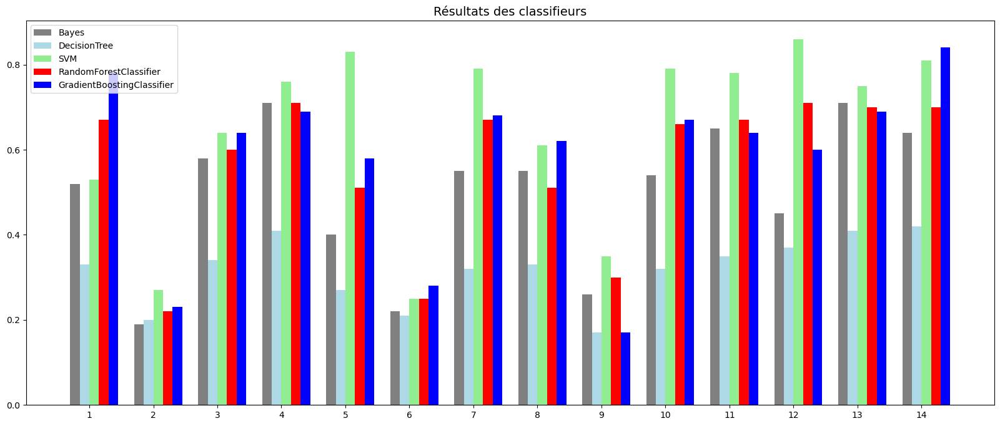

In [358]:
# Import des bibliothèques nécessaires
import numpy as np
import matplotlib.pyplot as plt

# Définition des données
fig, ax = plt.subplots(figsize=(20, 8))
x = np.arange(1, nb_iterations+1)
bar_width = 0.15

# Boucle pour chaque itération
for i in x:
    # Création des barres pour chaque modèle
    # Barre pour le modèle Bayes
    bar1 = ax.bar(i-(1.5*bar_width),
                 df_score.loc[df_score["iteration"] == i, "bayes"],
                 width=bar_width,
                 color="gray"
                )
    # Barre pour le modèle DecisionTree
    bar2 = ax.bar(i-bar_width/2,
                 df_score.loc[df_score["iteration"] == i, "tree"],
                 width=bar_width,
                 color="lightblue"
                )
    # Barre pour le modèle SVM
    bar3 = ax.bar(i+bar_width/2,
                 df_score.loc[df_score["iteration"] == i, "svm"],
                 width=bar_width,
                 color="lightgreen"
                )
    # Barre pour le modèle RandomForestClassifier
    bar4 = ax.bar(i+(1.5*bar_width),
                 df_score.loc[df_score["iteration"] == i, "rf"],
                 width=bar_width,
                 color="red"
                )
    # Barre pour le modèle GradientBoostingClassifier
    bar5 = ax.bar(i+(2.5*bar_width),
                 df_score.loc[df_score["iteration"] == i, "GBC"],
                 width=bar_width,
                 color="blue"
                )    

# Configuration de l'axe des x
ax.set_xticks(x)
ax.set_xticklabels(x)

# Légende des modèles
plt.legend(["Bayes", "DecisionTree", "SVM", "RandomForestClassifier", "GradientBoostingClassifier"], loc="upper left")

# Titre du graphique
plt.title("Résultats des classifieurs", size=14)


In [361]:
y_test.unique()

array(['Kitchen & Dining ', 'Baby Care ', 'Home Furnishing ',
       'Home Decor & Festive Needs ', 'Watches ',
       'Beauty and Personal Care ', 'Computers '], dtype=object)

In [362]:
lst_cat = y_test.unique()

y_test.value_counts()

Baby Care                      42
Home Furnishing                40
Beauty and Personal Care       40
Watches                        39
Computers                      36
Kitchen & Dining               34
Home Decor & Festive Needs     32
Name: sous_cat_1, dtype: int64

In [373]:
%%time

from sklearn.metrics import confusion_matrix

# creating a confusion matrix 
cm = confusion_matrix(y_test, svm_predictions)

plt.figure(figsize=(10,10))

print("L'echantillon de test contient :", X_test.shape[0], "articles.")

disp = confusion_matrix(data=svm_model_linear,
                             x=X_test, 
                             y=y_test,
                             cmap="Reds")


plt.xticks(rotation=60)
#disp.yaxis.set_ticklabels(disp.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=10)
#disp.xaxis.set_ticklabels(disp.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=10)
#plt.ylabel("Catégories", size=12)
#plt.xlabel("Clusters", size=12)

L'echantillon de test contient : 263 articles.


TypeError: too many positional arguments

<Figure size 1000x1000 with 0 Axes>

L'échantillon de test contient : 263 articles.


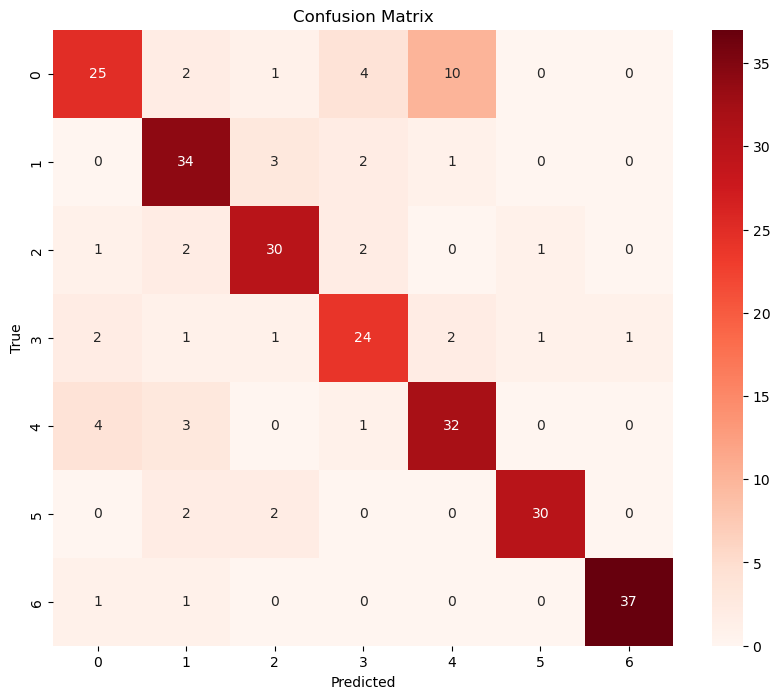

CPU times: total: 359 ms
Wall time: 364 ms


In [374]:
%%time

from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Creating a confusion matrix
cm = confusion_matrix(y_test, svm_predictions)

plt.figure(figsize=(10, 8))

print("L'échantillon de test contient :", X_test.shape[0], "articles.")

# Using seaborn to plot the confusion matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds")

plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


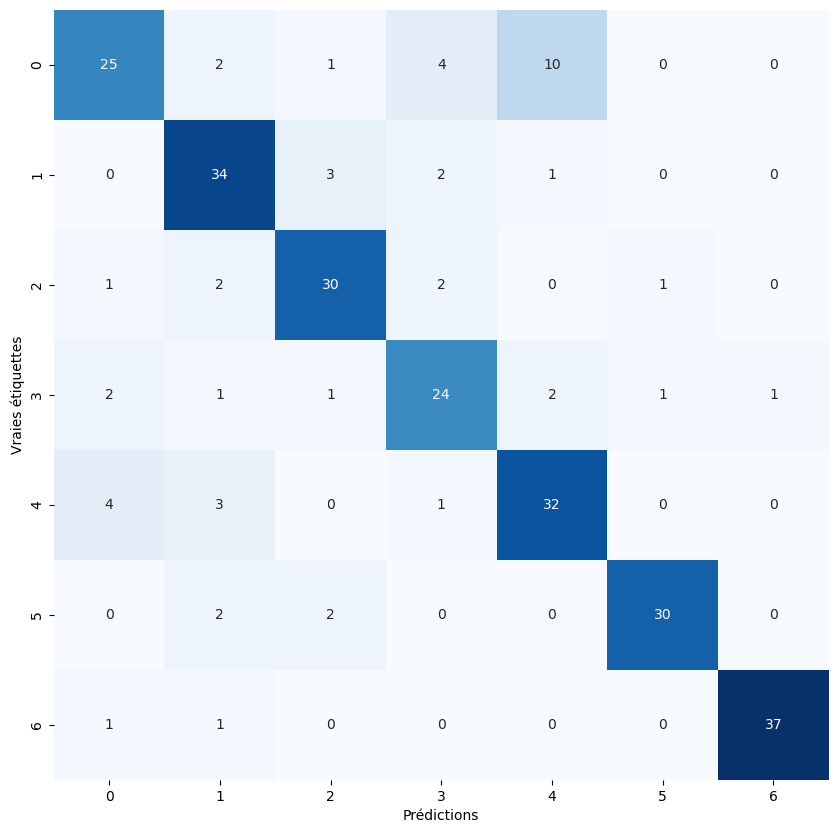

In [370]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Créez la matrice de confusion
cm = confusion_matrix(y_test, svm_predictions)

# Affichez la matrice de confusion sous forme de heatmap avec Seaborn
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Prédictions")
plt.ylabel("Vraies étiquettes")
plt.show()


# Clustering

### K-means

Nous allons rechercher la meilleure itération pour le K-means

In [375]:
def kmeans(mydata):

    #Cette fonction permet de calculer le nombre de clusters le plus optimal pour notre analyse : le coefficient de silhouette

    silhouette = []
    dispersion = []

    result_clusters = []
    result_ninit = []
    result_type_init = []

    df_iter_kmeans = pd.DataFrame()

    n_clusters = range(5,10)
    nbr_init = [10,30,50,70]
    type_init = ["k-means++", "random"]

    #Nous allons tester le modèle entre 2 et 15 clusters
    for num_clusters in n_clusters:

        for init in nbr_init:

            for i in type_init:

                #On configure l'algorithme
                cls = MiniBatchKMeans(n_clusters=num_clusters, 
                                     n_init=init, 
                                     init=i,
                                     random_state=0
                                    )

                #On l'entraîne sur les données préparées
                cls.fit(mydata)

                #On enregistre les scores de coefficient de silhouette à chaque passage
                silh = metrics.silhouette_score(mydata, cls.labels_)
                disp = cls.inertia_

                silhouette.append(silh)
                dispersion.append(disp)
                result_clusters.append(num_clusters)
                result_ninit.append(init)
                result_type_init.append(i)

    df_iter_kmeans["coef_silh"] = silhouette
    df_iter_kmeans["dispersion"] = dispersion
    df_iter_kmeans["nbr_clusters"] = result_clusters
    df_iter_kmeans["n_init"] = result_ninit
    df_iter_kmeans["type_init"] = result_type_init
    
    return df_iter_kmeans

In [376]:
def recherche_best_iter(mydata):

    #On affiche les paramètres de la meilleure itération
    best_iter = mydata.where(mydata["coef_silh"] == mydata["coef_silh"].max())
    best_iter.dropna(how="any", inplace=True)
    
    #On traite le cas où il y a plusieurs solutions possibles
    if best_iter.shape[0] > 0:
        best_iter = best_iter.iloc[0, :]
        
    # print(best_iter)

    return best_iter

In [377]:
def best_kmeans(mydata, best, cat_true):
    
    #On fait retourner le K-means avec la meilleure itération vue précédemment
    #Nous forçons le nombre de lusters à 7
    nbr_clusters = 7  # int(best["nbr_clusters"])
    ninit = int(best["n_init"])
    type_init = best["type_init"]

    cls_kmeans = MiniBatchKMeans(n_clusters=nbr_clusters, 
                                     n_init=ninit, 
                                     init=type_init,
                                     random_state=0
                                    )

    #On l'entraîne sur les données préparées
    cls_kmeans.fit(mydata)

    df_kmeans = pd.DataFrame()
    df_kmeans["labels"] = cls_kmeans.labels_
    df_kmeans["nbr_individus"] = 0
    df_kmeans = df_kmeans.groupby("labels", as_index=False).count()
    
    silh = round(metrics.silhouette_score(mydata, cls_kmeans.labels_), 2)
    ari = round(metrics.adjusted_rand_score(cat_true, cls_kmeans.labels_), 2)
    
    print("Coef silhouette :", silh)
    print("Score Adjusted Rand index :", ari)
    return cls_kmeans.labels_, df_kmeans, silh, ari;

In [378]:
def results_iterations_kmeans(mydata):

    #On affiche les scores

    df_coef_silh = mydata.groupby("nbr_clusters", as_index=False)["coef_silh"].max()
    df_dispersion = mydata.groupby("nbr_clusters", as_index=False)["dispersion"].min()

    plt.subplots(figsize=(25,10))

    plt.subplot(1,2,1)

    plt.plot(df_coef_silh["nbr_clusters"], df_coef_silh["coef_silh"], marker="o")
    plt.xlabel("Nbr de clusters", size=14)
    plt.ylabel("Coefficient de silhouette", size=14)
    plt.title("Variation coefficient de silhouette", size=14)
    plt.grid()

    plt.subplot(1,2,2)

    plt.plot(df_dispersion["nbr_clusters"], df_dispersion["dispersion"], marker="o")
    plt.xlabel("Nbr de clusters", size=14)
    plt.ylabel("Compacité clusters", size=14)
    plt.title("Variation de la compacité des clusters", size=14)
    plt.grid()


In [379]:
def homogeneite_clusters(mydata):

    print(mydata)
    plt.figure(figsize=(10,10))

    plt.bar(mydata["labels"], height=mydata["nbr_individus"])
    plt.xlabel("Nbr de clusters", size=14)
    plt.ylabel("Nbr individus", size=14)
    plt.title("Classement des individus", size=14)

In [380]:
# def affich_tsne(mydata):
                
#     time_start= time.time()

#     tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    
#     tsne_results = tsne.fit_transform(mydata)
    
#     print("TSNE terminée. Temps écoulé {} seconds.".format(time.time() - time_start))

#     df_results = pd.DataFrame(tsne_results, columns=["tsne_2d_one", "tsne_2d_two"])
    
#     #df_results["labels"] = labels #cls_kmeans.labels_
        
#     plt.figure(figsize=(25,12))
    
#     sns.scatterplot(
#         x=df_results["tsne_2d_one"],
#         y=df_results["tsne_2d_two"],
#         hue=mydata["labels"],
#         palette=sns.color_palette("hls", n_colors = len(mydata["labels"].unique())),
#         data=df_results,
#         legend="full",
#         #alpha=0.3
#     )
    

In [381]:
%%time
from sklearn.cluster import MiniBatchKMeans
from sklearn import metrics
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

import time

lst_iterations = [df_iter_texte,
                  df_word2vec,
                  df_iter_bovw,
                  df_iter_vgg16,
                  df_iter_resnet50,
                  df_iter1_nmf,
                  df_iter2_nmf,
                  df_iter3_pca,
                  df_iter4_pca,
                  df_iter5,
                  df_iter6_nmf,
                  df_iter7
                 ]

lst_desc_iter = ["txt-tfidf",
                "txt_word2vec",
                "img_bovw",
                "img_vgg16",
                "img_resnet50",
                "nmf : txt_tfidf | img_bovw",
                "nmf : txt_tfidf | img_VGG16",
                "pca : txt_word2vec | img_bovw",
                "pca : txt_word2vec | img_VGG16",
                "txt_word2vec | img_VGG16_nmf",
                "nmf : txt_tfidf | img_ResNet50",
                "txt_word2vec | img_ResNet50_nmf"
                ]

le = LabelEncoder()
df_train["cat_encodee"] = le.fit_transform(df_train["sous_cat_1"])

# On va lancer l'algorithme pour chaque itération
# puis comparer leur scores : Coeff silhouette + ARI
# en les enregistrant dans un nouveau dataframe

df_scores = pd.DataFrame(columns=["iteration", "silhouette", "ari"], index=range(0, len(lst_iterations)))

j = 0

for i in lst_iterations:

    print("---------------------------------------------")
    print("Traitement de l'itération :", lst_desc_iter[j])
    
    #On fait un gridsearch sur le kmeans
    print("Recherche meilleur paramétrage sur GridSearch")
    df_iter_kmeans = kmeans(i)

    #Affichage des résultats des itérations
    #results_iterations_kmeans(df_iter_kmeans)

    #On recherche la meilleure itération
    print("Sélection meilleure itération")
    df_best_kmeans = recherche_best_iter(df_iter_kmeans)

    #On refait tourner l'algorithme du Kmeans avec la meilleure itération
    print("Kmeans en cours avec les meilleurs hyperparamètres et un nombre de clusters = 7")
    kmeans_labels, results, silhouette, ari = best_kmeans(i, df_best_kmeans, df_train["cat_encodee"])
    
    i["labels"] = kmeans_labels
    df_results_kmeans = results
    
    df_scores["iteration"][j] = lst_desc_iter[j]
    df_scores["silhouette"][j] = silhouette
    df_scores["ari"][j] = ari

    j += 1


---------------------------------------------
Traitement de l'itération : txt-tfidf
Recherche meilleur paramétrage sur GridSearch
Sélection meilleure itération
Kmeans en cours avec les meilleurs hyperparamètres et un nombre de clusters = 7
Coef silhouette : 0.52
Score Adjusted Rand index : 0.14
---------------------------------------------
Traitement de l'itération : txt_word2vec
Recherche meilleur paramétrage sur GridSearch
Sélection meilleure itération
Kmeans en cours avec les meilleurs hyperparamètres et un nombre de clusters = 7
Coef silhouette : 0.34
Score Adjusted Rand index : 0.19
---------------------------------------------
Traitement de l'itération : img_bovw
Recherche meilleur paramétrage sur GridSearch
Sélection meilleure itération
Kmeans en cours avec les meilleurs hyperparamètres et un nombre de clusters = 7
Coef silhouette : 0.28
Score Adjusted Rand index : 0.02
---------------------------------------------
Traitement de l'itération : img_vgg16
Recherche meilleur paramét

# Analyse des résultats

Une fois que toutes nos itérations ont été clusterisées, nous allons étudier les résultats :
 1. Synthèse des scores :
     - Classement des coefficients de silhouette
     - Classement des ARI
     - Choix de la meilleure itération sur l'ARI
     
 2. Etude de la meilleure itération :
     - Analyse TSNE
     - Analyse homogénéïté des clusters
     - Comparaison des clusters en fonction des catégories de départ. Avec une matrice de confusion.

### Etude globale et synthèse

In [382]:
df_scores

,iteration,silhouette,ari
0,txt-tfidf,0.52,0.14
1,txt_word2vec,0.34,0.19
2,img_bovw,0.28,0.02
3,img_vgg16,0.37,0.19
4,img_resnet50,0.42,0.31
5,nmf : txt_tfidf | img_bovw,0.21,0.02
6,nmf : txt_tfidf | img_VGG16,0.62,0.11
7,pca : txt_word2vec | img_bovw,0.06,0.02
8,pca : txt_word2vec | img_VGG16,0.07,0.09
9,txt_word2vec | img_VGG16_nmf,0.35,0.14


Text(0.5, 1.0, 'Comparaison coefficients de silhouette')

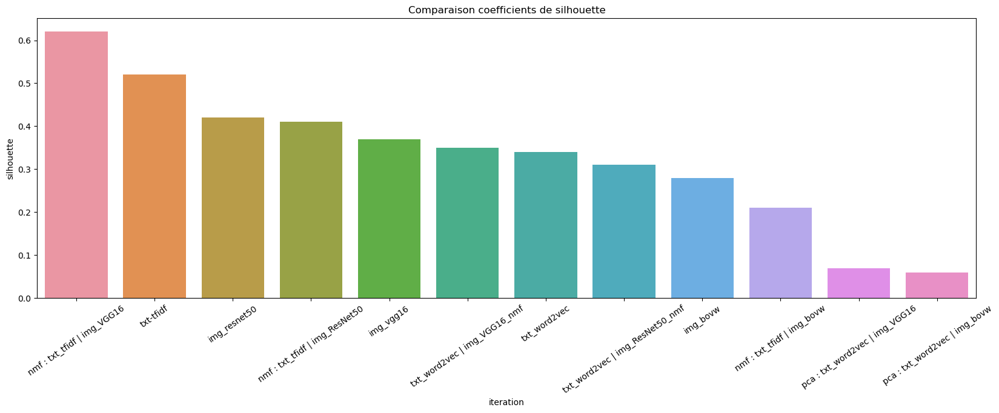

In [383]:

data = df_scores.sort_values(by="silhouette", ascending=False)
plt.figure(figsize=(20, 6))
plt.xticks(rotation=35)
sns.barplot(x=data["iteration"], y=data["silhouette"])
plt.title("Comparaison coefficients de silhouette", size=12)

Text(0.5, 1.0, 'Comparaison des Adjusted Rand Index')

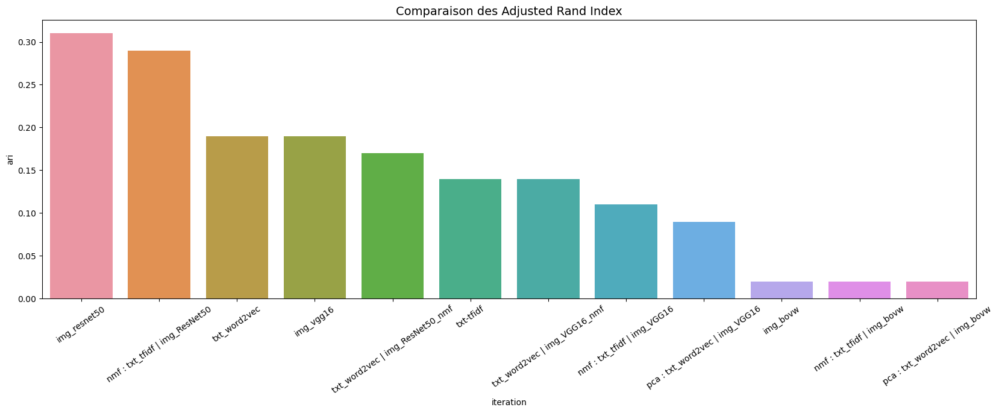

In [385]:
data = df_scores.sort_values(by="ari", ascending=False)
plt.figure(figsize=(20, 6))
plt.xticks(rotation=35)
sns.barplot(x=data["iteration"], y=data["ari"])
plt.title("Comparaison des Adjusted Rand Index", size=14)

### Etude meilleure itération

#### TSNE

In [391]:
df_iter6_nmf

,0,1,2,3,4,5,6,labels
0,7.516059e-02,4.358139e-03,9.488087e-01,0.681834,6.036394e-04,1.260794e-07,1.205321e-01,1
1,2.893480e-02,1.889128e-15,9.823526e-02,0.699285,4.422195e-12,3.645082e-01,1.611769e+00,0
2,2.943758e-07,4.601541e-15,7.517537e-03,1.932281,1.206985e-05,1.162461e-02,4.603755e-01,1
3,1.226697e-04,6.166205e-08,2.558243e-08,1.269966,7.336987e-03,5.534088e-02,5.705261e-01,1
4,7.153722e-02,5.901740e-04,3.318298e-10,1.422791,2.814798e-02,2.983010e-01,4.471772e-01,1
...,...,...,...,...,...,...,...,...
1045,1.383027e-02,3.034187e-13,1.616497e-06,0.881551,1.511062e-01,7.955313e-02,3.082260e-01,1
1046,1.904104e+00,7.270910e-06,4.773703e-02,0.607885,4.127221e-02,1.745327e-13,6.402726e-08,5
1047,4.033838e-01,4.804692e-07,3.099574e-05,0.817209,2.194507e-01,1.610880e-01,6.922833e-01,1
1048,2.103607e+00,4.956562e-03,6.112274e-03,0.632962,8.425486e-03,7.856426e-12,2.994737e-06,5


In [397]:
def affich_tsne(mydata):
    time_start = time.time()
    # 2. Séparez les caractéristiques (colonnes 0 à 6) des étiquettes (colonne "labels") dans votre DataFrame :

    X = mydata.iloc[:, :-1]  # Caractéristiques
    y = mydata["labels"]  # Étiquettes

# 3. Appliquez t-SNE pour réduire les dimensions :

#     tsne = TSNE(n_components=2, perplexity=30, random_state=42)
#     X_tsne = tsne.fit_transform(X)

    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    
    mydata = mydata.astype(str)  # Convertir toutes les données en chaînes de caractères
    
    tsne_results = tsne.fit_transform(X)
    
    print("TSNE terminée. Temps écoulé {} seconds.".format(time.time() - time_start))

    df_results = pd.DataFrame(tsne_results, columns=["tsne_2d_one", "tsne_2d_two"])
    
    plt.figure(figsize=(25, 12))
    
    sns.scatterplot(
        x=df_results["tsne_2d_one"],
        y=df_results["tsne_2d_two"],
        hue=mydata["labels"],
        palette=sns.color_palette("hls", n_colors=len(mydata["labels"].unique())),
        data=df_results,
        legend="full",
    )


TSNE - Kmeans
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.047s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.319679
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.243351
[t-SNE] KL divergence after 300 iterations: 0.762134
TSNE terminée. Temps écoulé 1.751866102218628 seconds.


<Figure size 2000x600 with 0 Axes>

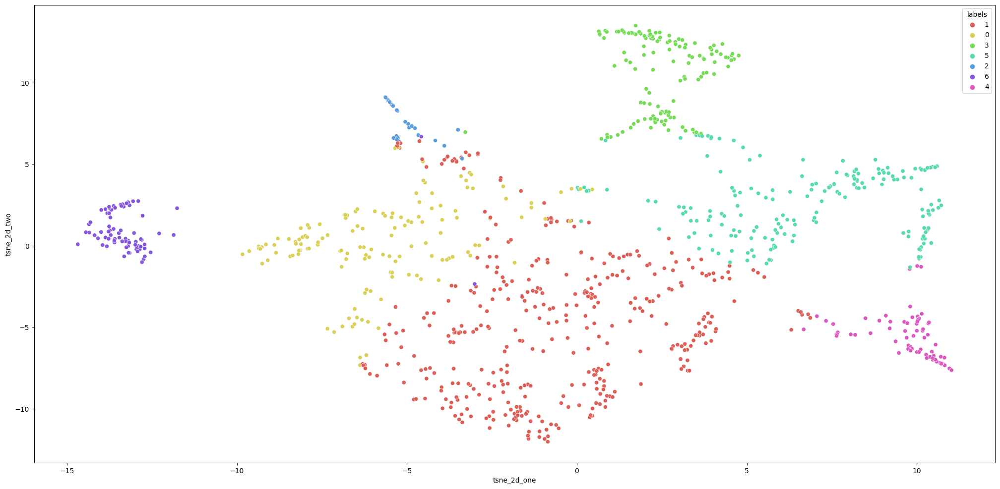

In [399]:

# On affiche l'aspect de l'homogénéité des clusters
# print("Homogénéité clusters")
# homogeneite_clusters(df_results_kmeans)

# On affiche la TSNE
print("TSNE - Kmeans")
plt.figure(figsize=(20,6))
affich_tsne(df_iter6_nmf)

In [394]:
# def affich_tsne(mydata):
                
#     time_start= time.time()

#     tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    
#     tsne_results = tsne.fit_transform(mydata)
    
#     print("TSNE terminée. Temps écoulé {} seconds.".format(time.time() - time_start))

#     df_results = pd.DataFrame(tsne_results, columns=["tsne_2d_one", "tsne_2d_two"])
    
#     #df_results["labels"] = labels #cls_kmeans.labels_
        
#     plt.figure(figsize=(25,12))
    
#     sns.scatterplot(
#         x=df_results["tsne_2d_one"],
#         y=df_results["tsne_2d_two"],
#         hue=mydata["labels"],
#         palette=sns.color_palette("hls", n_colors = len(mydata["labels"].unique())),
#         data=df_results,
#         legend="full",
#         #alpha=0.3
#     )

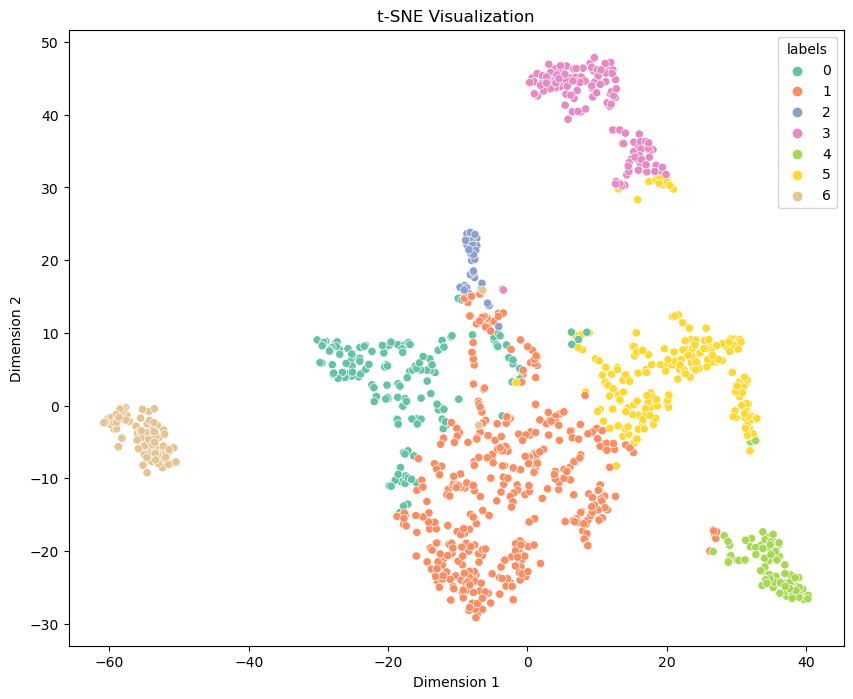

In [406]:
# 1. Importez les bibliothèques nécessaires :

import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# 2. Séparez les caractéristiques (colonnes 0 à 6) des étiquettes (colonne "labels") dans votre DataFrame :

X = df_iter6_nmf.iloc[:, :-1]  # Caractéristiques
y = df_iter6_nmf["labels"]  # Étiquettes

# 3. Appliquez t-SNE pour réduire les dimensions :

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X)

# - `n_components` définit le nombre de dimensions souhaité après la réduction. Ici, nous utilisons 2 pour obtenir une représentation en 2D.
# - `perplexity` est un paramètre qui peut être ajusté pour influencer la réduction, il détermine l'équilibre entre les zones denses et les zones étendues dans la projection. Vous pouvez ajuster sa valeur en fonction de votre besoin.

# 4. Créez un nouveau DataFrame avec les coordonnées t-SNE et les étiquettes :

tsne_df = pd.DataFrame(data={"Dimension 1": X_tsne[:, 0], "Dimension 2": X_tsne[:, 1], "labels": y})

# 5. Visualisez les données réduites avec t-SNE en utilisant Matplotlib :

plt.figure(figsize=(10, 8))
sns.scatterplot(x="Dimension 1", y="Dimension 2", hue="labels", data=tsne_df, palette="Set2")
plt.title("t-SNE Visualization")
plt.show()


#### Homogénéïté clusters

In [407]:
df_nb_individus = pd.DataFrame(df_iter6_nmf["labels"].value_counts(), columns=["labels", "nbr_individus"])
df_nb_individus["nbr_individus"] = df_nb_individus["labels"]
df_nb_individus.drop("labels", axis=1, inplace=True)
df_nb_individus.reset_index(inplace=True)
df_nb_individus = df_nb_individus.rename(columns={"index": "labels"})
df_nb_individus

,labels,nbr_individus
0,1,377
1,5,194
2,0,162
3,3,128
4,4,78
5,6,75
6,2,36


Homogénéité clusters
   labels  nbr_individus
0       1            377
1       5            194
2       0            162
3       3            128
4       4             78
5       6             75
6       2             36


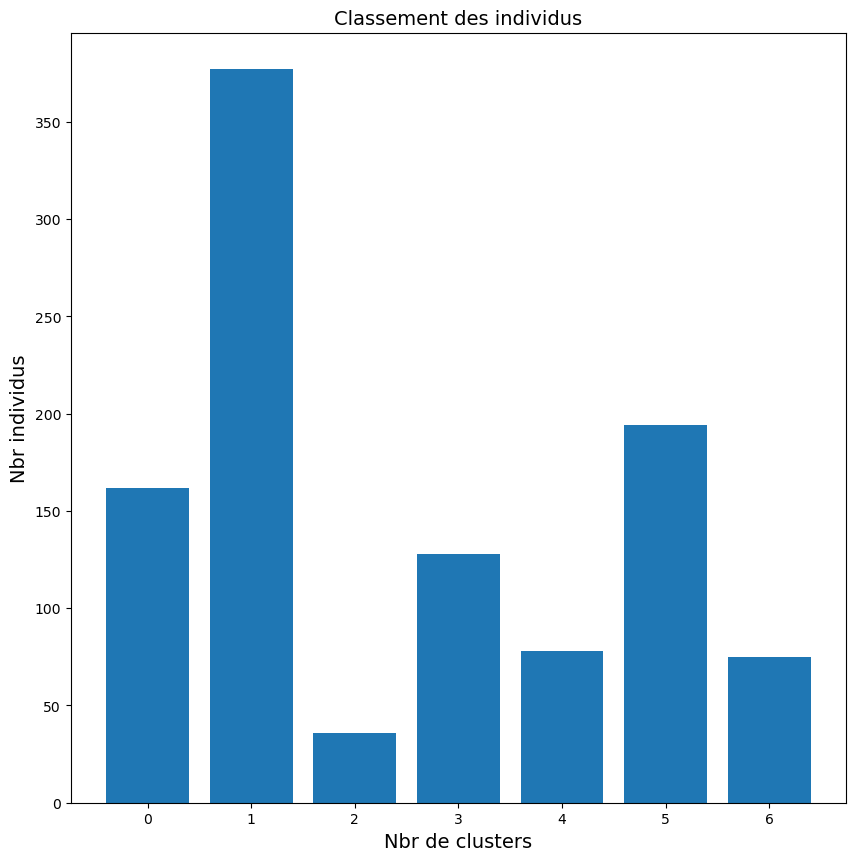

In [408]:
# On affiche l'aspect de l'homogénéité des clusters
print("Homogénéité clusters")
homogeneite_clusters(df_nb_individus)


In [410]:
df_tri_cat["sous_cat_1"].unique()

array([' Care ', ' Decor & Festive Needs ', ' Furnishing ',
       'hen & Dining ', 'hes ', 'ty and Personal Care ', 'uters '],
      dtype=object)

In [434]:
data_t = pd.read_csv("data/flipkart_com-ecommerce_sample_1050.csv")

df_tri_cat_t = data_t.loc[:, ["description", "product_category_tree"]]

# On crée une liste de strings en supprimant les >>
df1 = df_tri_cat_t["product_category_tree"].str.split(">>")

# Et on ne récupère que la deuxième valeur de la liste
# Ce qui correspondra à notre catégorie de produits
df_tri_cat["sous_cat_1"] = df1.apply(lambda x: x[0])
# df_train["sous_cat_2"] = df.apply(lambda x: x[1])

In [489]:
df_tri_cat.head(1)

,description,product_category_tree,sous_cat_1,sous_cat_2,tf_idf,word2vec,image,image_grayscale,image_redim,image_redim_contrast,bovw,VGG16,resnet50,cat_encodee
1049,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...","[""Baby Care",Baby & Kids Gifts,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.08955493, 0.12389432, -0.016749272, 0.2335...",data/Images/f2f027ad6a6df617c9f125173da71e44.jpg,data/Images/Images_grayscale/f2f027ad6a6df617c...,data/Images/Images_redim/f2f027ad6a6df617c9f12...,data/Images/Images_redim_contrast/f2f027ad6a6d...,"[3.0, 0.0, 1.0, 1.0, 2.0, 0.0, 9.0, 0.0, 3.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0


In [435]:
df_tri_cat["sous_cat_1"].unique()

array(['["Baby Care ', '["Home Decor & Festive Needs ',
       '["Home Furnishing ', '["Kitchen & Dining ', '["Watches ',
       '["Beauty and Personal Care ', '["Computers '], dtype=object)

#### Matrice de confusion

Text(0.5, 80.7222222222222, 'Clusters')

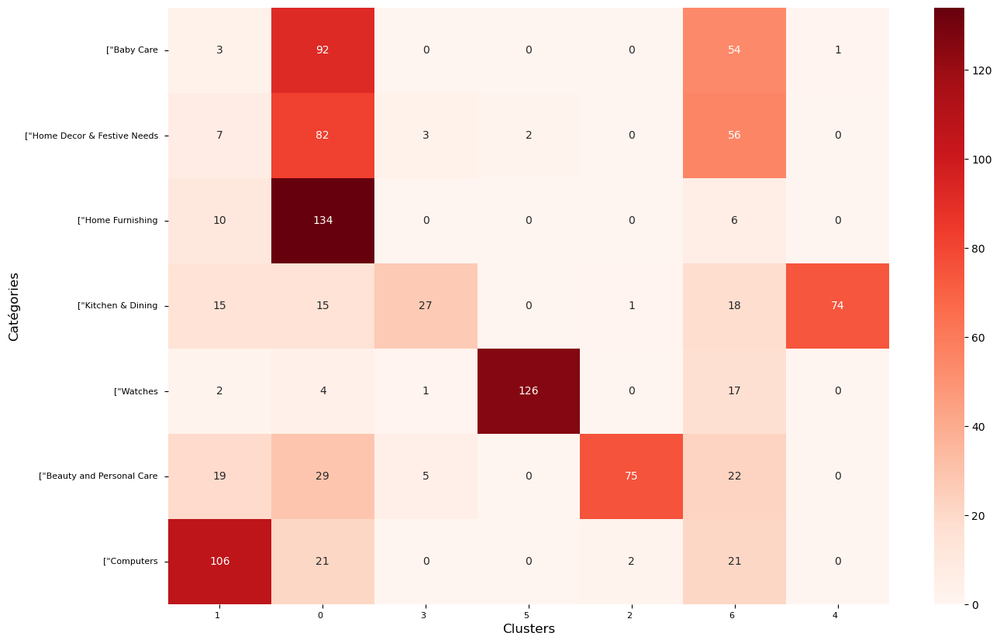

In [437]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(df_train["cat_encodee"], df_iter6_nmf["labels"])

# df_tri_cat = df_train.sort_values()

df_cm = pd.DataFrame(cm, 
                     index=df_tri_cat["sous_cat_1"].unique(), 
                     columns=df_iter6_nmf["labels"].unique()
                    )

fig = plt.figure(figsize=(15,10))

try:
    heatmap = sns.heatmap(df_cm, annot=True, fmt="d", cmap="Reds")
except ValueError:
    raise ValueError("Confusion matrix values must be integers.")
    
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=8)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=8)
plt.ylabel("Catégories", size=12)
plt.xlabel("Clusters", size=12)

In [490]:
# param_dist = {'C': [0.001, 0.01, 0.1, 1, 10]}
# random_search = RandomizedSearchCV(LogisticRegression(),
#                             param_distributions=param_dist,
#                             cv=10)

# df_train_vect = df_iter6_nmf.drop("labels", axis=1)
# df_target = df_iter6_nmf["labels"]
# rand_search_iter6 = random_search.fit(df_iter6_nmf, des_target)

# print("Mean Random Search accuracy:", rand_search_iter6.best_score_)

In [441]:
from sklearn.neighbors import KNeighborsClassifier

#create new a knn model
knn = KNeighborsClassifier()

#create a dictionary of all values we want to test for n_neighbors
param_grid = {"n_neighbors": np.arange(1, 11)}

#use gridsearch to test all values for n_neighbors
knn_gscv = GridSearchCV(knn, param_grid, cv=10)

#fit model to data
knn_gscv.fit(df_train_vect, df_target)
    
#check top performing n_neighbors value
print("La meilleure accuracy est",
      knn_gscv.score(df_train_vect, df_target),
      "avec",
      knn_gscv.best_params_,
      "voisins.")

La meilleure accuracy est 0.98 avec {'n_neighbors': 8} voisins.


In [444]:
from sklearn.model_selection import GridSearchCV

# Créez le modèle (par exemple, DecisionTreeClassifier)
model = DecisionTreeClassifier()

# Définissez la grille des hyperparamètres à rechercher
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Utilisez GridSearchCV pour la recherche exhaustive
grid_search = GridSearchCV(model, param_grid=param_grid, cv=5)
grid_search.fit(df_train_vect, df_target)

# Affichez les résultats
print("Meilleure accuracy :", grid_search.best_score_)
print("Meilleurs hyperparamètres :", grid_search.best_params_)


Meilleure accuracy : 0.9514285714285714
Meilleurs hyperparamètres : {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [453]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Créez le modèle (par exemple, RandomForestClassifier)
model = RandomForestClassifier()

# Définissez la grille des hyperparamètres à rechercher (ici, n_estimators et max_depth)
param_dist = {
    'n_estimators': randint(1, 100),
    'max_depth': randint(1, 20)
}

# Utilisez RandomizedSearchCV pour la recherche aléatoire
random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=5)
random_search.fit(df_train_vect, df_target)

# Affichez les résultats
print("Meilleure accuracy :", random_search.best_score_)
print("Meilleurs hyperparamètres :", random_search.best_params_)


Meilleure accuracy : 0.9647619047619049
Meilleurs hyperparamètres : {'max_depth': 14, 'n_estimators': 74}


In [452]:
# !pip install scikit-optimize


In [451]:
# from skopt import BayesSearchCV
# from skopt.space import Real, Categorical, Integer

# # Créez le modèle (par exemple, RandomForestClassifier)
# model = RandomForestClassifier()

# # Définissez l'espace des hyperparamètres à rechercher
# param_dist = {
#     'n_estimators': Integer(1, 100),
#     'max_depth': Integer(1, 20),
#     'min_samples_split': Real(0.1, 1.0),
#     'min_samples_leaf': Real(0.1, 0.5),
#     'criterion': Categorical(['gini', 'entropy'])
# }

# # Utilisez BayesSearchCV pour la recherche bayésienne
# bayes_search = BayesSearchCV(
#     model,
#     search_spaces=param_dist,
#     n_iter=10,  # Nombre d'itérations pour la recherche
#     cv=5
# )

# bayes_search.fit(df_train_vect, df_target)

# # Affichez les résultats
# print("Meilleure accuracy :", bayes_search.best_score_)
# print("Meilleurs hyperparamètres :", bayes_search.best_params_)


In [511]:
import time
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from keras.layers import LSTM, Conv3D, GlobalAveragePooling2D, Dense
from keras.applications import VGG16
from keras.models import Sequential
from keras.utils import to_categorical
from keras.preprocessing import image
from tensorflow.keras.layers import Dense, Embedding, LSTM, Bidirectional, Conv1D, MaxPooling3D, MaxPooling1D, GlobalMaxPooling1D, GlobalAveragePooling3D, Dropout
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

def compare_methods(df):
    # Séparation des caractéristiques (X) et de la cible (y)
    X = df.drop("cat_encodee", axis=1)
    # Sélectionnez uniquement les colonnes numériques


    y = df["cat_encodee"]
    # Traitement des données textuelles avec TF-IDF
    tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words="english")
    X_tfidf = tfidf_vectorizer.fit_transform(df["description"])
    X = X.select_dtypes(include=[np.number])
    # Ajoutez les caractéristiques TF-IDF aux caractéristiques existantes
    X = np.hstack((X.values, X_tfidf.toarray()))
    
#     # Division des données en ensembles d'entraînement et de test
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        
    # Division des données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Méthode 1 : Random Forest
    start_time = time.time()
    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier.fit(X_train, y_train)
    rf_pred = rf_classifier.predict(X_test)
    rf_accuracy = accuracy_score(y_test, rf_pred)
    rf_time = time.time() - start_time
    
    # Méthode 2 : SVM avec PCA
    start_time = time.time()
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    pca = PCA(n_components=50)  # Réduction de dimension
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)
    svm_classifier = SVC(kernel='linear', C=1, random_state=42)
    svm_classifier.fit(X_train_pca, y_train)
    svm_pred = svm_classifier.predict(X_test_pca)
    svm_accuracy = accuracy_score(y_test, svm_pred)
    svm_time = time.time() - start_time
    
    # Méthode 3 : Réseaux neuronaux récurrents à mémoire à long terme (LSTM)
    start_time = time.time()
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
#     X_train_lstm = X_train.values.reshape(-1, 1, X_train.shape[1])
#     X_test_lstm = X_test.values.reshape(-1, 1, X_test.shape[1])
    X_train_lstm = X_train.reshape(-1, 1, X_train.shape[1])
    X_test_lstm = X_test.reshape(-1, 1, X_test.shape[1])

    
    lstm_model = Sequential()
    lstm_model.add(LSTM(100, input_shape=(1, X_train.shape[1])))
    lstm_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
    lstm_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    lstm_model.fit(X_train_lstm, y_train_encoded, epochs=10, batch_size=64, verbose=0)
    lstm_accuracy = lstm_model.evaluate(X_test_lstm, y_test_encoded, verbose=0)[1]
    lstm_time = time.time() - start_time
    
    # Méthode 4 : Réseaux neuronaux à convolution en 3D (3D CNN)
    start_time = time.time()
#     X_train_3d = X_train.values.reshape(-1, 10, 10, 10, 1)
#     X_test_3d = X_test.values.reshape(-1, 10, 10, 10, 1)
    X_train_3d = X_train.reshape(-1, 10, 10, 10, 1)
    X_test_3d = X_test.reshape(-1, 10, 10, 10, 1)

    
    cnn3d_model = Sequential()
    cnn3d_model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(10, 10, 10, 1)))
    cnn3d_model.add(MaxPooling3D(pool_size=(2, 2, 2)))  # Ajoutez une couche de réduction de dimension
    cnn3d_model.add(GlobalAveragePooling3D())  # Couche GlobalAveragePooling3D
    cnn3d_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
    cnn3d_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    
#     cnn3d_model = Sequential()
#     cnn3d_model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(10, 10, 10, 1)))
#     cnn3d_model.add(GlobalAveragePooling2D())
#     cnn3d_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
#     cnn3d_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    cnn3d_model.fit(X_train_3d, y_train_encoded, epochs=10, batch_size=64, verbose=0)
    cnn3d_accuracy = cnn3d_model.evaluate(X_test_3d, y_test_encoded, verbose=0)[1]
    cnn3d_time = time.time() - start_time
    
#     # Méthode 5 : Réseaux de neurones pré-entraînés (Transfer Learning)
#     print("img_path : " , img_path)
#     start_time = time.time()
#     base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#     X_train_transfer = np.array([image.img_to_array(image.load_img(img_path, target_size=(224, 224))) for img_path in X_train["image"]])
#     X_test_transfer = np.array([image.img_to_array(image.load_img(img_path, target_size=(224, 224))) for img_path in X_test["image"]])
#     X_train_transfer = base_model.predict(X_train_transfer)
#     X_test_transfer = base_model.predict(X_test_transfer)
    
#     model = Sequential()
#     model.add(GlobalAveragePooling2D(input_shape=X_train_transfer.shape[1:]))
#     model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
#     model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
#     model.fit(X_train_transfer, y_train_encoded, epochs=10, batch_size=64, verbose=0)
#     transfer_accuracy = model.evaluate(X_test_transfer, y_test_encoded, verbose=0)[1]
#     transfer_time = time.time() - start_time

    transfer_accuracy = 0
    transfer_time = 0

    # Méthode 6 : Réseaux de neurones profonds (DNN)
    start_time = time.time()
    dnn_model = Sequential()
    dnn_model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
    dnn_model.add(Dense(64, activation='relu'))
    dnn_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
    dnn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    dnn_model.fit(X_train_scaled, y_train_encoded, epochs=10, batch_size=64, verbose=0)
    dnn_accuracy = dnn_model.evaluate(X_test_scaled, y_test_encoded, verbose=0)[1]
    dnn_time = time.time() - start_time
    
    # Créez un DataFrame pour stocker les résultats
    results = pd.DataFrame({
        'Méthode': ['Random Forest', 'SVM avec PCA', 'LSTM', '3D CNN', 'Transfer Learning', 'DNN'],
        'Précision': [rf_accuracy, svm_accuracy, lstm_accuracy, cnn3d_accuracy, transfer_accuracy, dnn_accuracy],
        'Temps (secondes)': [rf_time, svm_time, lstm_time, cnn3d_time, transfer_time, dnn_time]
    })
    
    return results

# Utilisation de la fonction avec votre dataframe
# df = ...  # Remplacez ceci par votre dataframe
comparison_results = compare_methods(df_tri_cat)
print(comparison_results)


             Méthode  Précision  Temps (secondes)
0      Random Forest   0.933333          0.797126
1       SVM avec PCA   0.885714          0.110473
2               LSTM   0.933333          4.740831
3             3D CNN   0.119048         16.866670
4  Transfer Learning   0.000000          0.000000
5                DNN   0.909524          1.264399


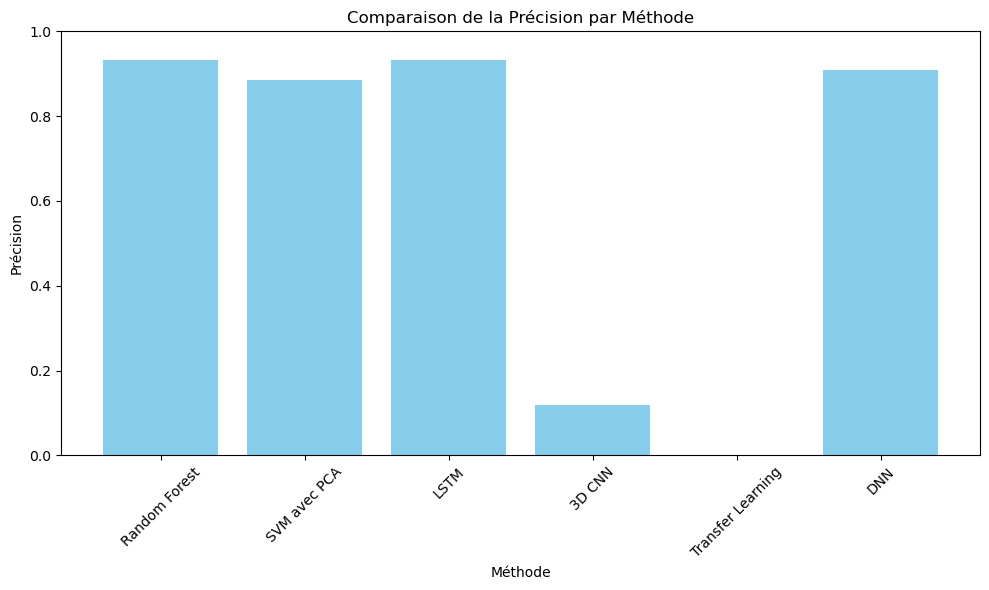

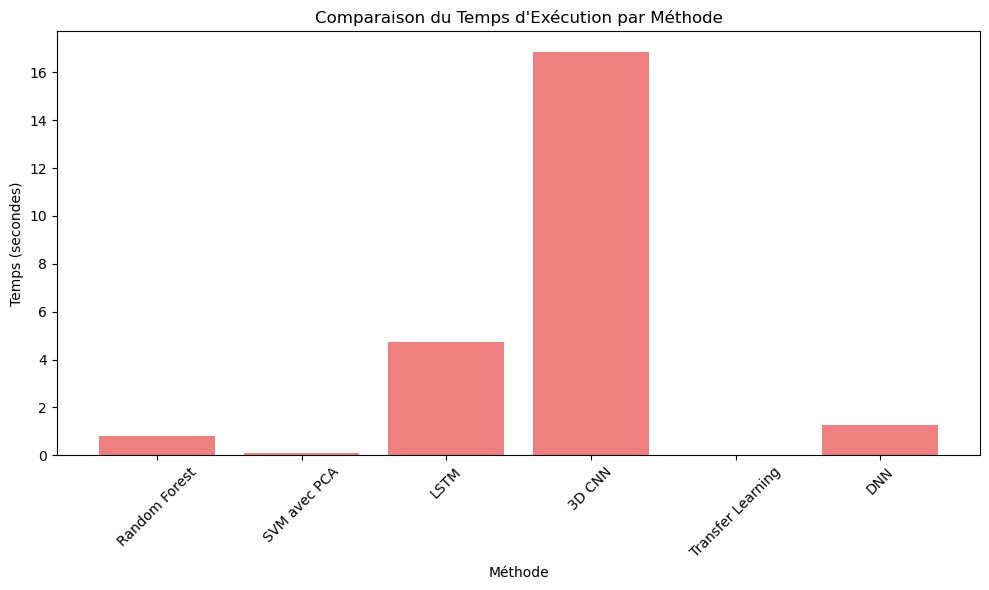

In [513]:
# 1. Graphique de comparaison de précision :

plt.figure(figsize=(10, 6))
plt.bar(comparison_results['Méthode'], comparison_results['Précision'], color='skyblue')
plt.title('Comparaison de la Précision par Méthode')
plt.xlabel('Méthode')
plt.ylabel('Précision')
plt.ylim(0, 1.0)  # Ajustez cette plage en fonction de vos données
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Graphique de comparaison de temps d'exécution :

plt.figure(figsize=(10, 6))
plt.bar(comparison_results['Méthode'], comparison_results['Temps (secondes)'], color='lightcoral')
plt.title('Comparaison du Temps d\'Exécution par Méthode')
plt.xlabel('Méthode')
plt.ylabel('Temps (secondes)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [522]:
import time
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from keras.layers import LSTM, Conv3D, GlobalAveragePooling2D, Dense
from keras.applications import VGG16
from keras.models import Sequential
from keras.utils import to_categorical
from keras.preprocessing import image
from tensorflow.keras.layers import Dense, Embedding, LSTM, Bidirectional, Conv1D, MaxPooling3D, MaxPooling1D, GlobalMaxPooling1D, GlobalMaxPooling3D, GlobalAveragePooling3D, Dropout
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

def compare_methods(df):
    # Séparation des caractéristiques (X) et de la cible (y)
    X = df.drop("cat_encodee", axis=1)
    # Sélectionnez uniquement les colonnes numériques


    y = df["cat_encodee"]
    # Traitement des données textuelles avec TF-IDF
    tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words="english")
    X_tfidf = tfidf_vectorizer.fit_transform(df["description"])
    X = X.select_dtypes(include=[np.number])
    # Ajoutez les caractéristiques TF-IDF aux caractéristiques existantes
    X = np.hstack((X.values, X_tfidf.toarray()))
    
#     # Division des données en ensembles d'entraînement et de test
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        
    # Division des données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Méthode 1 : Random Forest
    start_time = time.time()
    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier.fit(X_train, y_train)
    rf_pred = rf_classifier.predict(X_test)
    rf_accuracy = accuracy_score(y_test, rf_pred)
    rf_time = time.time() - start_time
    
    # Méthode 2 : SVM avec PCA
    start_time = time.time()
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    pca = PCA(n_components=50)  # Réduction de dimension
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)
    svm_classifier = SVC(kernel='linear', C=1, random_state=42)
    svm_classifier.fit(X_train_pca, y_train)
    svm_pred = svm_classifier.predict(X_test_pca)
    svm_accuracy = accuracy_score(y_test, svm_pred)
    svm_time = time.time() - start_time
    
    # Méthode 3 : Réseaux neuronaux récurrents à mémoire à long terme (LSTM)
    start_time = time.time()
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
#     X_train_lstm = X_train.values.reshape(-1, 1, X_train.shape[1])
#     X_test_lstm = X_test.values.reshape(-1, 1, X_test.shape[1])
    X_train_lstm = X_train.reshape(-1, 1, X_train.shape[1])
    X_test_lstm = X_test.reshape(-1, 1, X_test.shape[1])

    
    lstm_model = Sequential()
    lstm_model.add(LSTM(100, input_shape=(1, X_train.shape[1])))
    lstm_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
    lstm_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    lstm_model.fit(X_train_lstm, y_train_encoded, epochs=10, batch_size=64, verbose=0)
    lstm_accuracy = lstm_model.evaluate(X_test_lstm, y_test_encoded, verbose=0)[1]
    lstm_time = time.time() - start_time
    
    # Méthode 4 : Réseaux neuronaux à convolution en 3D (3D CNN)
    start_time = time.time()
#     X_train_3d = X_train.values.reshape(-1, 10, 10, 10, 1)
#     X_test_3d = X_test.values.reshape(-1, 10, 10, 10, 1)
    X_train_3d = X_train.reshape(-1, 10, 10, 10, 1)
    X_test_3d = X_test.reshape(-1, 10, 10, 10, 1)

    
    cnn3d_model = Sequential()
    cnn3d_model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(10, 10, 10, 1)))
    cnn3d_model.add(MaxPooling3D(pool_size=(2, 2, 2)))  # Ajoutez une couche de réduction de dimension
    cnn3d_model.add(GlobalAveragePooling3D())  # Couche GlobalAveragePooling3D
    cnn3d_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
    cnn3d_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    
#     cnn3d_model = Sequential()
#     cnn3d_model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(10, 10, 10, 1)))
#     cnn3d_model.add(GlobalAveragePooling2D())
#     cnn3d_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
#     cnn3d_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    cnn3d_model.fit(X_train_3d, y_train_encoded, epochs=10, batch_size=64, verbose=0)
    cnn3d_accuracy = cnn3d_model.evaluate(X_test_3d, y_test_encoded, verbose=0)[1]
    cnn3d_time = time.time() - start_time
    
#     # Méthode 5 : Réseaux de neurones pré-entraînés (Transfer Learning)
#     print("img_path : " , img_path)
#     start_time = time.time()
#     base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#     X_train_transfer = np.array([image.img_to_array(image.load_img(img_path, target_size=(224, 224))) for img_path in X_train["image"]])
#     X_test_transfer = np.array([image.img_to_array(image.load_img(img_path, target_size=(224, 224))) for img_path in X_test["image"]])
#     X_train_transfer = base_model.predict(X_train_transfer)
#     X_test_transfer = base_model.predict(X_test_transfer)
    
#     model = Sequential()
#     model.add(GlobalAveragePooling2D(input_shape=X_train_transfer.shape[1:]))
#     model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
#     model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
#     model.fit(X_train_transfer, y_train_encoded, epochs=10, batch_size=64, verbose=0)
#     transfer_accuracy = model.evaluate(X_test_transfer, y_test_encoded, verbose=0)[1]
#     transfer_time = time.time() - start_time

    transfer_accuracy = 0
    transfer_time = 0

    # Méthode 6 : Réseaux de neurones profonds (DNN)
    start_time = time.time()
    dnn_model = Sequential()
    dnn_model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
    dnn_model.add(Dense(64, activation='relu'))
    dnn_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
    dnn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    dnn_model.fit(X_train_scaled, y_train_encoded, epochs=10, batch_size=64, verbose=0)
    dnn_accuracy = dnn_model.evaluate(X_test_scaled, y_test_encoded, verbose=0)[1]
    dnn_time = time.time() - start_time

    
    # Méthode 6 : Réseaux neuronaux récurrents à structure hiérarchique (HRNN)
    start_time = time.time()
    hrnn_model = Sequential()

#     hrnn_model.add(LSTM(100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
    hrnn_model.add(LSTM(100, return_sequences=True))
    hrnn_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
    hrnn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    hrnn_model.fit(X_train_lstm, y_train_encoded, epochs=10, batch_size=64, verbose=0)
    hrnn_accuracy = hrnn_model.evaluate(X_test_lstm, y_test_encoded, verbose=0)[1]
    hrnn_time = time.time() - start_time

#     # Méthode 7 : Réseaux neuronaux récurrents à événements (ERNN)
#     start_time = time.time()
#     ernn_model = Sequential()
# #     ernn_model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
#     ernn_model.add(MaxPooling1D(pool_size=2))
#     ernn_model.add(Bidirectional(LSTM(100, return_sequences=True)))
#     ernn_model.add(GlobalMaxPooling3D())
#     ernn_model.add(Dense(len(np.unique(y_train_encoded)), activation='softmax'))
#     ernn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
#     ernn_model.fit(X_train_lstm, y_train_encoded, epochs=10, batch_size=64, verbose=0)
#     ernn_accuracy = ernn_model.evaluate(X_test_lstm, y_test_encoded, verbose=0)[1]
#     ernn_time = time.time() - start_time
    ernn_accuracy = 0
    ernn_time = 0
    
    # Créez un DataFrame pour stocker les résultats
    results = pd.DataFrame({
        'Méthode': ['Random Forest', 'SVM avec PCA', 'LSTM', '3D CNN', 'Réseaux de neurones profonds (DNN)', 'Réseaux neuronaux récurrents à structure hiérarchique (HRNN)', 'Réseaux neuronaux récurrents à événements (ERNN)'],
        'Précision': [rf_accuracy, svm_accuracy, lstm_accuracy, cnn3d_accuracy, dnn_accuracy, hrnn_accuracy, ernn_accuracy],
        'Temps (secondes)': [rf_time, svm_time, lstm_time, cnn3d_time, dnn_time, hrnn_time, ernn_time]
    })
    
    
#     # Créez un DataFrame pour stocker les résultats
#     results = pd.DataFrame({
#         'Méthode': ['Random Forest', 'SVM avec PCA', 'LSTM', '3D CNN', 'Transfer Learning', 'DNN'],
#         'Précision': [rf_accuracy, svm_accuracy, lstm_accuracy, cnn3d_accuracy, transfer_accuracy, dnn_accuracy],
#         'Temps (secondes)': [rf_time, svm_time, lstm_time, cnn3d_time, transfer_time, dnn_time]
#     })
    
    return results

# Utilisation de la fonction avec votre dataframe
# df = ...  # Remplacez ceci par votre dataframe
comparison_results = compare_methods(df_tri_cat)
print(comparison_results)


                                             Méthode  Précision  \
0                                      Random Forest   0.933333   
1                                       SVM avec PCA   0.890476   
2                                               LSTM   0.928571   
3                                             3D CNN   0.119048   
4                 Réseaux de neurones profonds (DNN)   0.909524   
5  Réseaux neuronaux récurrents à structure hiéra...   0.160173   
6   Réseaux neuronaux récurrents à événements (ERNN)   0.000000   

   Temps (secondes)  
0          0.694318  
1          0.089999  
2          4.217467  
3         17.444031  
4          1.653355  
5          4.746419  
6          0.000000  


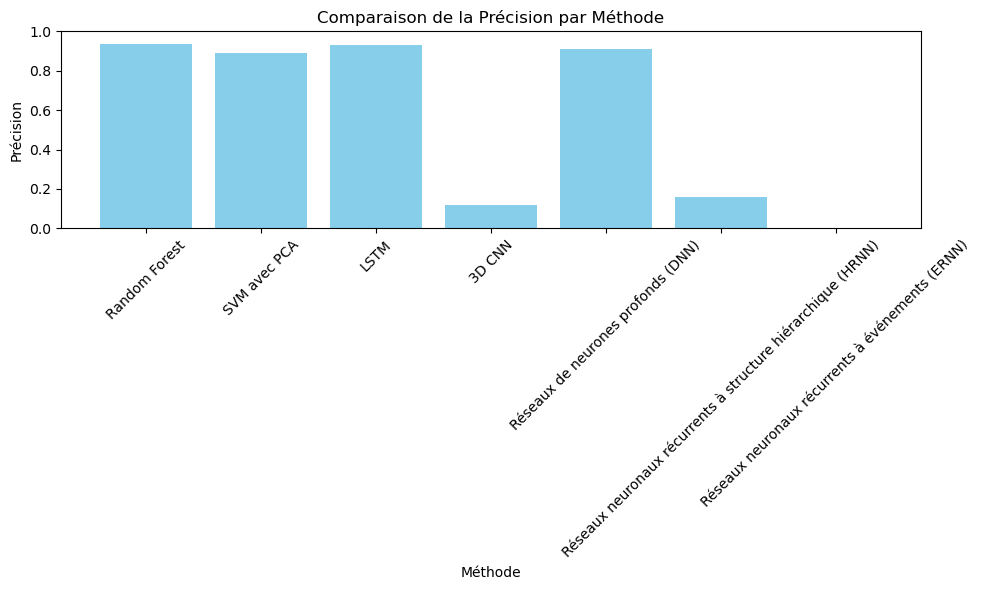

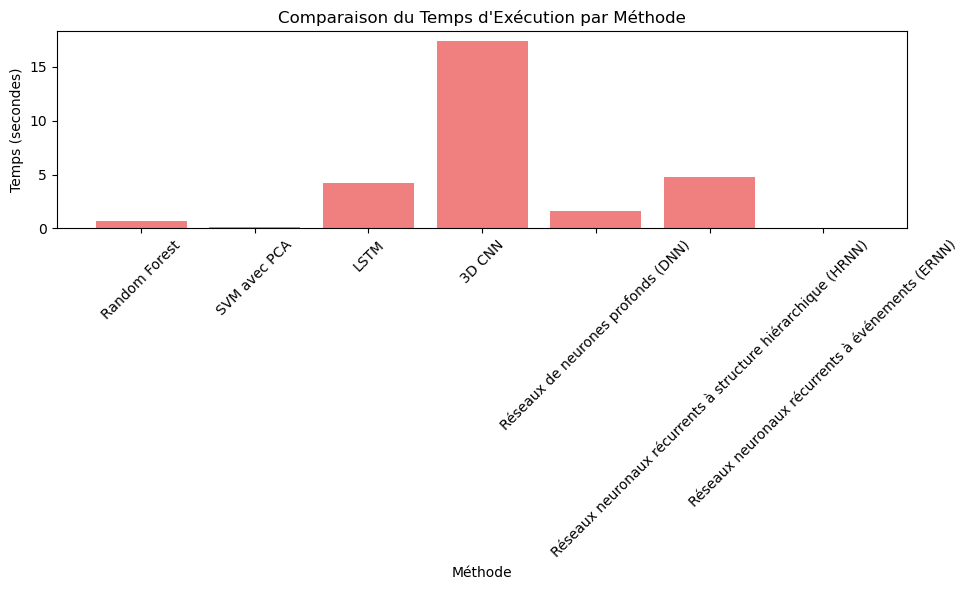

In [523]:
# 1. Graphique de comparaison de précision :

plt.figure(figsize=(10, 6))
plt.bar(comparison_results['Méthode'], comparison_results['Précision'], color='skyblue')
plt.title('Comparaison de la Précision par Méthode')
plt.xlabel('Méthode')
plt.ylabel('Précision')
plt.ylim(0, 1.0)  # Ajustez cette plage en fonction de vos données
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Graphique de comparaison de temps d'exécution :

plt.figure(figsize=(10, 6))
plt.bar(comparison_results['Méthode'], comparison_results['Temps (secondes)'], color='lightcoral')
plt.title('Comparaison du Temps d\'Exécution par Méthode')
plt.xlabel('Méthode')
plt.ylabel('Temps (secondes)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
